<a href="https://colab.research.google.com/github/KaylumCassidy/BMCA3/blob/main/Predicting_Wind_Energy_Generation__C20323831_FYP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Predicting wind energy generation to enable transmission system operator (TSO) supply planning.**

This dissertation focuses on using high-frequency short-term weather forecasting to predict wind production in Ireland. The aim is to prepare microgrid control systems for periods of low wind power generation, crucial for stabilizing the country's energy mix. Clear objectives include testing predictive analytical techniques, finding the most accurate model algorithm, determining influential weather variables, and validating against existing models

## Irish weather data

### Import libraries

In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import io
import requests

import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
from plotly import tools
import plotly.figure_factory as ff
from plotly.subplots import make_subplots

import warnings
warnings.filterwarnings('ignore')

import matplotlib.pyplot as plt
plt.style.use('seaborn-whitegrid')

from datetime import tzinfo, timedelta, datetime
minDate = "2017-01-01 00:00:00"

In [ ]:
  # This Python 3 environment comes with many helpful analytics libraries installed
  # It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
  # For example, here's several helpful packages to load in

  import numpy as np # linear algebra
  import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

  import io
  import requests

  import plotly.offline as py
  py.init_notebook_mode(connected=True)
  import plotly.graph_objs as go
  from plotly import tools
  import plotly.figure_factory as ff
  from plotly.subplots import make_subplots

  import warnings
  warnings.filterwarnings('ignore')

  import matplotlib.pyplot as plt
  plt.style.use('seaborn-whitegrid')

  from datetime import tzinfo, timedelta, datetime, date

In [ ]:
minDate = "2017-01-01 00:00:00"

### Loading MerEire dataset 2017-2023

This dataset is from MetEire website form 2017-2023 I choose 7 weather station(Dublin Airport, Shannon Airport, Mayo, Donegal, Galway, Cork) each recroding every hour of evvery day. (Dataset colm meaning in photo below)

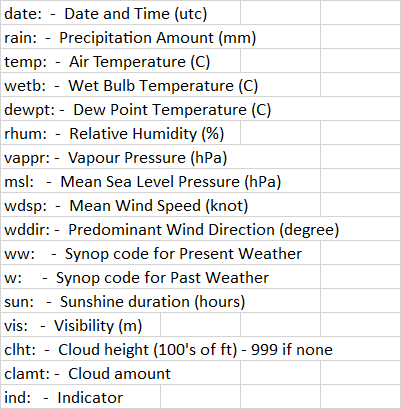![image.png]()

**CORK**

In [ ]:
import pandas as pd
import requests
from io import StringIO

github_raw_url = 'https://raw.githubusercontent.com/KaylumCassidy/FYP/main/CorkAirport.csv'

# Fetch the content of the file
response = requests.get(github_raw_url)
s = response.content

# Read the CSV file into a pandas DataFrame
corkairportds = pd.read_csv(StringIO(s.decode('utf-8')))

# Display the column names
print(corkairportds.columns)

# Convert the 'date' column to datetime format
corkairportds['date'] = pd.to_datetime(corkairportds['date'], format='%d/%m/%Y %H:%M', errors='ignore')

# Fix the 'wdsp' column with space value
corkairportds['wdsp'].replace(to_replace=' ', value=0, inplace=True)
corkairportds['wdsp'] = corkairportds['wdsp'].astype('float32')  # Change to float if necessary

# Replace "your_min_date_here" with an actual minimum date in the correct format
minDate = pd.to_datetime('01/01/2017 00:00', format='%d/%m/%Y %H:%M')  # Adjust the date and format as needed

# Reduce the timeframe
corkairportds = corkairportds[corkairportds['date'] >= minDate]



Index(['date', 'ind', 'rain', 'ind.1', 'temp', 'ind.2', 'wetb', 'dewpt',
       'vappr', 'rhum', 'msl', 'ind.3', 'wdsp', 'ind.4', 'wddir', 'ww', 'w',
       'sun', 'vis', 'clht', 'clamt'],
      dtype='object')


**Shannon Airport**

In [ ]:
import pandas as pd
import requests
from io import StringIO

github_raw_url = 'https://raw.githubusercontent.com/KaylumCassidy/FYP/main/ShannonAirport.csv'

# Fetch the content of the file
response = requests.get(github_raw_url)
s = response.content

# Read the CSV file into a pandas DataFrame
shannonAirport = pd.read_csv(StringIO(s.decode('utf-8')))

# Display the column names
print(shannonAirport.columns)

# Convert the 'date' column to datetime format
shannonAirport['date'] = pd.to_datetime(shannonAirport['date'], format='%d/%m/%Y %H:%M', errors='ignore')

# Fix the 'wdsp' column with space value
shannonAirport['wdsp'].replace(to_replace=' ', value=0, inplace=True)
shannonAirport['wdsp'] = shannonAirport['wdsp'].astype('float32')  # Change to float if necessary

# Replace "your_min_date_here" with an actual minimum date in the correct format
minDate = pd.to_datetime('01/01/2017 00:00', format='%d/%m/%Y %H:%M')  # Adjust the date and format as needed

# Reduce the timeframe
shannonAirport = shannonAirport[shannonAirport['date'] >= minDate]



Index(['date', 'ind', 'rain', 'ind.1', 'temp', 'ind.2', 'wetb', 'dewpt',
       'vappr', 'rhum', 'msl', 'ind.3', 'wdsp', 'ind.4', 'wddir', 'ww', 'w',
       'sun', 'vis', 'clht', 'clamt'],
      dtype='object')


**Galway**

In [ ]:
import pandas as pd
import requests
from io import StringIO


github_raw_url = 'https://raw.githubusercontent.com/KaylumCassidy/FYP/main/Galway.csv'

# Fetch the content of the file
response = requests.get(github_raw_url)
s = response.content

# Read the CSV file into a pandas DataFrame
galway = pd.read_csv(StringIO(s.decode('utf-8')))

# Display the column names
print(galway.columns)

# Convert the 'date' column to datetime format
galway['date'] = pd.to_datetime(galway['date'], format='%d/%m/%Y %H:%M', errors='ignore')

# Fix the 'wdsp' column with space value
galway['wdsp'].replace(to_replace=' ', value=0, inplace=True)
galway['wdsp'] = galway['wdsp'].astype('float32')  # Change to float if necessary

# Replace "your_min_date_here" with an actual minimum date in the correct format
minDate = pd.to_datetime('01/01/2017 00:00', format='%d/%m/%Y %H:%M')  # Adjust the date and format as needed

# Reduce the timeframe
galway = galway[galway['date'] >= minDate]



Index(['date', 'ind', 'rain', 'ind.1', 'temp', 'ind.2', 'wetb', 'dewpt',
       'vappr', 'rhum', 'msl', 'ind.3', 'wdsp', 'ind.4', 'wddir'],
      dtype='object')


**Dublin Airport**

In [ ]:
import pandas as pd
import requests
from io import StringIO

github_raw_url = 'https://raw.githubusercontent.com/KaylumCassidy/FYP/main/DublinAirport.csv'

# Fetch the content of the file
response = requests.get(github_raw_url)
s = response.content

# Read the CSV file into a pandas DataFrame
dublinairportds = pd.read_csv(StringIO(s.decode('utf-8')))

# Display the column names
print(dublinairportds.columns)

# Convert the 'date' column to datetime format
dublinairportds['date'] = pd.to_datetime(dublinairportds['date'], format='%d/%m/%Y %H:%M', errors='ignore')

# Fix the 'wdsp' column with space value
dublinairportds['wdsp'].replace(to_replace=' ', value=0, inplace=True)
dublinairportds['wdsp'] = dublinairportds['wdsp'].astype('float32')  # Change to float if necessary

# Replace "your_min_date_here" with an actual minimum date in the correct format
minDate = pd.to_datetime('01/01/2017 00:00', format='%d/%m/%Y %H:%M')  # Adjust the date and format as needed

# Reduce the timeframe
dublinairportds = dublinairportds[dublinairportds['date'] >= minDate]


Index(['date', 'ind', 'rain', 'ind.1', 'temp', 'ind.2', 'wetb', 'dewpt',
       'vappr', 'rhum', 'msl', 'ind.3', 'wdsp', 'ind.4', 'wddir', 'ww', 'w',
       'sun', 'vis', 'clht', 'clamt'],
      dtype='object')


In [ ]:
dublinairportds.describe()

,ind,rain,ind.1,temp,ind.2,wetb,dewpt,vappr,rhum,msl,ind.3,wdsp,ind.4,wddir,ww,w,sun,clht,clamt
count,61345.000000,61345.000000,61345.000000,61345.000000,61345.000000,61345.000000,61345.00000,61345.000000,61345.000000,61345.000000,61345.000000,61345.000000,61345.000000,61345.000000,61345.000000,61345.000000,61345.000000,61345.000000,61345.000000
mean,0.493765,0.087166,0.019594,10.113817,0.027614,8.597198,6.93634,10.400083,81.755172,1013.401697,2.000065,9.475866,2.000065,206.367919,14.756769,29.447388,0.169494,286.170055,5.583797
std,0.980092,0.420248,0.138602,5.062082,0.163866,4.457445,4.52180,3.173393,11.991678,12.671529,0.011420,4.681316,0.011420,81.329671,22.707006,26.964605,0.323256,401.147943,2.223360
min,0.000000,0.000000,0.000000,-5.600000,0.000000,-5.900000,-8.90000,3.100000,24.000000,961.800000,2.000000,0.000000,2.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,6.600000,0.000000,5.400000,3.60000,7.900000,74.000000,1005.400000,2.000000,6.000000,2.000000,140.000000,2.000000,11.000000,0.000000,24.000000,4.000000
50%,0.000000,0.000000,0.000000,10.100000,0.000000,8.700000,7.10000,10.100000,84.000000,1014.900000,2.000000,9.000000,2.000000,230.000000,2.000000,11.000000,0.000000,50.000000,7.000000
75%,0.000000,0.000000,0.000000,13.700000,0.000000,12.000000,10.20000,12.500000,91.000000,1022.300000,2.000000,12.000000,2.000000,270.000000,21.000000,62.000000,0.100000,250.000000,7.000000
max,3.000000,13.800000,1.000000,29.100000,1.000000,21.400000,19.50000,22.600000,100.000000,1048.200000,4.000000,44.000000,4.000000,360.000000,97.000000,98.000000,1.000000,999.000000,9.000000


**Malin Head(Donengal)**

In [ ]:
import pandas as pd
import requests
from io import StringIO

github_raw_url = 'https://raw.githubusercontent.com/KaylumCassidy/FYP/main/Malin%20Head.csv'

# Fetch the content of the file
response = requests.get(github_raw_url)
s = response.content

# Read the CSV file into a pandas DataFrame
malinHead = pd.read_csv(StringIO(s.decode('utf-8')))

# Display the column names
print(malinHead.columns)

# Convert the 'date' column to datetime format
malinHead['date'] = pd.to_datetime(malinHead['date'], format='%d/%m/%Y %H:%M', errors='ignore')

# Fix the 'wdsp' column with space value
malinHead['wdsp'].replace(to_replace=' ', value=0, inplace=True)
malinHead['wdsp'] = malinHead['wdsp'].astype('float32')  # Change to float if necessary

# Replace "your_min_date_here" with an actual minimum date in the correct format
minDate = pd.to_datetime('01/01/2017 00:00', format='%d/%m/%Y %H:%M')  # Adjust the date and format as needed

# Reduce the timeframe
malinHead = malinHead[malinHead['date'] >= minDate]



Index(['date', 'ind', 'rain', 'ind.1', 'temp', 'ind.2', 'wetb', 'dewpt',
       'vappr', 'rhum', 'msl', 'ind.3', 'wdsp', 'ind.4', 'wddir'],
      dtype='object')


**BELMULLET**

In [ ]:
import pandas as pd
import requests
from io import StringIO

github_raw_url = 'https://raw.githubusercontent.com/KaylumCassidy/FYP/main/BELMULLET.csv'

# Fetch the content of the file
response = requests.get(github_raw_url)
s = response.content

# Read the CSV file into a pandas DataFrame
belmullet = pd.read_csv(StringIO(s.decode('utf-8')))

# Display the column names
print(belmullet.columns)

# Convert the 'date' column to datetime format
belmullet['date'] = pd.to_datetime(belmullet['date'], format='%d/%m/%Y %H:%M', errors='ignore')

# Fix the 'wdsp' column with space value
belmullet['wdsp'].replace(to_replace=' ', value=0, inplace=True)
belmullet['wdsp'] = belmullet['wdsp'].astype('float32')  # Change to float if necessary

# Replace "your_min_date_here" with an actual minimum date in the correct format
minDate = pd.to_datetime('01/01/2017 00:00', format='%d/%m/%Y %H:%M')  # Adjust the date and format as needed

# Reduce the timeframe
belmullet = belmullet[belmullet['date'] >= minDate]

# Now you can continue with your data analysis or processi

Index(['date', 'ind', 'rain', 'ind.1', 'temp', 'ind.2', 'wetb', 'dewpt',
       'vappr', 'rhum', 'msl', 'ind.3', 'wdsp', 'ind.4', 'wddir'],
      dtype='object')


### Merge Irish weather Dataset*

In [ ]:
left = belmullet.set_index(['date']).copy()
right = dublinairportds.set_index(['date'])
#right.index = right.index.tz_convert(None)

newdf = left.join(right, lsuffix="_BEL", rsuffix="_DUB")

right = shannonAirport.set_index(['date'])
newdf = newdf.join(right, lsuffix="", rsuffix="_SHA")

right = corkairportds.set_index(['date'])
newdf = newdf.join(right, lsuffix="", rsuffix="_COR")

right = galway.set_index(['date'])
newdf = newdf.join(right, lsuffix="", rsuffix="_GAL")

right = malinHead.set_index(['date'])
newdf = newdf.join(right, lsuffix="", rsuffix="_DON")

newdf = newdf.reset_index()

In [ ]:

newdf.columns

Index(['date', 'ind_BEL', 'rain_BEL', 'ind.1_BEL', 'temp_BEL', 'ind.2_BEL',
       'wetb_BEL', 'dewpt_BEL', 'vappr_BEL', 'rhum_BEL',
       ...
       'ind.2_DON', 'wetb_DON', 'dewpt_DON', 'vappr_DON', 'rhum_DON',
       'msl_DON', 'ind.3_DON', 'wdsp_DON', 'ind.4_DON', 'wddir_DON'],
      dtype='object', length=103)

In [ ]:

newdf

,date,ind_BEL,rain_BEL,ind.1_BEL,temp_BEL,ind.2_BEL,wetb_BEL,dewpt_BEL,vappr_BEL,rhum_BEL,...,ind.2_DON,wetb_DON,dewpt_DON,vappr_DON,rhum_DON,msl_DON,ind.3_DON,wdsp_DON,ind.4_DON,wddir_DON
0,2017-01-01 00:00:00,0,0.0,0,5.2,0,3.9,2.0,7.1,79,...,0,4.3,1.4,6.7,70,1020.6,2,19.0,2,340
1,2017-01-01 01:00:00,0,0.5,0,4.7,0,3.4,1.4,6.8,78,...,0,4.1,2.2,7.2,80,1021.1,2,22.0,2,340
2,2017-01-01 02:00:00,0,0.0,0,5.7,0,3.8,0.7,6.4,70,...,0,4.1,1.0,6.6,69,1021.6,2,24.0,2,350
3,2017-01-01 03:00:00,0,0.4,0,5.6,0,3.3,-0.6,5.9,64,...,0,4.5,1.6,6.8,70,1022.0,2,23.0,2,360
4,2017-01-01 04:00:00,0,0.6,0,4.7,0,3.1,0.5,6.3,74,...,0,4.6,1.7,6.9,71,1022.4,2,27.0,2,360
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61340,2023-12-31 20:00:00,0,0.1,0,8.2,0,6.5,4.3,8.3,76,...,0,6.6,5.6,9.1,89,985.0,2,25.0,2,300
61341,2023-12-31 21:00:00,0,0.0,0,7.6,0,5.9,3.7,8.0,76,...,0,6.2,5.2,8.8,88,986.4,2,32.0,2,310
61342,2023-12-31 22:00:00,0,0.0,0,7.5,0,5.9,3.6,7.9,76,...,0,6.6,5.3,8.9,85,988.0,2,27.0,2,320
61343,2023-12-31 23:00:00,0,0.1,0,7.4,0,5.7,3.4,7.8,75,...,0,6.3,4.4,8.4,79,988.7,2,23.0,2,310


In [ ]:
newdf['wdsp_BEL'].describe()

count    61345.000000
mean        11.884114
std          6.536866
min          0.000000
25%          7.000000
50%         11.000000
75%         16.000000
max         45.000000
Name: wdsp_BEL, dtype: float64

In [ ]:

newdf.to_csv("IrelandWeatherData.csv", index=False)

## Eirgrid data

### Import libraries

In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import io
import requests


from plotly.offline import iplot
import plotly.graph_objs as go
from plotly import tools
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import plotly.figure_factory as ff

import warnings
warnings.filterwarnings('ignore')

import matplotlib.pyplot as plt
plt.style.use('seaborn-whitegrid')

from datetime import tzinfo, timedelta, datetime, date

# Any results you write to the current directory are saved as output.

import plotly.express as px
import seaborn as sns

### Data Scraping Eirgrid data

This data was scape form EirGrid Dashbored - https://www.smartgriddashboard.com/#all/wind

**Eirgrid Wind generation**

In [ ]:

#sample_url  = 'https://www.smartgriddashboard.com/DashboardService.svc/data?area=windactual&region=ALL&datefrom=01-Jan-2022+00%3A00&dateto=31-Jan-2023+23%3A59'

sample_url = 'http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=windActual&region=ALL&datefrom=01-Jan-2018%2000:00&dateto=31-Jan-2018%2023:59'

url_base = 'http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=windActual&region=ALL&datefrom=01-'
url_mid = '%2000:00&dateto='
url_end = '%2023:59'

years = ['2017', '2018', '2019', '2020', '2021']
  #years = ['2020', '2021']
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
endDay= [31, 28, 31, 30, 31, 30, 31, 31, 30, 31, 30, 31]
tempds = []
months_years = []

for year in years:
    i = 0
    for month in months:
      # Stop after Aug 2021
      endday = endDay[i]
      if (year == '2021') & (month == 'Oct'):
        break
      elif (year == '2020') & (month == 'Feb'):
        endday = 29

      url = url_base + month + '-' + year + url_mid + str(endday) + '-' + month + '-' + year + url_end
      i = i+1
      print(url)
      s = requests.get(url).content

      mds = pd.read_csv(io.StringIO(s.decode('utf-8')), na_values='-')
      mds['date'] = pd.to_datetime(mds["DATE & TIME"], infer_datetime_format=True, errors='ignore')
      DT = pd.to_datetime(mds["DATE & TIME"], infer_datetime_format=True, errors='ignore').dt
      mds['Year'] = DT.year
      mds['Month'] = DT.strftime('%b')
      mds['DayTime'] = DT.strftime('%d, %R')
      tempds.append(mds)
      months_years.append(month + '-' + year)


wgds = pd.concat(tempds, keys=months_years)

wgds = wgds.reset_index()
wgds = wgds.drop('level_0', axis=1)
wgds = wgds.drop('level_1', axis=1)
wgds = wgds.drop('DATE & TIME', axis=1)



http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=windActual&region=ALL&datefrom=01-Jan-2017%2000:00&dateto=31-Jan-2017%2023:59
http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=windActual&region=ALL&datefrom=01-Feb-2017%2000:00&dateto=28-Feb-2017%2023:59
http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=windActual&region=ALL&datefrom=01-Mar-2017%2000:00&dateto=31-Mar-2017%2023:59
http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=windActual&region=ALL&datefrom=01-Apr-2017%2000:00&dateto=30-Apr-2017%2023:59
http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=windActual&region=ALL&datefrom=01-May-2017%2000:00&dateto=31-May-2017%2023:59
http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=windActual&region=ALL&datefrom=01-Jun-2017%2000:00&dateto=30-Jun-2017%2023:59
http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=windActual&region=ALL&datefrom=01-Jul-2017%2000:00&datet

**Eirgrid Actual System Generation**

In [ ]:

  # Wind energy Actual and Prediction
sample_url = 'http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=generationActual&region=ALL&datefrom=23-Jan-2021%2000:00&dateto=21-Feb-2021%2001:15'

url_base = 'http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=generationActual&region=ALL&datefrom=01-'

tempds = []
months_years = []

for year in years:
    i = 0
    for month in months:
      # Stop after Feb 2021
      endday = endDay[i]
      if (year == '2021') & (month == 'Oct'):
        break
      elif (year == '2020') & (month == 'Feb'):
        endday = 29

      url = url_base + month + '-' + year + url_mid + str(endday) + '-' + month + '-' + year + url_end
      i = i+1
      print(url)
      s = requests.get(url).content

      mds = pd.read_csv(io.StringIO(s.decode('utf-8')), na_values='-')
      mds['date'] = pd.to_datetime(mds["DATE & TIME"], infer_datetime_format=True, errors='ignore')
      DT = pd.to_datetime(mds["DATE & TIME"], infer_datetime_format=True, errors='ignore').dt
      mds['Year'] = DT.year
      mds['Month'] = DT.strftime('%b')
      mds['DayTime'] = DT.strftime('%d, %R')
      tempds.append(mds)
      months_years.append(month + '-' + year)
      #url = 'http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=windActual&region=ALL&datefrom=01-Dec-2020%2000:00&dateto=31-Dec-2020%2023:59'


sgds = pd.concat(tempds, keys=months_years)

sgds = sgds.reset_index()
sgds = sgds.drop('level_0', axis=1)
sgds = sgds.drop('level_1', axis=1)
sgds = sgds.drop('DATE & TIME', axis=1)

http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=generationActual&region=ALL&datefrom=01-Jan-2017%2000:00&dateto=31-Jan-2017%2023:59
http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=generationActual&region=ALL&datefrom=01-Feb-2017%2000:00&dateto=28-Feb-2017%2023:59
http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=generationActual&region=ALL&datefrom=01-Mar-2017%2000:00&dateto=31-Mar-2017%2023:59
http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=generationActual&region=ALL&datefrom=01-Apr-2017%2000:00&dateto=30-Apr-2017%2023:59
http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=generationActual&region=ALL&datefrom=01-May-2017%2000:00&dateto=31-May-2017%2023:59
http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=generationActual&region=ALL&datefrom=01-Jun-2017%2000:00&dateto=30-Jun-2017%2023:59
http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=generationActual&reg

**System Demand: Actual and Prediction**

In [ ]:
  # Demand Actual and Prediction
sample_url = 'http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=demandActual&region=ALL&datefrom=18-Jan-2021%2000:00&dateto=16-Feb-2021%2023:59'
url_base = 'http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=demandActual&region=ALL&datefrom=01-'

i = 0
tempds = []

for year in years:
    i = 0
    for month in months:
       # Stop after Feb 2021
      endday = endDay[i]
      if (year == '2021') & (month == 'Oct'):
        break
      elif (year == '2020') & (month == 'Feb'):
        endday = 29
      url = url_base + month + '-' + year + url_mid + str(endday) + '-' + month + '-' + year + url_end
      i = i+1
      print(url)
      s = requests.get(url).content

      mds = pd.read_csv(io.StringIO(s.decode('utf-8')), na_values='-')
      mds['date'] = pd.to_datetime(mds["DATE & TIME"], infer_datetime_format=True, errors='ignore')
      DT = pd.to_datetime(mds["DATE & TIME"], infer_datetime_format=True, errors='ignore').dt
      mds['Year'] = DT.year
      mds['Month'] = DT.strftime('%b')
      mds['DayTime'] = DT.strftime('%d, %R')
      tempds.append(mds)

sdds = pd.concat(tempds, keys=months_years)
sdds = sdds.reset_index()
sdds = sdds.drop('level_0', axis=1)
sdds = sdds.drop('level_1', axis=1)
sdds = sdds.drop('DATE & TIME', axis=1)

http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=demandActual&region=ALL&datefrom=01-Jan-2017%2000:00&dateto=31-Jan-2017%2023:59
http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=demandActual&region=ALL&datefrom=01-Feb-2017%2000:00&dateto=28-Feb-2017%2023:59
http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=demandActual&region=ALL&datefrom=01-Mar-2017%2000:00&dateto=31-Mar-2017%2023:59
http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=demandActual&region=ALL&datefrom=01-Apr-2017%2000:00&dateto=30-Apr-2017%2023:59
http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=demandActual&region=ALL&datefrom=01-May-2017%2000:00&dateto=31-May-2017%2023:59
http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=demandActual&region=ALL&datefrom=01-Jun-2017%2000:00&dateto=30-Jun-2017%2023:59
http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=demandActual&region=ALL&datefrom=01-Jul-2017

In [ ]:


  # Interconnections Actual and Prediction
sample_url = 'http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=interconnection&region=ALL&datefrom=27-Jan-2021%2000:00&dateto=25-Feb-2021%2022:00'
url_base = 'http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=interconnection&region=ALL&datefrom=01-'

url_mid = '%2000:00&dateto='
url_end = '%2023:59'

tempds = []
months_years = []

i = 0
tempds = []

for year in years:
    i = 0
    for month in months:
      # Stop after Feb 2021
      endday = endDay[i]
      if (year == '2021') & (month == 'Oct'):
        break
      elif (year == '2020') & (month == 'Feb'):
        endday = 29
      url = url_base + month + '-' + year + url_mid + str(endday) + '-' + month + '-' + year + url_end
      i = i+1
      print(url)
      s = requests.get(url).content

      mds = pd.read_csv(io.StringIO(s.decode('utf-8')), na_values='-')
      mds['date'] = pd.to_datetime(mds["DATE & TIME"], infer_datetime_format=True, errors='ignore')
      DT = pd.to_datetime(mds["DATE & TIME"], infer_datetime_format=True, errors='ignore').dt
      mds['Year'] = DT.year
      mds['Month'] = DT.strftime('%b')
      mds['DayTime'] = DT.strftime('%d, %R')
      tempds.append(mds)
      months_years.append(month + '-' + year)

icds = pd.concat(tempds, keys=months_years)
icds = icds.reset_index()
icds = icds.drop('level_0', axis=1)
icds = icds.drop('level_1', axis=1)
icds = icds.drop('DATE & TIME', axis=1)


http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=interconnection&region=ALL&datefrom=01-Jan-2017%2000:00&dateto=31-Jan-2017%2023:59
http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=interconnection&region=ALL&datefrom=01-Feb-2017%2000:00&dateto=28-Feb-2017%2023:59
http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=interconnection&region=ALL&datefrom=01-Mar-2017%2000:00&dateto=31-Mar-2017%2023:59
http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=interconnection&region=ALL&datefrom=01-Apr-2017%2000:00&dateto=30-Apr-2017%2023:59
http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=interconnection&region=ALL&datefrom=01-May-2017%2000:00&dateto=31-May-2017%2023:59
http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=interconnection&region=ALL&datefrom=01-Jun-2017%2000:00&dateto=30-Jun-2017%2023:59
http://smartgriddashboard.eirgrid.com/DashboardService.svc/csv?area=interconnection&region=ALL

### Merge all of EirGrid data based on Date

In [ ]:

left = sdds.set_index(['date', 'Year', 'Month', 'DayTime', ' REGION'])
middle = wgds.set_index(['date', 'Year', 'Month', 'DayTime', ' REGION'])
right = sgds.set_index(['date', 'Year', 'Month', 'DayTime', ' REGION'])
  #right.index = right.index.tz_convert(None)

newdf2 = left.join(middle)
newdf2 = newdf2.join(right)
newdf2 = newdf2.reset_index()

newdf2 = newdf2.rename(columns={' ACTUAL DEMAND(MW)' : 'ActualDemandMW'})
newdf2 = newdf2.rename(columns={'  ACTUAL WIND(MW)' : 'ActualWindMW'})

newdf2 = newdf2.rename(columns={' FORECAST WIND(MW)' : 'ForecastWndMW'})
newdf2 = newdf2.rename(columns={' ACTUAL GENERATION(MW)' : 'ActualGenerationMW'})


  # Region doesn't apply to Interconnections
left = newdf2.set_index(['date', 'Year', 'Month', 'DayTime'])
right = icds.set_index(['date', 'Year', 'Month', 'DayTime'])
newdf2 = left.join(right)
newdf2 = newdf2.reset_index()
newdf2 = newdf2.rename(columns={' NET TOTAL(MW)': 'NetTotal_MW'})
newdf2 = newdf2.rename(columns={' EWIC(MW)': 'EWIC_MW'})
newdf2 = newdf2.rename(columns={' MOYLE(MW)': 'MOYLE_MW'})

newdf2.to_csv("IslandElectricityOnly2017_2020v3.csv")


def settimeatt(row):
    row["hour"] = row.date.hour
    row["isweekday"] = (row.date.isoweekday() < 6)
    row["month"] = row.date.month
    row["year"] = row.date.year
    return row
newdf2 = newdf2.apply(settimeatt, axis='columns')

newdf2.head()

,date,Year,Month,DayTime,REGION,ActualDemandMW,FORECAST DEMAND(MW),ForecastWndMW,ActualWindMW,ActualGenerationMW,NetTotal_MW,EWIC_MW,MOYLE_MW,hour,isweekday,month,year
0,2017-01-01 00:00:00,2017,Jan,"01, 00:00",All Island,3696.0,NaN,1172.0,1214.0,4126.0,-448.0,-170.0,-278.0,0,False,1,2017
1,2017-01-01 00:15:00,2017,Jan,"01, 00:15",All Island,3661.0,NaN,1198.0,1168.0,4184.0,-541.0,-244.0,-297.0,0,False,1,2017
2,2017-01-01 00:30:00,2017,Jan,"01, 00:30",All Island,3622.0,NaN,1224.0,1131.0,4187.0,-583.0,-286.0,-297.0,0,False,1,2017
3,2017-01-01 00:45:00,2017,Jan,"01, 00:45",All Island,3492.0,NaN,1250.0,1025.0,4059.0,-585.0,-287.0,-298.0,0,False,1,2017
4,2017-01-01 01:00:00,2017,Jan,"01, 01:00",All Island,3457.0,NaN,1280.0,1123.0,4094.0,-584.0,-287.0,-297.0,1,False,1,2017


In [ ]:
  #fileP = 'IslandElectricityOnly2017_2020v3.csv'
fileP = 'IslandElectricityOnly2017_2020v3.csv'
newdf = pd.read_csv(fileP, parse_dates=[1])

newdf["hour"] = 0
newdf["isweekday"] = False
newdf["month"] = 0
newdf["year"] = 0

def settimeatt(row):
    row["hour"] = row.date.hour
    row["isweekday"] = (row.date.isoweekday() < 6)
    row["month"] = row.date.month
    row["year"] = row.date.year
    return row
newdf = newdf.apply(settimeatt, axis='columns')

newdf.head()

,Unnamed: 0,date,Year,Month,DayTime,REGION,ActualDemandMW,FORECAST DEMAND(MW),ForecastWndMW,ActualWindMW,ActualGenerationMW,NetTotal_MW,EWIC_MW,MOYLE_MW,hour,isweekday,month,year
0,0,2017-01-01 00:00:00,2017,Jan,"01, 00:00",All Island,3696.0,NaN,1172.0,1214.0,4126.0,-448.0,-170.0,-278.0,0,False,1,2017
1,1,2017-01-01 00:15:00,2017,Jan,"01, 00:15",All Island,3661.0,NaN,1198.0,1168.0,4184.0,-541.0,-244.0,-297.0,0,False,1,2017
2,2,2017-01-01 00:30:00,2017,Jan,"01, 00:30",All Island,3622.0,NaN,1224.0,1131.0,4187.0,-583.0,-286.0,-297.0,0,False,1,2017
3,3,2017-01-01 00:45:00,2017,Jan,"01, 00:45",All Island,3492.0,NaN,1250.0,1025.0,4059.0,-585.0,-287.0,-298.0,0,False,1,2017
4,4,2017-01-01 01:00:00,2017,Jan,"01, 01:00",All Island,3457.0,NaN,1280.0,1123.0,4094.0,-584.0,-287.0,-297.0,1,False,1,2017


In [ ]:
newdf.columns

Index(['Unnamed: 0', 'date', 'Year', 'Month', 'DayTime', ' REGION',
       'ActualDemandMW', ' FORECAST DEMAND(MW)', 'ForecastWndMW',
       'ActualWindMW', 'ActualGenerationMW', 'NetTotal_MW', 'EWIC_MW',
       'MOYLE_MW', 'hour', 'isweekday', 'month', 'year'],
      dtype='object')

In [ ]:

# Checking how many months do we have in our dataset (if the year is complete)
newdf.month.unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12])

In [ ]:

print('-----------DATA SIZE -------------')
print(newdf.shape)           # 10 Columns, 35044 rows
count_row = newdf.shape[0]   # 10 Columns
count_col = newdf.shape[1]   # 35044 rows
print('Rows: ', count_row, ', Columns: ', count_col)

print('-----------DATA INFO -------------')
print(newdf.info())

print('-----------DATA MAX Values -------------')
newdf.max()

print('-----------DATA COLUMNS-------------')
columns = newdf.columns.values.tolist()
print (columns)

print('-----------BASIC STATISTICS-------------')
newdf.tail()

-----------DATA SIZE -------------
(166480, 18)
Rows:  166480 , Columns:  18
-----------DATA INFO -------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 166480 entries, 0 to 166479
Data columns (total 18 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   Unnamed: 0            166480 non-null  int64         
 1   date                  166480 non-null  datetime64[ns]
 2   Year                  166480 non-null  int64         
 3   Month                 166480 non-null  object        
 4   DayTime               166480 non-null  object        
 5    REGION               166480 non-null  object        
 6   ActualDemandMW        166410 non-null  float64       
 7    FORECAST DEMAND(MW)  0 non-null       float64       
 8   ForecastWndMW         166341 non-null  float64       
 9   ActualWindMW          166410 non-null  float64       
 10  ActualGenerationMW    166410 non-null  float64       
 11  NetTo

,Unnamed: 0,date,Year,Month,DayTime,REGION,ActualDemandMW,FORECAST DEMAND(MW),ForecastWndMW,ActualWindMW,ActualGenerationMW,NetTotal_MW,EWIC_MW,MOYLE_MW,hour,isweekday,month,year
166475,166475,2021-09-30 22:45:00,2021,Sep,"30, 22:45",All Island,4168.0,NaN,3300.0,2416.0,4769.0,-612.0,-294.0,-318.0,22,True,9,2021
166476,166476,2021-09-30 23:00:00,2021,Sep,"30, 23:00",All Island,4041.0,NaN,3356.0,2409.0,4674.0,-645.0,-339.0,-306.0,23,True,9,2021
166477,166477,2021-09-30 23:15:00,2021,Sep,"30, 23:15",All Island,3901.0,NaN,3375.0,2462.0,4428.0,-535.0,-266.0,-269.0,23,True,9,2021
166478,166478,2021-09-30 23:30:00,2021,Sep,"30, 23:30",All Island,3797.0,NaN,3395.0,2567.0,4359.0,-500.0,-191.0,-309.0,23,True,9,2021
166479,166479,2021-09-30 23:45:00,2021,Sep,"30, 23:45",All Island,3705.0,NaN,3414.0,2532.0,4278.0,-508.0,-196.0,-312.0,23,True,9,2021


## Load Weather Data

In [ ]:
import pandas as pd
import requests
from io import StringIO

github_raw_url = 'https://raw.githubusercontent.com/KaylumCassidy/FYP/main/IrelandWeatherData.csv'

# Fetch the content of the file
response = requests.get(github_raw_url)
s = response.content

# Read the CSV file into a pandas DataFrame
weatherData = pd.read_csv(StringIO(s.decode('utf-8')))

# Display the column names
print(weatherData.columns)

weatherds = pd.read_csv("IrelandWeatherData(2).csv", na_values=" ")

weatherds

Index(['date', 'ind_BEL', 'rain_BEL', 'ind.1_BEL', 'temp_BEL', 'ind.2_BEL',
       'wetb_BEL', 'dewpt_BEL', 'vappr_BEL', 'rhum_BEL',
       ...
       'ind.2_DON', 'wetb_DON', 'dewpt_DON', 'vappr_DON', 'rhum_DON',
       'msl_DON', 'ind.3_DON', 'wdsp_DON', 'ind.4_DON', 'wddir_DON'],
      dtype='object', length=103)


,date,ind_BEL,rain_BEL,ind.1_BEL,temp_BEL,ind.2_BEL,wetb_BEL,dewpt_BEL,vappr_BEL,rhum_BEL,...,ind.2_DON,wetb_DON,dewpt_DON,vappr_DON,rhum_DON,msl_DON,ind.3_DON,wdsp_DON,ind.4_DON,wddir_DON
0,01/01/2017 00:00,0,0.0,0,5.2,0,3.9,2.0,7.1,79,...,0,4.3,1.4,6.7,70,1020.6,2,19,2,340.0
1,01/01/2017 01:00,0,0.5,0,4.7,0,3.4,1.4,6.8,78,...,0,4.1,2.2,7.2,80,1021.1,2,22,2,340.0
2,01/01/2017 02:00,0,0.0,0,5.7,0,3.8,0.7,6.4,70,...,0,4.1,1.0,6.6,69,1021.6,2,24,2,350.0
3,01/01/2017 03:00,0,0.4,0,5.6,0,3.3,-0.6,5.9,64,...,0,4.5,1.6,6.8,70,1022.0,2,23,2,360.0
4,01/01/2017 04:00,0,0.6,0,4.7,0,3.1,0.5,6.3,74,...,0,4.6,1.7,6.9,71,1022.4,2,27,2,360.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41612,30/09/2021 20:00,0,0.0,0,13.0,0,11.9,10.9,13.1,87,...,0,11.1,10.4,12.6,91,1001.1,2,11,2,210.0
41613,30/09/2021 21:00,0,0.0,0,12.8,0,11.9,11.1,13.2,89,...,0,10.9,10.3,12.5,92,1000.4,2,8,2,200.0
41614,30/09/2021 22:00,0,0.2,0,13.0,0,12.3,11.6,13.7,91,...,0,10.6,10.1,12.3,93,999.6,2,7,2,190.0
41615,30/09/2021 23:00,0,1.4,0,11.8,0,10.9,10.1,12.3,89,...,0,11.0,10.6,12.8,94,998.5,2,8,2,170.0


In [ ]:

weatherds.describe()

,ind_BEL,rain_BEL,ind.1_BEL,temp_BEL,ind.2_BEL,wetb_BEL,dewpt_BEL,vappr_BEL,rhum_BEL,msl_BEL,...,ind.2_DON,wetb_DON,dewpt_DON,vappr_DON,rhum_DON,msl_DON,ind.3_DON,wdsp_DON,ind.4_DON,wddir_DON
count,41617.0,41617.000000,41617.0,41617.000000,41617.0,41617.000000,41617.000000,41617.000000,41617.000000,41617.000000,...,41617.0,41617.000000,41617.000000,41617.000000,41617.000000,41617.000000,41617.0,41617.000000,41617.000000,41615.000000
mean,0.0,0.151734,0.0,10.526352,0.0,9.100848,7.490799,10.748379,81.810006,1012.057431,...,0.0,8.703477,7.054180,10.439527,81.351107,1011.589062,2.0,14.706754,2.000240,199.572510
std,0.0,0.494055,0.0,4.013934,0.0,3.813173,4.272689,3.065398,11.207680,13.183539,...,0.0,3.804861,4.294393,3.015872,9.886587,13.246404,0.0,7.277758,0.034661,86.750518
min,0.0,0.000000,0.0,-3.300000,0.0,-4.400000,-9.700000,2.900000,24.000000,959.100000,...,0.0,-3.000000,-7.900000,3.400000,20.000000,956.600000,2.0,1.000000,2.000000,10.000000
25%,0.0,0.000000,0.0,7.700000,0.0,6.300000,4.300000,8.300000,74.000000,1003.700000,...,0.0,5.800000,3.800000,8.000000,75.000000,1002.900000,2.0,9.000000,2.000000,140.000000
50%,0.0,0.000000,0.0,10.500000,0.0,9.200000,7.700000,10.500000,84.000000,1013.600000,...,0.0,8.700000,7.200000,10.100000,82.000000,1013.200000,2.0,14.000000,2.000000,200.000000
75%,0.0,0.000000,0.0,13.500000,0.0,12.000000,10.600000,12.800000,91.000000,1021.300000,...,0.0,11.700000,10.300000,12.500000,89.000000,1020.900000,2.0,19.000000,2.000000,260.000000
max,0.0,10.200000,0.0,28.000000,0.0,22.100000,19.400000,22.500000,100.000000,1050.600000,...,0.0,19.800000,17.900000,20.500000,100.000000,1051.200000,2.0,48.000000,7.000000,360.000000


In [ ]:
# Reduce timeframe 2017-07-01
cutOffDate = "2021-10-01 14:45:00"
weatherds = weatherds[(weatherds.date >= "2017-07-01 00:00:00") & (weatherds.date < cutOffDate)]

In [ ]:
weatherds.isnull().sum()[0:50]

date         0.0
ind_BEL      0.0
rain_BEL     0.0
ind.1_BEL    0.0
temp_BEL     0.0
ind.2_BEL    0.0
wetb_BEL     0.0
dewpt_BEL    0.0
vappr_BEL    0.0
rhum_BEL     0.0
msl_BEL      0.0
ind.3_BEL    0.0
wdsp_BEL     0.0
ind.4_BEL    0.0
wddir_BEL    0.0
ind_DUB      0.0
rain_DUB     0.0
ind.1_DUB    0.0
temp_DUB     0.0
ind.2_DUB    0.0
wetb_DUB     0.0
dewpt_DUB    0.0
vappr_DUB    0.0
rhum_DUB     0.0
msl_DUB      0.0
ind.3_DUB    0.0
wdsp_DUB     0.0
ind.4_DUB    0.0
wddir_DUB    0.0
ww           0.0
w            0.0
sun          0.0
vis          0.0
clht         0.0
clamt        0.0
ind          0.0
rain         0.0
ind.1        0.0
temp         0.0
ind.2        0.0
wetb         0.0
dewpt        0.0
vappr        0.0
rhum         0.0
msl          0.0
ind.3        0.0
wdsp         0.0
ind.4        0.0
wddir        0.0
ww_SHA       0.0
dtype: float64

In [ ]:
weatherds.isnull().sum()[50:120]

w_SHA        0.0
sun_SHA      0.0
vis_SHA      0.0
clht_SHA     0.0
clamt_SHA    0.0
ind_COR      0.0
rain_COR     0.0
ind.1_COR    0.0
temp_COR     0.0
ind.2_COR    0.0
wetb_COR     0.0
dewpt_COR    0.0
vappr_COR    0.0
rhum_COR     0.0
msl_COR      0.0
ind.3_COR    0.0
wdsp_COR     0.0
ind.4_COR    0.0
wddir_COR    0.0
ind_GAL      0.0
rain_GAL     0.0
ind.1_GAL    0.0
temp_GAL     0.0
ind.2_GAL    0.0
wetb_GAL     0.0
dewpt_GAL    0.0
vappr_GAL    0.0
rhum_GAL     0.0
msl_GAL      0.0
ind.3_GAL    0.0
wdsp_GAL     0.0
ind.4_GAL    0.0
wddir_GAL    0.0
ind_DON      0.0
rain_DON     0.0
ind.1_DON    0.0
temp_DON     0.0
ind.2_DON    0.0
wetb_DON     0.0
dewpt_DON    0.0
vappr_DON    0.0
rhum_DON     0.0
msl_DON      0.0
ind.3_DON    0.0
wdsp_DON     0.0
ind.4_DON    0.0
wddir_DON    0.0
dtype: float64

In [ ]:
# Backfill a few missing values
weatherds.fillna(method='ffill', limit=3, inplace=True)

## Merge MetEire and EireGrid dataset

In [ ]:
import pandas as pd

# Assuming df_weather is the DataFrame for the new dataset, and it has the datetime column named 'date'
weatherds['date'] = pd.to_datetime(weatherds['date'])

# Set the 'date' column as the index
weatherds.set_index('date', inplace=True)

# Assuming newdf_hourly is the DataFrame from the previous merging and hourly aggregation
newdf['date'] = pd.to_datetime(newdf['date'])
newdf.set_index('date', inplace=True)

# Merge the two DataFrames based on the 'date' column
merged_df = newdf.join(weatherds)

# Reset the index to have a regular 'date' column
merged_df.reset_index(inplace=True)

# Forward fill missing values
merged_df.fillna(method='ffill', inplace=True)

# Save the merged DataFrame to a new CSV file
merged_df.to_csv("MergedIslandData.csv", index=False)

## Remove dates between 0:15-0:45 and keep hour mark

converts the 'date' column to datetime format, sets it as the index, resamples the data to an hourly frequency, resets the index, and then prints the head of the resulting DataFrame.

In [ ]:

merged_df['date'] = pd.to_datetime(merged_df['date'])
merged_df = merged_df.set_index('date')

# Resample to hourly frequency
merged_df_hourly = merged_df.resample('H').first()

# Reset the index to get back the 'date' column
merged_df_hourly = merged_df_hourly.reset_index()

# Display the head of the new DataFrame
print(merged_df_hourly.head())

                 date  Unnamed: 0  Year Month    DayTime      REGION  \
0 2017-01-01 00:00:00           0  2017   Jan  01, 00:00  All Island   
1 2017-01-01 01:00:00           4  2017   Jan  01, 01:00  All Island   
2 2017-01-01 02:00:00           8  2017   Jan  01, 02:00  All Island   
3 2017-01-01 03:00:00          12  2017   Jan  01, 03:00  All Island   
4 2017-01-01 04:00:00          16  2017   Jan  01, 04:00  All Island   

   ActualDemandMW   FORECAST DEMAND(MW)  ForecastWndMW  ActualWindMW  ...  \
0          3696.0                   NaN         1172.0        1214.0  ...   
1          3457.0                   NaN         1280.0        1123.0  ...   
2          3244.0                   NaN         1398.0        1528.0  ...   
3          3005.0                   NaN         1361.0        1612.0  ...   
4          2847.0                   NaN         1364.0        1473.0  ...   

   ind.2_DON  wetb_DON  dewpt_DON  vappr_DON  rhum_DON  msl_DON  ind.3_DON  \
0        NaN       NaN    

So, the combination of resample('H') and first() effectively downsamples the original DataFrame to hourly intervals, choosing the first data point within each hour.

In [ ]:
# Assuming your new DataFrame is named merged_df_hourly
merged_df_hourly.to_csv("HourlyMergedData.csv", index=False)


Dropping unneeded colms

In [ ]:
# Unused indicator numbers
merged_df_hourly = merged_df_hourly.drop(['ind', 'ind.1', 'ind.2', 'ind.3', 'ind.4'], axis=1)
merged_df_hourly = merged_df_hourly.drop(['ind_BEL', 'ind.1_BEL', 'ind.2_BEL', 'ind.3_BEL', 'ind.4_BEL'], axis=1)
merged_df_hourly = merged_df_hourly.drop(['ind_COR', 'ind.1_COR', 'ind.2_COR', 'ind.3_COR', 'ind.4_COR'], axis=1)
merged_df_hourly = merged_df_hourly.drop(['ind_DUB', 'ind.1_DUB', 'ind.2_DUB', 'ind.3_DUB', 'ind.4_DUB'], axis=1)
merged_df_hourly = merged_df_hourly.drop(['ind_GAL', 'ind.1_GAL', 'ind.2_GAL', 'ind.3_GAL', 'ind.4_GAL'], axis=1)
merged_df_hourly = merged_df_hourly.drop(['ind.2_DON', 'ind.3_DON', 'ind.4_DON'], axis=1)


In [ ]:

merged_df_hourly.head()

,date,Unnamed: 0,Year,Month,DayTime,REGION,ActualDemandMW,FORECAST DEMAND(MW),ForecastWndMW,ActualWindMW,...,rain_DON,ind.1_DON,temp_DON,wetb_DON,dewpt_DON,vappr_DON,rhum_DON,msl_DON,wdsp_DON,wddir_DON
0,2017-01-01 00:00:00,0,2017,Jan,"01, 00:00",All Island,3696.0,NaN,1172.0,1214.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2017-01-01 01:00:00,4,2017,Jan,"01, 01:00",All Island,3457.0,NaN,1280.0,1123.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2017-01-01 02:00:00,8,2017,Jan,"01, 02:00",All Island,3244.0,NaN,1398.0,1528.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2017-01-01 03:00:00,12,2017,Jan,"01, 03:00",All Island,3005.0,NaN,1361.0,1612.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2017-01-01 04:00:00,16,2017,Jan,"01, 04:00",All Island,2847.0,NaN,1364.0,1473.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Assuming your new DataFrame is named merged_df_hourly
merged_df_hourly.to_csv("HourlyMergedData.csv", index=False)

In [ ]:

merged_df_hourly.columns

Index(['date', 'Unnamed: 0', 'Year', 'Month', 'DayTime', ' REGION',
       'ActualDemandMW', ' FORECAST DEMAND(MW)', 'ForecastWndMW',
       'ActualWindMW', 'ActualGenerationMW', 'NetTotal_MW', 'EWIC_MW',
       'MOYLE_MW', 'hour', 'isweekday', 'month', 'year', 'rain_BEL',
       'temp_BEL', 'wetb_BEL', 'dewpt_BEL', 'vappr_BEL', 'rhum_BEL', 'msl_BEL',
       'wdsp_BEL', 'wddir_BEL', 'rain_DUB', 'temp_DUB', 'wetb_DUB',
       'dewpt_DUB', 'vappr_DUB', 'rhum_DUB', 'msl_DUB', 'wdsp_DUB',
       'wddir_DUB', 'ww', 'w', 'sun', 'vis', 'clht', 'clamt', 'rain', 'temp',
       'wetb', 'dewpt', 'vappr', 'rhum', 'msl', 'wdsp', 'wddir', 'ww_SHA',
       'w_SHA', 'sun_SHA', 'vis_SHA', 'clht_SHA', 'clamt_SHA', 'rain_COR',
       'temp_COR', 'wetb_COR', 'dewpt_COR', 'vappr_COR', 'rhum_COR', 'msl_COR',
       'wdsp_COR', 'wddir_COR', 'rain_GAL', 'temp_GAL', 'wetb_GAL',
       'dewpt_GAL', 'vappr_GAL', 'rhum_GAL', 'msl_GAL', 'wdsp_GAL',
       'wddir_GAL', 'ind_DON', 'rain_DON', 'ind.1_DON', 'temp_DON'

## Wind capacity

In [ ]:
import pandas as pd

# Assuming the Excel file is uploaded as 'WindInstalledCapacities_MW_Monthly - Sheet1.xlsx'
file_path = 'WindInstalledCapacities_MW_Monthly - Sheet1.csv'

# Specify the engine as 'openpyxl' for reading Excel files
windcap_df = pd.read_csv(file_path)


# Display the first few rows of the DataFrame
windcap_df.head()


,YYYY,Mon,Month,TSO_IRE,DSO_IRE,Total_IRE,TSO_NI,DSO_NI,Total_NI,Total
0,1992,Jan,Jan-92,-,-,-,-,-,-,-
1,1992,Feb,Feb-92,-,-,-,-,-,-,-
2,1992,Mar,Mar-92,-,-,-,-,-,-,-
3,1992,Apr,Apr-92,-,-,-,-,-,-,-
4,1992,May,May-92,-,-,-,-,-,-,-


In [ ]:
windcap_df.tail(10)

,YYYY,Mon,Month,TSO_IRE,DSO_IRE,Total_IRE,TSO_NI,DSO_NI,Total_NI,Total
373,2023,Mar,Mar-23,"2,277.45","2,292.63","4,570.08",121.1,NaN,NaN,NaN
374,2023,Apr,Apr-23,"2,295.45","2,292.63","4,588.08",121.1,NaN,NaN,NaN
375,2023,May,May-23,"2,295.45","2,292.63","4,588.08",121.1,NaN,NaN,NaN
376,2023,Jun,Jun-23,"2,345.65","2,292.63","4,638.28",121.1,NaN,NaN,NaN
377,2023,Jul,Jul-23,"2,369.45","2,296.23","4,665.68",121.1,NaN,NaN,NaN
378,2023,Aug,Aug-23,"2,403.85","2,296.23","4,700.08",121.1,NaN,NaN,NaN
379,2023,Sep,Sep-23,"2,416.75","2,296.35","4,713.10",121.1,NaN,NaN,NaN
380,2023,Oct,Oct-23,"2,416.75",NaN,NaN,121.1,NaN,NaN,NaN
381,2023,Nov,Nov-23,"2,416.75",NaN,NaN,121.1,NaN,NaN,NaN
382,2023,Dec,Dec-23,"2,416.75",NaN,NaN,121.1,"1,243.21","1,364.31",NaN


In [ ]:
print(windcap_df.columns)


Index(['YYYY', 'Mon', 'Month', 'TSO_IRE', 'DSO_IRE', 'Total_IRE', 'TSO_NI',
       'DSO_NI', 'Total_NI', 'Total'],
      dtype='object')


In [ ]:
# Map abbreviated month names to numerical values
month_mapping = {
    'Jan': '01',
    'Feb': '02',
    'Mar': '03',
    'Apr': '04',
    'May': '05',
    'Jun': '06',
    'Jul': '07',
    'Aug': '08',
    'Sep': '09',
    'Oct': '10',
    'Nov': '11',
    'Dec': '12'
}

# Create a new column 'date' by combining 'YYYY' and 'Month' columns
windcap_df['date'] = windcap_df['YYYY'].astype(str) + '-' + windcap_df['Month'].map(month_mapping)

# Display the first few rows of the DataFrame
print(windcap_df.head())


   YYYY  Mon   Month TSO_IRE DSO_IRE Total_IRE  TSO_NI  DSO_NI Total_NI  \
0  1992  Jan  Jan-92    -       -         -       -       -        -      
1  1992  Feb  Feb-92    -       -         -       -       -        -      
2  1992  Mar  Mar-92    -       -         -       -       -        -      
3  1992  Apr  Apr-92    -       -         -       -       -        -      
4  1992  May  May-92    -       -         -       -       -        -      

    Total date  
0    -     NaN  
1    -     NaN  
2    -     NaN  
3    -     NaN  
4    -     NaN  


In [ ]:

windcapa_P = '/content/WindInstalledCapacities_MW_Monthly - Sheet1 (1).csv'
windcapa_df = pd.read_csv(windcapa_P, header=3, na_values=['-   ', "  -   "],
                          skipinitialspace=True, thousands=",")

In [ ]:

windcapa_df['day'] = "01-"
windcapa_df['date'] = windcapa_df['day'] + windcapa_df['Month']


In [ ]:
windcapa_df['date'] = pd.to_datetime(windcapa_df['date'].str.replace('.Sept.', '-Sep-', regex=True), format="%d-%b-%Y")

In [ ]:
windcapa_df.rename(columns={'Total.2' : 'TotalWindCapacityMW'}, inplace=True)

## Merge Wind capacity dataset with the hourly dataset

In [ ]:

left = merged_df_hourly.set_index(['date'])
right = windcapa_df[['date', 'TotalWindCapacityMW']].set_index(['date'])
merged_df_hourly_df = left.join(right)



In [ ]:

merged_df_hourly_df['TotalWindCapacityMW'].fillna(method='ffill', inplace=True)
merged_df_hourly_df = merged_df_hourly_df.reset_index()
merged_df_hourly_df.isnull().sum()

date                       0
Unnamed: 0                 0
Year                       0
Month                      0
DayTime                    0
                       ...  
rhum_DON               41616
msl_DON                41616
wdsp_DON               41616
wddir_DON              41616
TotalWindCapacityMW        0
Length: 87, dtype: int64

In [ ]:

merged_df_hourly_df.to_csv("IslandElectricity2017_2021v4.csv")

In [ ]:
merged_df_hourly_df.columns

Index(['date', 'Unnamed: 0', 'Year', 'Month', 'DayTime', ' REGION',
       'ActualDemandMW', ' FORECAST DEMAND(MW)', 'ForecastWndMW',
       'ActualWindMW', 'ActualGenerationMW', 'NetTotal_MW', 'EWIC_MW',
       'MOYLE_MW', 'hour', 'isweekday', 'month', 'year', 'rain_BEL',
       'temp_BEL', 'wetb_BEL', 'dewpt_BEL', 'vappr_BEL', 'rhum_BEL', 'msl_BEL',
       'wdsp_BEL', 'wddir_BEL', 'rain_DUB', 'temp_DUB', 'wetb_DUB',
       'dewpt_DUB', 'vappr_DUB', 'rhum_DUB', 'msl_DUB', 'wdsp_DUB',
       'wddir_DUB', 'ww', 'w', 'sun', 'vis', 'clht', 'clamt', 'rain', 'temp',
       'wetb', 'dewpt', 'vappr', 'rhum', 'msl', 'wdsp', 'wddir', 'ww_SHA',
       'w_SHA', 'sun_SHA', 'vis_SHA', 'clht_SHA', 'clamt_SHA', 'rain_COR',
       'temp_COR', 'wetb_COR', 'dewpt_COR', 'vappr_COR', 'rhum_COR', 'msl_COR',
       'wdsp_COR', 'wddir_COR', 'rain_GAL', 'temp_GAL', 'wetb_GAL',
       'dewpt_GAL', 'vappr_GAL', 'rhum_GAL', 'msl_GAL', 'wdsp_GAL',
       'wddir_GAL', 'ind_DON', 'rain_DON', 'ind.1_DON', 'temp_DON'

In [ ]:
merged_df_hourly_df.head()

,Unnamed: 0.1,date,Unnamed: 0,Year,Month,DayTime,REGION,ActualDemandMW,FORECAST DEMAND(MW),ForecastWndMW,...,vappr_DON,rhum_DON,msl_DON,wdsp_DON,wddir_DON,TotalWindCapacityMW,average_temp,average_wind_speed,average_wind_dir,rounded_wind_direction
0,0,2017-01-01 00:00:00,0,2017,Jan,"01, 00:00",All Island,3696.0,NaN,1172.0,...,6.7,70.0,1020.6,19.0,340.0,3747.979,12.000000,12.000000,335.000000,NW
1,1,2017-01-01 01:00:00,4,2017,Jan,"01, 01:00",All Island,3457.0,NaN,1280.0,...,7.2,80.0,1021.1,22.0,340.0,3747.979,12.500000,12.500000,330.000000,NW
2,2,2017-01-01 02:00:00,8,2017,Jan,"01, 02:00",All Island,3244.0,NaN,1398.0,...,6.6,69.0,1021.6,24.0,350.0,3747.979,13.333333,13.333333,338.333333,N
3,3,2017-01-01 03:00:00,12,2017,Jan,"01, 03:00",All Island,3005.0,NaN,1361.0,...,6.8,70.0,1022.0,23.0,360.0,3747.979,15.166667,15.166667,345.000000,N
4,4,2017-01-01 04:00:00,16,2017,Jan,"01, 04:00",All Island,2847.0,NaN,1364.0,...,6.9,71.0,1022.4,27.0,360.0,3747.979,15.833333,15.833333,286.666667,W


## EDA

### Setting up EDA

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
# GitHub URL to your CSV file
github_url = 'https://raw.githubusercontent.com/KaylumCassidy/FYP/main/IslandElectricity2017_2021v4.csv'

# Read the CSV file into a Pandas DataFrame
merged_df_hourly_df = pd.read_csv(github_url)
merged_df_hourly_df['date'] = pd.to_datetime(merged_df_hourly_df['date'])
# Display the first few rows of the DataFrame to understand its structure
print(merged_df_hourly_df.head())

   Unnamed: 0.1                date  Unnamed: 0  Year Month    DayTime  \
0             0 2017-01-01 00:00:00           0  2017   Jan  01, 00:00   
1             1 2017-01-01 01:00:00           4  2017   Jan  01, 01:00   
2             2 2017-01-01 02:00:00           8  2017   Jan  01, 02:00   
3             3 2017-01-01 03:00:00          12  2017   Jan  01, 03:00   
4             4 2017-01-01 04:00:00          16  2017   Jan  01, 04:00   

       REGION  ActualDemandMW   FORECAST DEMAND(MW)  ForecastWndMW  ...  \
0  All Island          3696.0                   NaN         1172.0  ...   
1  All Island          3457.0                   NaN         1280.0  ...   
2  All Island          3244.0                   NaN         1398.0  ...   
3  All Island          3005.0                   NaN         1361.0  ...   
4  All Island          2847.0                   NaN         1364.0  ...   

   ind.1_DON  temp_DON  wetb_DON  dewpt_DON  vappr_DON  rhum_DON  msl_DON  \
0        0.0       6.3     

*Making Average cols*

In [ ]:
# Calculate average temperature across regions
temperature_columns = ['wdsp_BEL', 'wdsp_DUB', 'wdsp_DON', 'wdsp', 'wdsp_GAL', 'wdsp_COR']
merged_df_hourly_df['average_temp'] = merged_df_hourly_df[temperature_columns].mean(axis=1)

# Calculate average wind speed across regions
wind_speed_columns = ['wdsp_BEL', 'wdsp_DUB', 'wdsp_DON', 'wdsp', 'wdsp_GAL', 'wdsp_COR']
merged_df_hourly_df['average_wind_speed'] = merged_df_hourly_df[wind_speed_columns].mean(axis=1)


# Calculate average wind sdir across regions
wind_dir_columns = ['wddir_BEL', 'wddir_DUB', 'wddir_DON', 'wddir', 'wddir_GAL', 'wddir_DON']
merged_df_hourly_df['average_wind_dir'] = merged_df_hourly_df[wind_dir_columns].mean(axis=1)

# Calculate average wind speed across regions
rain_columns = ['rain_BEL', 'rain_DUB', 'rain_DON', 'rain', 'rain_GAL', 'rain_DON']
merged_df_hourly_df['average_rain'] = merged_df_hourly_df[rain_columns].mean(axis=1)

merged_df_hourly_df.tail()

,Unnamed: 0.1,date,Unnamed: 0,Year,Month,DayTime,REGION,ActualDemandMW,FORECAST DEMAND(MW),ForecastWndMW,...,vappr_DON,rhum_DON,msl_DON,wdsp_DON,wddir_DON,TotalWindCapacityMW,average_temp,average_wind_speed,average_wind_dir,average_rain
41611,41611,2021-09-30 19:00:00,166460,2021,Sep,"30, 19:00",All Island,5372.0,NaN,2396.0,...,12.9,90.0,1001.6,13.0,210.0,5576.095,12.000000,12.000000,216.666667,0.066667
41612,41612,2021-09-30 20:00:00,166464,2021,Sep,"30, 20:00",All Island,5400.0,NaN,2628.0,...,12.6,91.0,1001.1,11.0,210.0,5576.095,11.333333,11.333333,213.333333,0.100000
41613,41613,2021-09-30 21:00:00,166468,2021,Sep,"30, 21:00",All Island,5048.0,NaN,2876.0,...,12.5,92.0,1000.4,8.0,200.0,5576.095,11.333333,11.333333,208.333333,0.000000
41614,41614,2021-09-30 22:00:00,166472,2021,Sep,"30, 22:00",All Island,4539.0,NaN,3134.0,...,12.3,93.0,999.6,7.0,190.0,5576.095,11.166667,11.166667,205.000000,0.050000
41615,41615,2021-09-30 23:00:00,166476,2021,Sep,"30, 23:00",All Island,4041.0,NaN,3356.0,...,12.8,94.0,998.5,8.0,170.0,5576.095,12.833333,12.833333,205.000000,0.316667


*Making fuction do get wind direction in word e.g. north,west,east and south*

In [ ]:
def round_wind_direction(direction):
    """
    Round wind direction to cardinal directions.

    Parameters:
    - direction (float): Wind direction in degrees.

    Returns:
    - str: Rounded cardinal direction.
    """
    if direction is None or pd.isnull(direction):
        return 'Unknown'

    # Define directional ranges
    directions = ['N', 'NE', 'E', 'SE', 'S', 'SW', 'W', 'NW', 'N']

    # Convert the wind direction to degrees
    direction_degrees = float(direction)

    # Calculate the index based on the direction
    index = round((direction_degrees % 360) / 45)

    # Return the corresponding cardinal direction
    return directions[index]

# Example usage:
merged_df_hourly_df['rounded_wind_direction'] = merged_df_hourly_df['average_wind_dir'].apply(round_wind_direction)

In [ ]:
# Check the available columns in the DataFrame
print("Available Columns:")
print(merged_df_hourly_df.columns)

Available Columns:
Index(['Unnamed: 0.1', 'date', 'Unnamed: 0', 'Year', 'Month', 'DayTime',
       ' REGION', 'ActualDemandMW', ' FORECAST DEMAND(MW)', 'ForecastWndMW',
       'ActualWindMW', 'ActualGenerationMW', 'NetTotal_MW', 'EWIC_MW',
       'MOYLE_MW', 'hour', 'isweekday', 'month', 'year', 'rain_BEL',
       'temp_BEL', 'wetb_BEL', 'dewpt_BEL', 'vappr_BEL', 'rhum_BEL', 'msl_BEL',
       'wdsp_BEL', 'wddir_BEL', 'rain_DUB', 'temp_DUB', 'wetb_DUB',
       'dewpt_DUB', 'vappr_DUB', 'rhum_DUB', 'msl_DUB', 'wdsp_DUB',
       'wddir_DUB', 'ww', 'w', 'sun', 'vis', 'clht', 'clamt', 'rain', 'temp',
       'wetb', 'dewpt', 'vappr', 'rhum', 'msl', 'wdsp', 'wddir', 'ww_SHA',
       'w_SHA', 'sun_SHA', 'vis_SHA', 'clht_SHA', 'clamt_SHA', 'rain_COR',
       'temp_COR', 'wetb_COR', 'dewpt_COR', 'vappr_COR', 'rhum_COR', 'msl_COR',
       'wdsp_COR', 'wddir_COR', 'rain_GAL', 'temp_GAL', 'wetb_GAL',
       'dewpt_GAL', 'vappr_GAL', 'rhum_GAL', 'msl_GAL', 'wdsp_GAL',
       'wddir_GAL', 'ind_DON', 

In [ ]:
merged_df_hourly_df.head()

,Unnamed: 0.1,date,Unnamed: 0,Year,Month,DayTime,REGION,ActualDemandMW,FORECAST DEMAND(MW),ForecastWndMW,...,rhum_DON,msl_DON,wdsp_DON,wddir_DON,TotalWindCapacityMW,average_temp,average_wind_speed,average_wind_dir,average_rain,rounded_wind_direction
0,0,2017-01-01 00:00:00,0,2017,Jan,"01, 00:00",All Island,3696.0,NaN,1172.0,...,70.0,1020.6,19.0,340.0,3747.979,12.000000,12.000000,335.000000,0.300000,NW
1,1,2017-01-01 01:00:00,4,2017,Jan,"01, 01:00",All Island,3457.0,NaN,1280.0,...,80.0,1021.1,22.0,340.0,3747.979,12.500000,12.500000,330.000000,0.283333,NW
2,2,2017-01-01 02:00:00,8,2017,Jan,"01, 02:00",All Island,3244.0,NaN,1398.0,...,69.0,1021.6,24.0,350.0,3747.979,13.333333,13.333333,338.333333,0.050000,N
3,3,2017-01-01 03:00:00,12,2017,Jan,"01, 03:00",All Island,3005.0,NaN,1361.0,...,70.0,1022.0,23.0,360.0,3747.979,15.166667,15.166667,345.000000,0.083333,N
4,4,2017-01-01 04:00:00,16,2017,Jan,"01, 04:00",All Island,2847.0,NaN,1364.0,...,71.0,1022.4,27.0,360.0,3747.979,15.833333,15.833333,286.666667,0.150000,W


In [ ]:
merged_df_hourly_df.to_csv("IslandElectricity2017_2021v5.csv")

### Summary stats

In [ ]:

columns_of_interest = ['date', 'Unnamed: 0', 'Year', 'Month', 'DayTime',
       ' REGION', 'ActualDemandMW', ' FORECAST DEMAND(MW)', 'ForecastWndMW',
       'ActualWindMW', 'ActualGenerationMW', 'NetTotal_MW', 'EWIC_MW',
       'MOYLE_MW', 'hour', 'isweekday', 'month', 'year', 'rain_BEL',
       'temp_BEL', 'wetb_BEL', 'dewpt_BEL', 'vappr_BEL', 'rhum_BEL', 'msl_BEL',
       'wdsp_BEL', 'wddir_BEL', 'rain_DUB', 'temp_DUB', 'wetb_DUB',
       'dewpt_DUB', 'vappr_DUB', 'rhum_DUB', 'msl_DUB', 'wdsp_DUB',
       'wddir_DUB', 'ww', 'w', 'sun', 'vis', 'clht', 'clamt', 'rain', 'temp',
       'wetb', 'dewpt', 'vappr', 'rhum', 'msl', 'wdsp', 'wddir', 'ww_SHA',
       'w_SHA', 'sun_SHA', 'vis_SHA', 'clht_SHA', 'clamt_SHA', 'rain_COR',
       'temp_COR', 'wetb_COR', 'dewpt_COR', 'vappr_COR', 'rhum_COR', 'msl_COR',
       'wdsp_COR', 'wddir_COR', 'rain_GAL', 'temp_GAL', 'wetb_GAL',
       'dewpt_GAL', 'vappr_GAL', 'rhum_GAL', 'msl_GAL', 'wdsp_GAL',
       'wddir_GAL', 'ind_DON', 'rain_DON', 'ind.1_DON', 'temp_DON', 'wetb_DON',
       'dewpt_DON', 'vappr_DON', 'rhum_DON', 'msl_DON', 'wdsp_DON',
       'wddir_DON', 'TotalWindCapacityMW', 'average_temp',
       'average_wind_speed', 'average_wind_dir', 'rounded_wind_direction']

# Create a subset of the dataframe with selected columns
subset_df = merged_df_hourly_df[columns_of_interest]

# Display summary statistics
summary_stats = subset_df.describe()
print("Summary Statistics:\n", summary_stats)

Summary Statistics:
           Unnamed: 0          Year  ActualDemandMW   FORECAST DEMAND(MW)  \
count   41616.000000  41616.000000    41616.000000                   0.0   
mean    83238.183775   2018.894464     4201.338548                   NaN   
std     48059.993083      1.371939      833.885405                   NaN   
min         0.000000   2017.000000     2413.000000                   NaN   
25%     41619.000000   2018.000000     3475.000000                   NaN   
50%     83238.000000   2019.000000     4272.000000                   NaN   
75%    124857.000000   2020.000000     4820.000000                   NaN   
max    166476.000000   2021.000000     6798.000000                   NaN   

       ForecastWndMW  ActualWindMW  ActualGenerationMW   NetTotal_MW  \
count   41616.000000  41616.000000        41616.000000  41616.000000   
mean     1329.856377   1293.847222         4213.243608     20.013144   
std      1063.490605    970.022068          739.811549    518.902843   
min   

### Scatter

In [ ]:

import plotly.express as px

fig = px.scatter(merged_df_hourly_df, x='date', y='ActualDemandMW')
fig.show()


In [ ]:
fig2 = px.scatter(merged_df_hourly_df, x='hour', y='ActualDemandMW', color='month')
fig2.show()


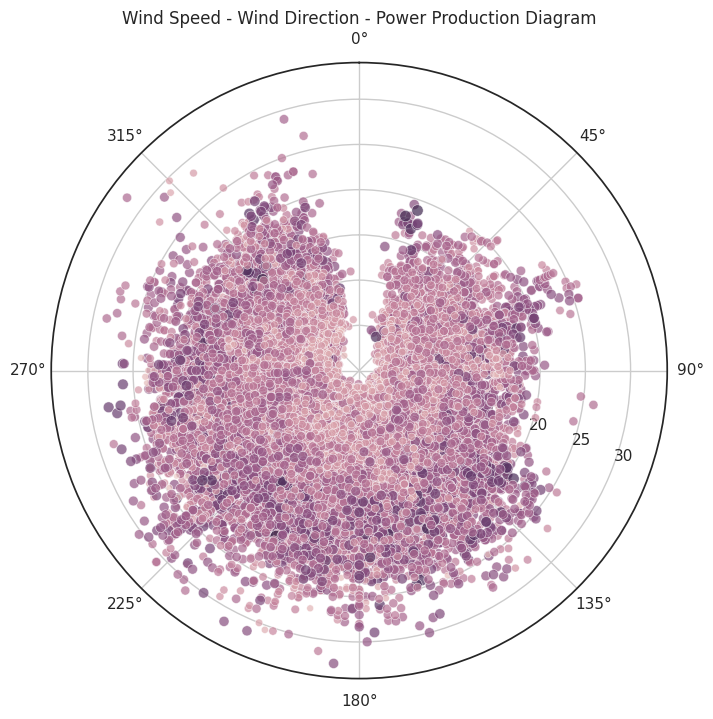

In [ ]:
# Creating the polar diagram
from math import radians

plt.figure(figsize=(8,8))
ax = plt.subplot(111, polar=True)
# Inside circles are the wind speed and marker color and size represents the amount of power production
sns.scatterplot(x=[radians(x) for x in merged_df_hourly_df['average_wind_dir']],
                y=merged_df_hourly_df['average_wind_speed'],
                size=merged_df_hourly_df['ActualGenerationMW'],
                hue=merged_df_hourly_df['ActualGenerationMW'],
                alpha=0.7, legend=None)
# Setting the polar diagram's top represents the North
ax.set_theta_zero_location('N')
# Setting -1 to start the wind direction clockwise
ax.set_theta_direction(-1)
# Setting wind speed labels in a better position to see
ax.set_rlabel_position(110)
plt.title('Wind Speed - Wind Direction - Power Production Diagram')
plt.ylabel(None);


In [ ]:
fig = px.scatter(newdf, x='hour', y='ActualDemandMW', facet_col='month', color='isweekday')
fig.show()

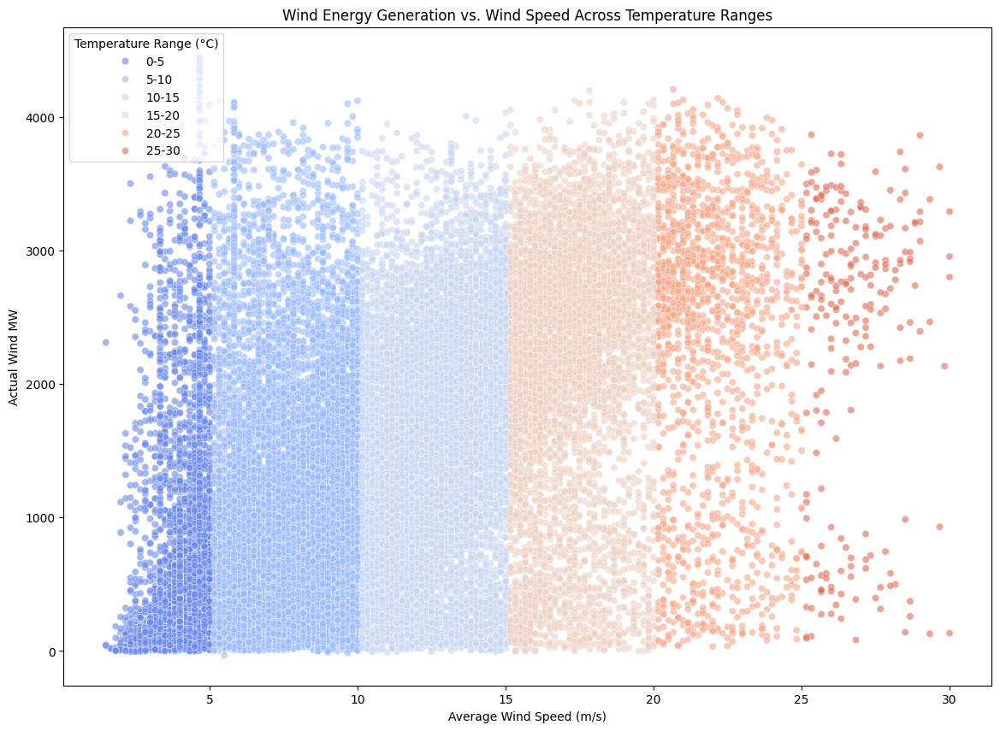

In [ ]:
# Categorizing temperature into ranges for easier analysis
data_cleaned['temp_category'] = pd.cut(data_cleaned['average_temp'], bins=[0, 5, 10, 15, 20, 25, 30], labels=['0-5', '5-10', '10-15', '15-20', '20-25', '25-30'])

# Plotting wind energy generation as a function of wind speed and temperature category
plt.figure(figsize=(14, 10))
sns.scatterplot(x='average_wind_speed', y='ActualWindMW', hue='temp_category', data=data_cleaned, palette='coolwarm', alpha=0.6)
plt.title('Wind Energy Generation vs. Wind Speed Across Temperature Ranges')
plt.xlabel('Average Wind Speed (m/s)')
plt.ylabel('Actual Wind MW')
plt.legend(title='Temperature Range (°C)', loc='upper left')
plt.show()



### LinePlot

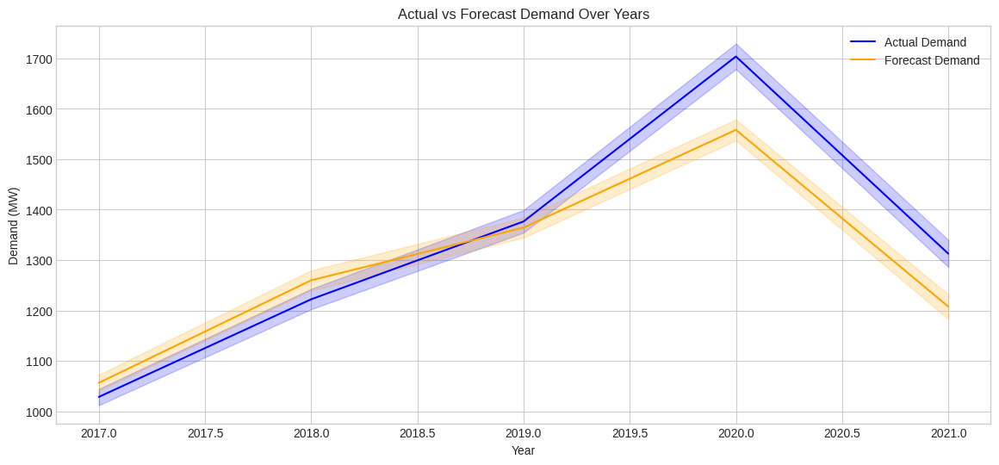

In [ ]:
# Line plot for Actual Demand and Forecast Demand over Years
plt.figure(figsize=(14, 6))
sns.lineplot(x='Year', y='ForecastWndMW', data=merged_df_hourly_df, label='Actual Demand', color='blue')
sns.lineplot(x='Year', y='ActualWindMW', data=merged_df_hourly_df, label='Forecast Demand', color='orange')
plt.xlabel('Year')
plt.ylabel('Demand (MW)')
plt.title('Actual vs Forecast Demand Over Years')
plt.legend()
plt.show()

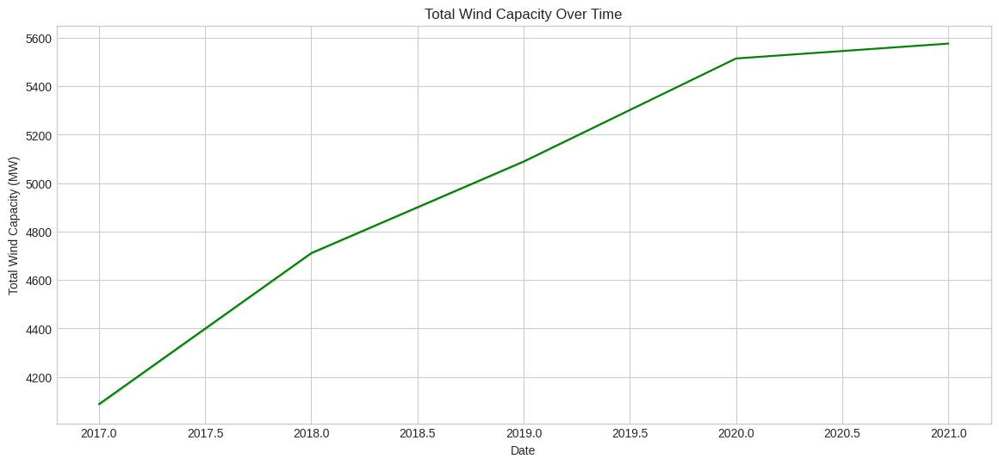

In [ ]:
plt.figure(figsize=(14, 6))
sns.lineplot(x='Year', y='TotalWindCapacityMW', data=merged_df_hourly_df, color='green')
plt.xlabel('Date')
plt.ylabel('Total Wind Capacity (MW)')
plt.title('Total Wind Capacity Over Time')
plt.show()


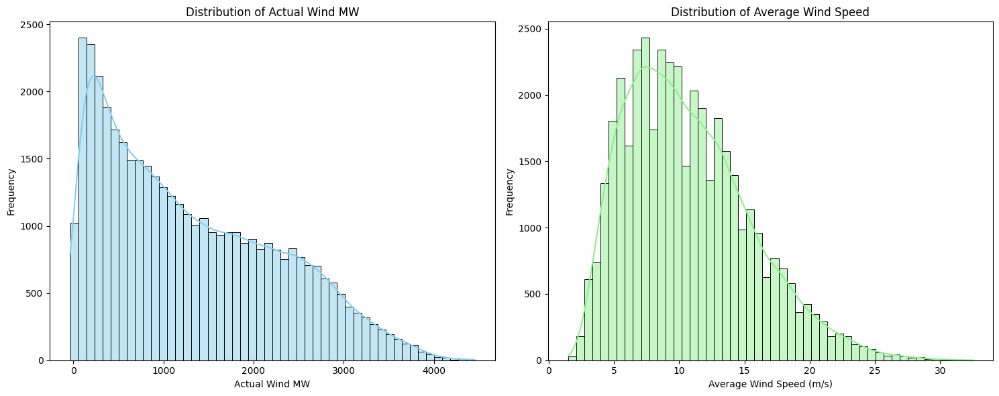

In [ ]:
# Plotting distributions of ActualWindMW and average_wind_speed
fig, axs = plt.subplots(1, 2, figsize=(15, 6))

# ActualWindMW distribution
sns.histplot(data_cleaned['ActualWindMW'], bins=50, ax=axs[0], kde=True, color='skyblue')
axs[0].set_title('Distribution of Actual Wind MW')
axs[0].set_xlabel('Actual Wind MW')
axs[0].set_ylabel('Frequency')

# Average Wind Speed distribution
sns.histplot(data_cleaned['average_wind_speed'], bins=50, ax=axs[1], kde=True, color='lightgreen')
axs[1].set_title('Distribution of Average Wind Speed')
axs[1].set_xlabel('Average Wind Speed (m/s)')
axs[1].set_ylabel('Frequency')

plt.tight_layout()
plt.show()


### Box Plot

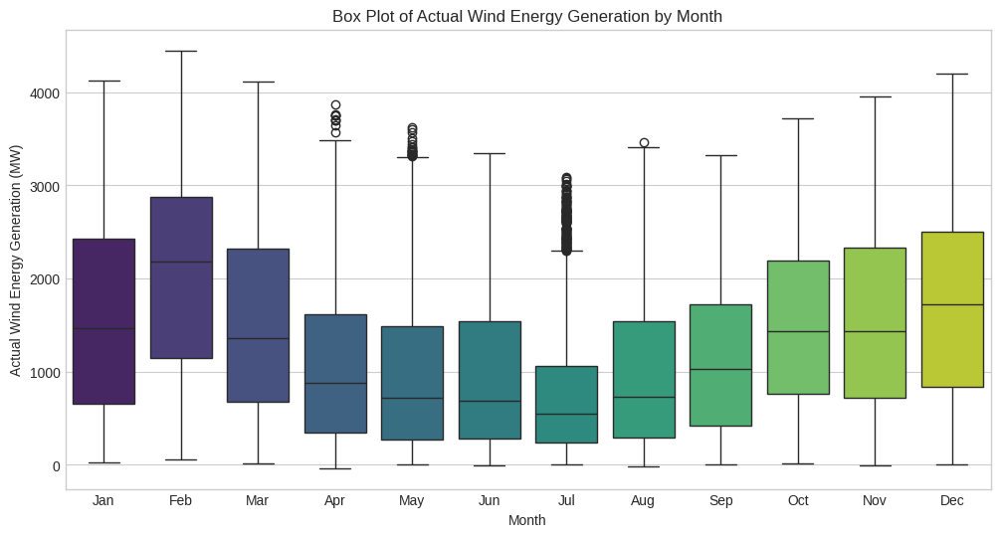

In [ ]:
# Box plot of Actual Wind Energy Generation by Month
plt.figure(figsize=(12, 6))
sns.boxplot(x='Month', y='ActualWindMW', data=merged_df_hourly_df, palette='viridis')
plt.xlabel('Month')
plt.ylabel('Actual Wind Energy Generation (MW)')
plt.title('Box Plot of Actual Wind Energy Generation by Month')
plt.show()

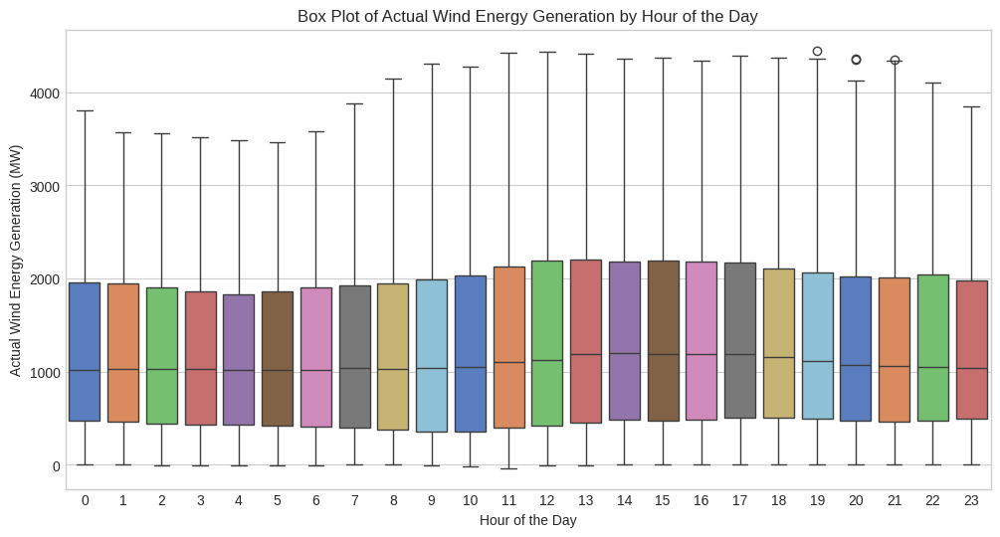

In [ ]:
# Box plot of Actual Wind Energy Generation by Hour of the Day
plt.figure(figsize=(12, 6))
sns.boxplot(x='hour', y='ActualWindMW', data=merged_df_hourly_df, palette='muted')
plt.xlabel('Hour of the Day')
plt.ylabel('Actual Wind Energy Generation (MW)')
plt.title('Box Plot of Actual Wind Energy Generation by Hour of the Day')
plt.show()

<ipython-input-8-931c29754764>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='hour', y='average_wind_speed', data=merged_df_hourly_df, palette='muted')


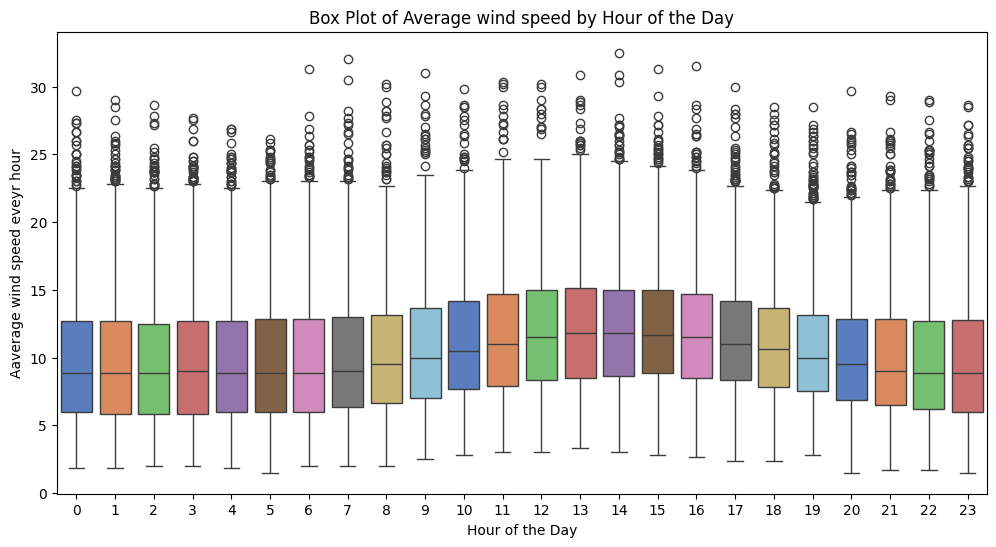

In [ ]:
# Box plot of average_wind_speed Generation by Hour of the Day
plt.figure(figsize=(12, 6))
sns.boxplot(x='hour', y='average_wind_speed', data=merged_df_hourly_df, palette='muted')
plt.xlabel('Hour of the Day')
plt.ylabel('Aaverage wind speed eveyr hour')
plt.title('Box Plot of Average wind speed by Hour of the Day')
plt.show()

<ipython-input-34-da566db2c8cd>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='rounded_wind_direction', y='average_wind_speed', data=data_cleaned, palette="coolwarm")


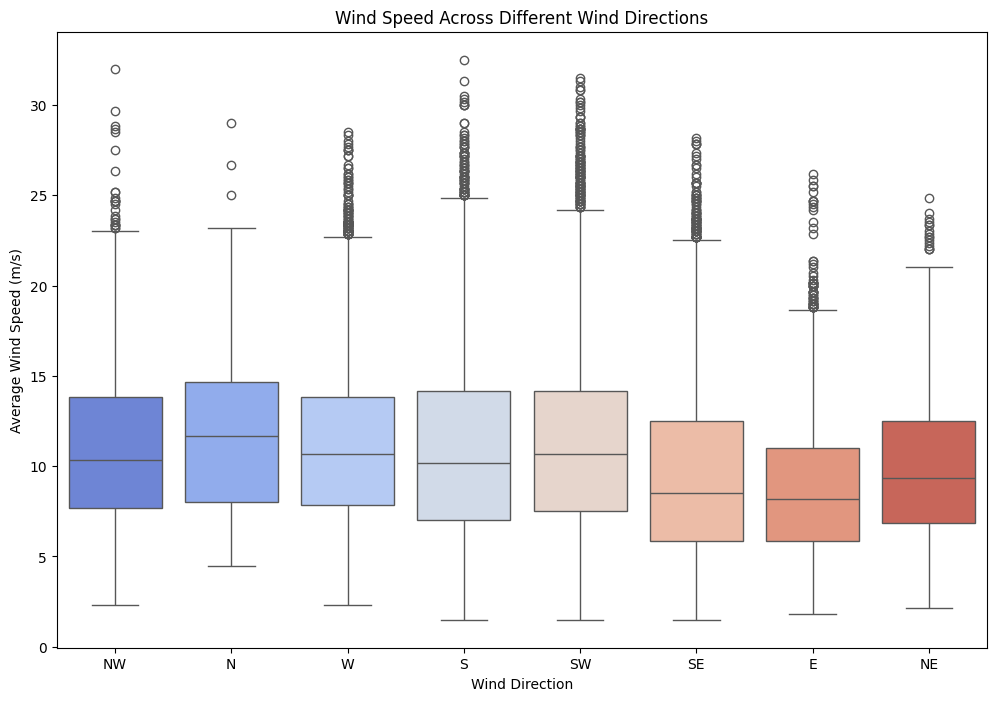

In [ ]:
# Plotting wind speed across different wind directions (rounded_wind_direction)
plt.figure(figsize=(12, 8))
sns.boxplot(x='rounded_wind_direction', y='average_wind_speed', data=data_cleaned, palette="coolwarm")
plt.title('Wind Speed Across Different Wind Directions')
plt.xlabel('Wind Direction')
plt.ylabel('Average Wind Speed (m/s)')
plt.show()


### BarChart

<ipython-input-11-3bff3dbc4397>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=['BEL', 'DUB', 'SHAN', 'COR', 'GAL', 'DON'], y=[merged_df_hourly_df['wdsp_BEL'].mean(), merged_df_hourly_df['wdsp_DUB'].mean(),  merged_df_hourly_df['wdsp'].mean(),  merged_df_hourly_df['wdsp_COR'].mean(),  merged_df_hourly_df['wdsp_GAL'].mean(),  merged_df_hourly_df['wdsp_DON'].mean()], palette="viridis")


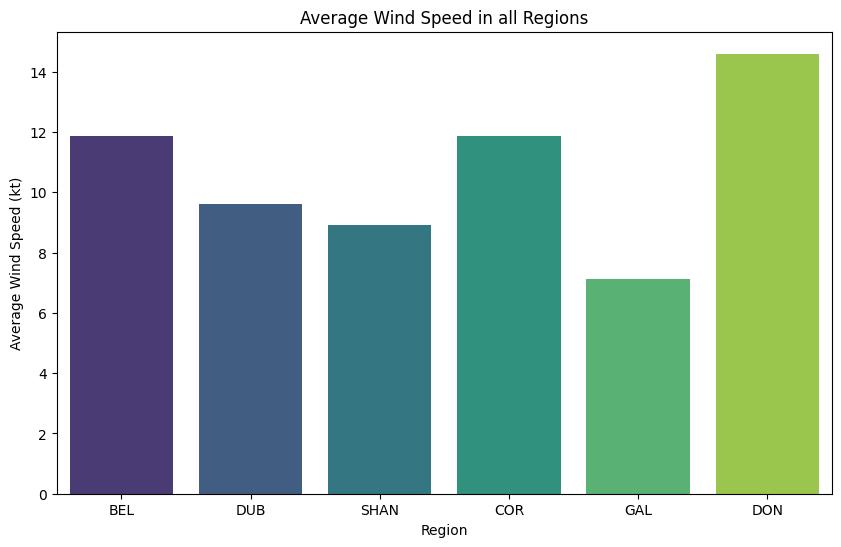

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
# Create a bar chart for average wind speed in all regions
plt.figure(figsize=(10, 6))
sns.barplot(x=['BEL', 'DUB', 'SHAN', 'COR', 'GAL', 'DON'], y=[merged_df_hourly_df['wdsp_BEL'].mean(), merged_df_hourly_df['wdsp_DUB'].mean(),  merged_df_hourly_df['wdsp'].mean(),  merged_df_hourly_df['wdsp_COR'].mean(),  merged_df_hourly_df['wdsp_GAL'].mean(),  merged_df_hourly_df['wdsp_DON'].mean()], palette="viridis")
plt.title('Average Wind Speed in all Regions')
plt.xlabel('Region')
plt.ylabel('Average Wind Speed (kt)')
plt.show()


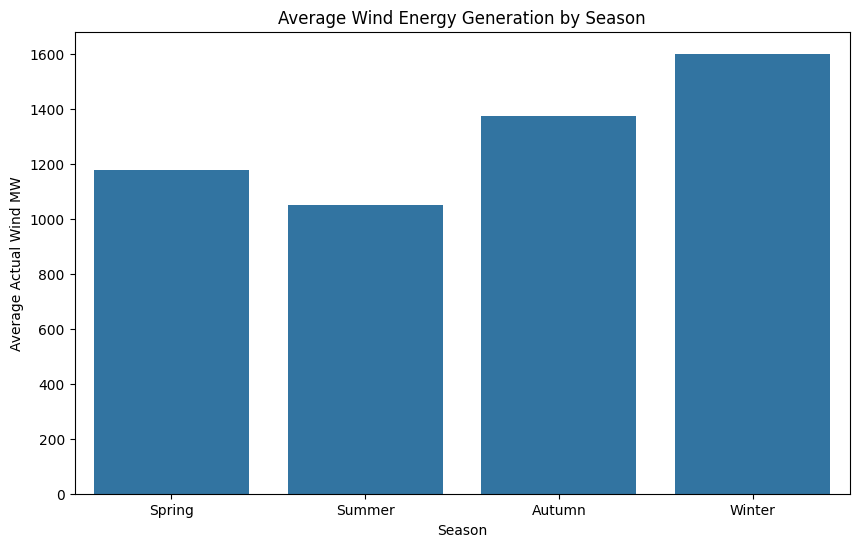

In [ ]:
# Adding a 'season' column based on month
def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Autumn'

data_cleaned['season'] = data_cleaned['date'].dt.month.apply(get_season)

# Aggregating wind energy generation by season
seasonal_wind_energy = data_cleaned.groupby('season')['ActualWindMW'].mean().reset_index()

# Plotting
plt.figure(figsize=(10, 6))
sns.barplot(x='season', y='ActualWindMW', data=seasonal_wind_energy, order=['Spring', 'Summer', 'Autumn', 'Winter'])
plt.title('Average Wind Energy Generation by Season')
plt.xlabel('Season')
plt.ylabel('Average Actual Wind MW')
plt.show()


### HeatMap

<ipython-input-13-bc2d52434909>:6: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df_corr = merged_df_hourly_df[col_list_numerical].corr()


(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5, 13.5, 14.5]),
 [Text(0, 0.5, 'Year'),
  Text(0, 1.5, 'ActualDemandMW'),
  Text(0, 2.5, 'ForecastWndMW'),
  Text(0, 3.5, 'ActualWindMW'),
  Text(0, 4.5, 'ActualGenerationMW'),
  Text(0, 5.5, 'NetTotal_MW'),
  Text(0, 6.5, 'EWIC_MW'),
  Text(0, 7.5, 'MOYLE_MW'),
  Text(0, 8.5, 'hour'),
  Text(0, 9.5, 'isweekday'),
  Text(0, 10.5, 'month'),
  Text(0, 11.5, 'year'),
  Text(0, 12.5, 'average_wind_speed'),
  Text(0, 13.5, 'average_temp'),
  Text(0, 14.5, 'average_rain')])

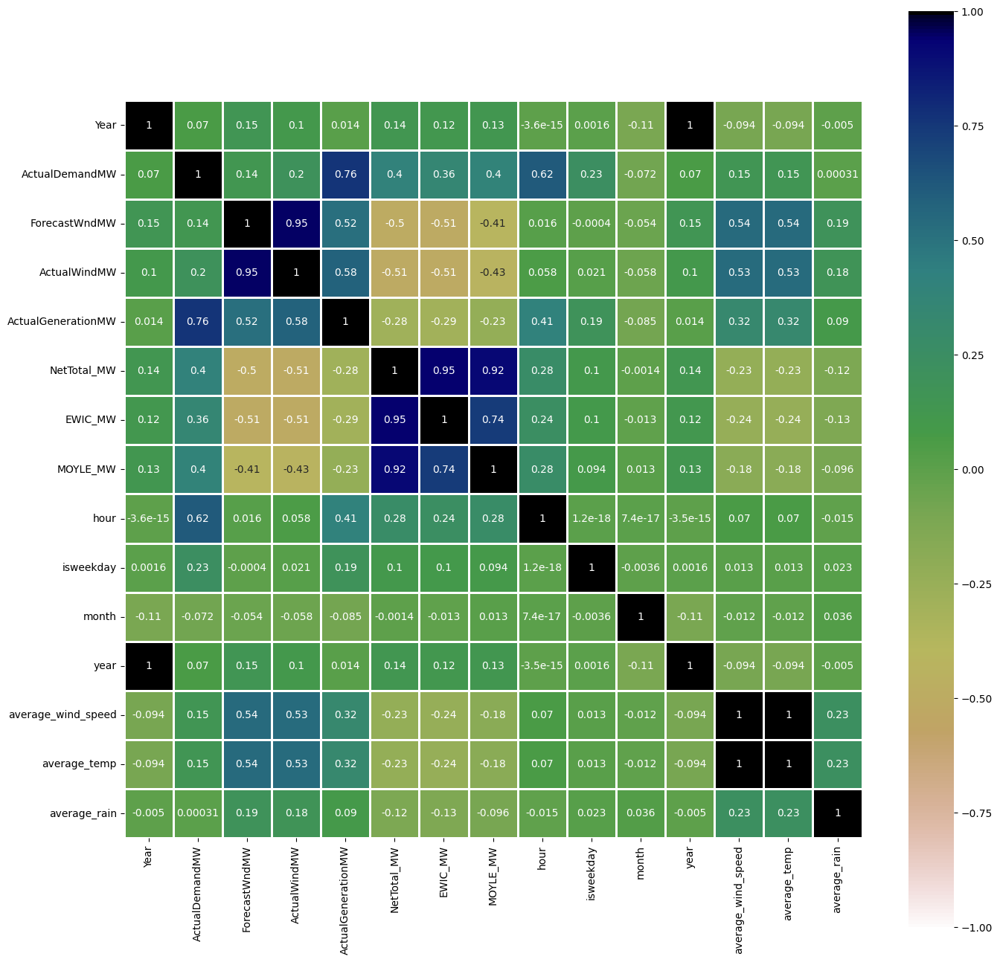

In [ ]:
col_list_numerical = ['date', 'Year', 'Month', 'DayTime', ' REGION', 'ActualDemandMW',
       'ForecastWndMW', 'ActualWindMW',
       'ActualGenerationMW', 'NetTotal_MW', 'EWIC_MW', 'MOYLE_MW', 'hour',
       'isweekday', 'month', 'year', 'average_wind_speed', 'average_temp', 'average_rain' ]

df_corr = merged_df_hourly_df[col_list_numerical].corr()

plt.figure(figsize=[16, 16])
sns.heatmap(data=df_corr, vmin=-1, vmax=1, cmap='gist_earth_r', annot=True, square=True, linewidths=1)
plt.xticks(rotation=90)
plt.yticks(rotation=0)

<ipython-input-11-fc1148e84e7a>:9: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df_corr = merged_df_hourly_df[col_list_numerical].corr()


(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5, 13.5, 14.5, 15.5, 16.5, 17.5, 18.5, 19.5, 20.5, 21.5,
        22.5, 23.5]),
 [Text(0, 0.5, 'Unnamed: 0.1'),
  Text(0, 1.5, 'Unnamed: 0'),
  Text(0, 2.5, 'Year'),
  Text(0, 3.5, 'ActualDemandMW'),
  Text(0, 4.5, 'ForecastWndMW'),
  Text(0, 5.5, 'ActualWindMW'),
  Text(0, 6.5, 'ActualGenerationMW'),
  Text(0, 7.5, 'NetTotal_MW'),
  Text(0, 8.5, 'EWIC_MW'),
  Text(0, 9.5, 'MOYLE_MW'),
  Text(0, 10.5, 'hour'),
  Text(0, 11.5, 'isweekday'),
  Text(0, 12.5, 'month'),
  Text(0, 13.5, 'year'),
  Text(0, 14.5, 'rain_BEL'),
  Text(0, 15.5, 'temp_BEL'),
  Text(0, 16.5, 'wetb_BEL'),
  Text(0, 17.5, 'dewpt_BEL'),
  Text(0, 18.5, 'vappr_BEL'),
  Text(0, 19.5, 'rhum_BEL'),
  Text(0, 20.5, 'msl_BEL'),
  Text(0, 21.5, 'wdsp_BEL'),
  Text(0, 22.5, 'wddir_BEL'),
  Text(0, 23.5, 'TotalWindCapacityMW')])

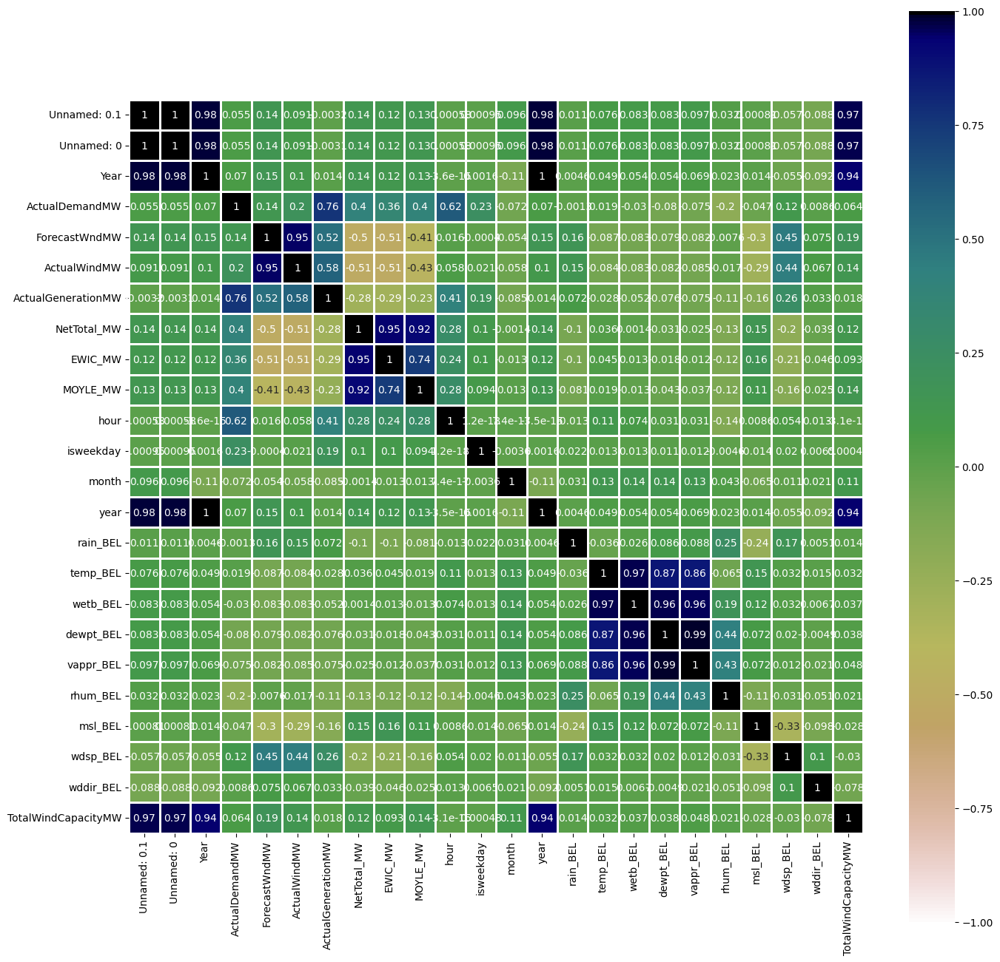

In [ ]:
col_list_numerical = ['Unnamed: 0.1', 'date', 'Unnamed: 0', 'Year', 'Month', 'DayTime',
       ' REGION', 'ActualDemandMW', 'ForecastWndMW',
       'ActualWindMW', 'ActualGenerationMW', 'NetTotal_MW', 'EWIC_MW',
       'MOYLE_MW', 'hour', 'isweekday', 'month', 'year', 'rain_BEL',
       'temp_BEL', 'wetb_BEL', 'dewpt_BEL', 'vappr_BEL', 'rhum_BEL', 'msl_BEL',
       'wdsp_BEL', 'wddir_BEL',
       'TotalWindCapacityMW']

df_corr = merged_df_hourly_df[col_list_numerical].corr()

plt.figure(figsize=[16, 16])
sns.heatmap(data=df_corr, vmin=-1, vmax=1, cmap='gist_earth_r', annot=True, square=True, linewidths=1)
plt.xticks(rotation=90)
plt.yticks(rotation=0)

In [ ]:

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import math
import matplotlib.pyplot as plt
import seaborn as sns

import io
import requests
# GitHub URL to your CSV file
github_url = 'https://raw.githubusercontent.com/KaylumCassidy/FYP/main/IslandElectricity2017_2021v5.csv'

# Read the CSV file into a Pandas DataFrame
data = pd.read_csv(github_url)

In [ ]:
# Dropping unnecessary columns
data_cleaned = data.drop(columns=['Unnamed: 0.2', 'Unnamed: 0.1', 'Unnamed: 0'])

# Converting 'date' column to datetime format
data_cleaned['date'] = pd.to_datetime(data_cleaned['date'], format='%d/%m/%Y %H:%M')

# Checking for missing values in key columns
missing_values = data_cleaned.isnull().sum()

# Display missing values for key columns and data types of first few columns
data_types = data_cleaned.dtypes
missing_values_summary = missing_values[missing_values > 0]
data_types_summary = data_types[:10]  # Display data types for the first 10 columns for brevity

missing_values_summary, data_types_summary



( FORECAST DEMAND(MW)    41616
 dtype: int64,
 date                    datetime64[ns]
 Year                             int64
 Month                           object
 DayTime                         object
  REGION                         object
 ActualDemandMW                   int64
  FORECAST DEMAND(MW)           float64
 ForecastWndMW                    int64
 ActualWindMW                     int64
 ActualGenerationMW               int64
 dtype: object)

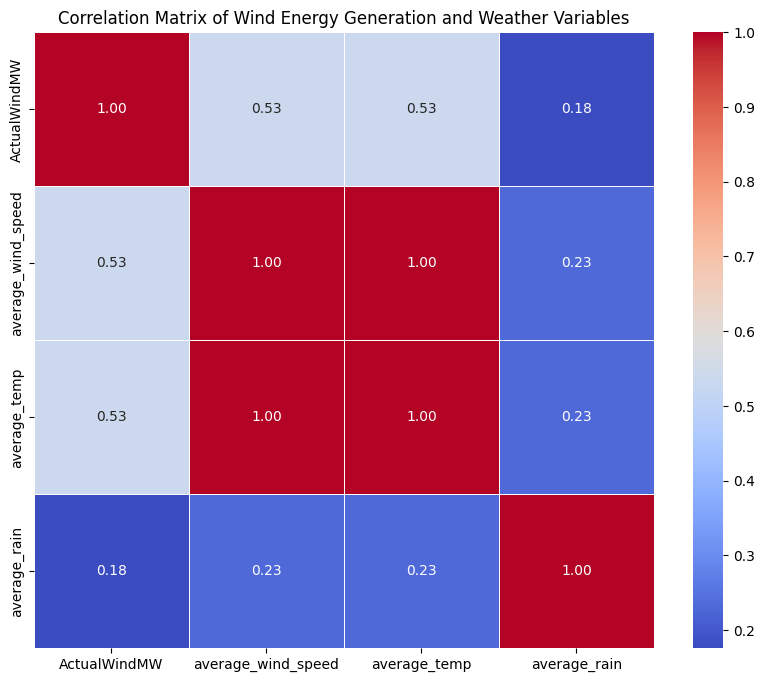

In [ ]:
# Calculating the correlation matrix
correlation_matrix = data_cleaned[['ActualWindMW', 'average_wind_speed', 'average_temp', 'average_rain']].corr()

# Plotting the heatmap for the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix of Wind Energy Generation and Weather Variables')
plt.show()


### Violinplot

<ipython-input-33-efde7674e72c>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='isweekday', y='ActualWindMW', data=merged_df_hourly_df, palette='Set2')


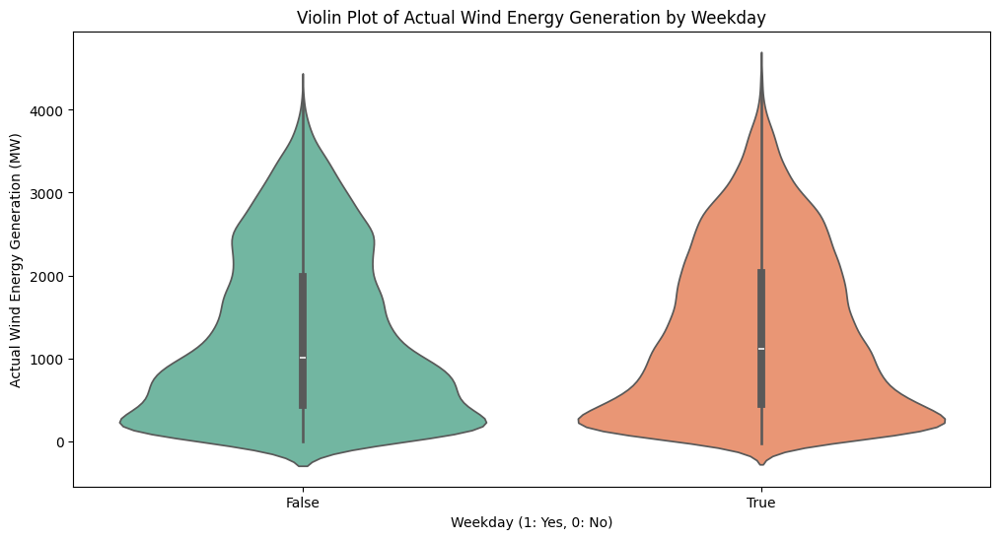

In [ ]:
# Violin plot for Actual Wind Energy Generation by weekday
plt.figure(figsize=(12, 6))
sns.violinplot(x='isweekday', y='ActualWindMW', data=merged_df_hourly_df, palette='Set2')
plt.xlabel('Weekday (1: Yes, 0: No)')
plt.ylabel('Actual Wind Energy Generation (MW)')
plt.title('Violin Plot of Actual Wind Energy Generation by Weekday')
plt.show()

### Kdeplot

/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1832: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=self.x, y=self.y, **kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1883: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(x=self.x, ax=self.ax_marg_x, **kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:1889: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  func(y=self.y, ax=self.ax_marg_y, **kwargs)


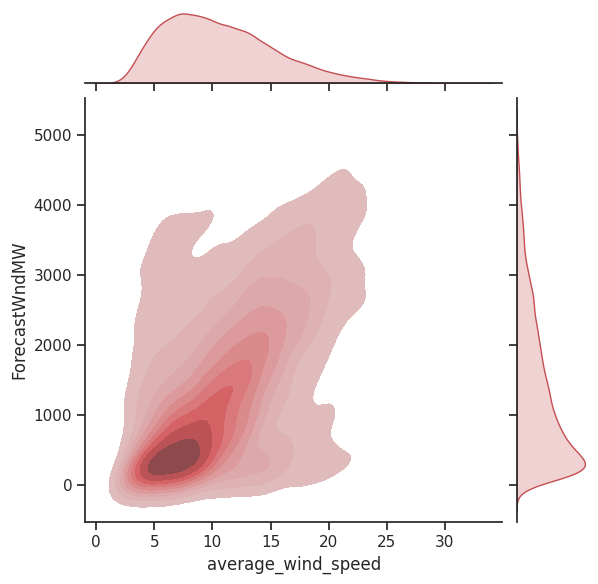

In [ ]:


#Relationship between 'average_wind_speed' and 'ForecastWndMW'.

sns.set( style='ticks', color_codes=True)
g = sns.JointGrid(x='average_wind_speed', y='ForecastWndMW',data=merged_df_hourly_df, height=6)
g = g.plot_joint(sns.kdeplot, color="r", shade=True)
g = g.plot_marginals(sns.kdeplot, color="r", shade=True)

## ML MODELS

### Random forest (RF)

In [67]:
import os
import warnings
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import datetime as dt
import math

from sklearn.ensemble import RandomForestRegressor

from sklearn.preprocessing import MinMaxScaler



In [68]:
import os
import warnings
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import datetime as dt
import math

from sklearn.ensemble import RandomForestRegressor

from sklearn.preprocessing import MinMaxScaler

In [69]:

# GitHub URL to your CSV file
github_url = 'https://raw.githubusercontent.com/KaylumCassidy/FYP/main/IslandElectricity2017_2021v5.csv'

# Read the CSV file into a Pandas DataFrame
data = pd.read_csv(github_url)
data['date'] = pd.to_datetime(data['date'])

# Display the first few rows of the DataFrame to understand its structure
print(data.columns)

Index(['Unnamed: 0.2', 'Unnamed: 0.1', 'date', 'Unnamed: 0', 'Year', 'Month',
       'DayTime', ' REGION', 'ActualDemandMW', ' FORECAST DEMAND(MW)',
       'ForecastWndMW', 'ActualWindMW', 'ActualGenerationMW', 'NetTotal_MW',
       'EWIC_MW', 'MOYLE_MW', 'hour', 'isweekday', 'month', 'year', 'rain_BEL',
       'temp_BEL', 'wetb_BEL', 'dewpt_BEL', 'vappr_BEL', 'rhum_BEL', 'msl_BEL',
       'wdsp_BEL', 'wddir_BEL', 'rain_DUB', 'temp_DUB', 'wetb_DUB',
       'dewpt_DUB', 'vappr_DUB', 'rhum_DUB', 'msl_DUB', 'wdsp_DUB',
       'wddir_DUB', 'ww', 'w', 'sun', 'vis', 'clht', 'clamt', 'rain', 'temp',
       'wetb', 'dewpt', 'vappr', 'rhum', 'msl', 'wdsp', 'wddir', 'ww_SHA',
       'w_SHA', 'sun_SHA', 'vis_SHA', 'clht_SHA', 'clamt_SHA', 'rain_COR',
       'temp_COR', 'wetb_COR', 'dewpt_COR', 'vappr_COR', 'rhum_COR', 'msl_COR',
       'wdsp_COR', 'wddir_COR', 'rain_GAL', 'temp_GAL', 'wetb_GAL',
       'dewpt_GAL', 'vappr_GAL', 'rhum_GAL', 'msl_GAL', 'wdsp_GAL',
       'wddir_GAL', 'ind_DON', 'ra

In [44]:

# Simplify the dataset to include only necessary features
# Converting 'date' to datetime format and setting it as index
data['date'] = pd.to_datetime(data['date'])
data.set_index('date', inplace=True)

# Including specified features plus creating additional necessary features for modeling
selected_columns = [
    'Year', 'Month', 'DayTime', 'hour', 'isweekday',
    'average_temp', 'average_wind_speed', 'average_wind_dir', 'average_rain',
    'ActualWindMW'  # Target variable
]

# Filter the dataset to include only the selected columns
data_filtered = data[selected_columns]

# Generate lag features for ActualWindMW for 24 hours
for lag in range(1, 25):
    data_filtered[f'ActualWindMW_lag{lag}'] = data_filtered['ActualWindMW'].shift(lag)

# Adding rolling averages and differences for 'ActualWindMW'
data_filtered['rolling_avg_wind'] = data_filtered['ActualWindMW'].rolling(window=3).mean().shift(1)
data_filtered['diff_wind_power'] = data_filtered['ActualWindMW'].diff().shift(1)


data_filtered['rolling_avg_wind_SPEED'] = data_filtered['average_wind_speed'].rolling(window=3).mean().shift(1)
data_filtered['diff_wind_SPEED'] = data_filtered['average_wind_speed'].diff().shift(1)

data_filtered['rolling_avg_wind_dir'] = data_filtered['average_wind_dir'].rolling(window=3).mean().shift(1)
data_filtered['diff_wind_dir'] = data_filtered['average_wind_dir'].diff().shift(1)
# Shift the target variable by one hour into the future
data_filtered['ActualWindMW_target'] = data_filtered['ActualWindMW'].shift(-1)

# Dropping rows with NaN values created by lagging
data_filtered.dropna(inplace=True)

data_filtered.head()





<ipython-input-44-f5d99be895db>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filtered[f'ActualWindMW_lag{lag}'] = data_filtered['ActualWindMW'].shift(lag)
<ipython-input-44-f5d99be895db>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filtered[f'ActualWindMW_lag{lag}'] = data_filtered['ActualWindMW'].shift(lag)
<ipython-input-44-f5d99be895db>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

,Year,Month,DayTime,hour,isweekday,average_temp,average_wind_speed,average_wind_dir,average_rain,ActualWindMW,...,ActualWindMW_lag22,ActualWindMW_lag23,ActualWindMW_lag24,rolling_avg_wind,diff_wind_power,rolling_avg_wind_SPEED,diff_wind_SPEED,rolling_avg_wind_dir,diff_wind_dir,ActualWindMW_target
date,,,,,,,,,,,,,,,,,,,,,
2017-01-02 00:00:00,2017,Jan,"02, 00:00",0,True,6.666667,6.666667,125.000000,0.000000,1313,...,1528.0,1123.0,1214.0,1622.000000,-128.0,14.277778,-1.666667,81.111111,-55.000000,1269.0
2017-01-02 01:00:00,2017,Jan,"02, 01:00",1,True,6.500000,6.500000,140.000000,0.000000,1269,...,1612.0,1528.0,1123.0,1467.666667,-168.0,11.555556,-6.500000,77.777778,98.333333,1053.0
2017-01-02 02:00:00,2017,Jan,"02, 02:00",2,True,7.000000,7.000000,141.666667,0.016667,1053,...,1473.0,1612.0,1528.0,1354.333333,-44.0,8.777778,-0.166667,97.222222,15.000000,1071.0
2017-01-02 03:00:00,2017,Jan,"02, 03:00",3,True,6.500000,6.500000,146.666667,0.000000,1071,...,1678.0,1473.0,1612.0,1211.666667,-216.0,6.722222,0.500000,135.555556,1.666667,904.0
2017-01-02 04:00:00,2017,Jan,"02, 04:00",4,True,7.333333,7.333333,141.666667,0.000000,904,...,1710.0,1678.0,1473.0,1131.000000,18.0,6.666667,-0.500000,142.777778,5.000000,818.0


This method shifts the data by the specified number of periods (in this case, hours). When you use .shift(1), it moves all entries in the ActualWindMW column down by one row, meaning that the current row's ActualWindMW_lag1 value will be the ActualWindMW value from the previous row (1 hour ago).

For next 24-hour forecasting, including lags from the past 24 hours as features can be quite effective because:

Short-term Forecasting: It helps in capturing the short-term dependencies and fluctuations in wind power generation.
Model Training: During model training, these lag features serve as inputs that help the model learn the relationship between past and future wind power output. This learning is critical for making accurate forecasts.

Renewable Energy Forecasting Studies: Specific to renewable energy, numerous studies in journals such as "Renewable and Sustainable Energy Reviews" or "Applied Energy" frequently explore the use of lagged data for predicting wind energy output. For example, research articles that model wind speed or power output often utilize historical data points as features to improve forecast accuracy.

In [45]:

from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import joblib
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import LabelEncoder

# Encoding categorical variables
le = LabelEncoder()
data_filtered['Month'] = le.fit_transform(data_filtered['Month'])

# Splitting the dataset into training and testing sets
# We reserve the last 24 observations for testing to simulate forecasting the next 24 hours It's good practice to reserve the last 24 observations for testing
training_data = data_filtered.iloc[:-24]
testing_data = data_filtered.iloc[-24:]


# Exclude target variable and non-numeric 'DayTime'
X_train = training_data.drop(['ActualWindMW', 'ActualWindMW_target', 'DayTime'], axis=1)
y_train = training_data['ActualWindMW_target']

X_test = testing_data.drop(['ActualWindMW', 'ActualWindMW_target', 'DayTime'], axis=1)
y_test = testing_data['ActualWindMW_target']


# Splitting the dataset into training and testing sets again
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


# Since RandomForest does not need feature scaling, we'll create a simple
# But you can add preprocessing steps here if needed.
pipeline = Pipeline([
    ('rf', RandomForestRegressor(random_state=42))
])

# Hyperparameter grid for RandomForestRegressor (add ranseach)
param_grid = {
    'rf__n_estimators': [300],  # Smaller range
    'rf__max_depth': [20],  # Added a mid-point for diversity
    'rf__min_samples_split': [2],
    'rf__min_samples_leaf': [1],
    'rf__max_features': ['sqrt']
}


# Grid search with cross-validation
grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='neg_mean_squared_error')

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

print(f"Best parameters: {grid_search.best_params_}")
best_model = grid_search.best_estimator_


# Save the best model
model_filename = 'rf_model_optimized.joblib'
joblib.dump(best_model, model_filename)
print(f'Model saved as {model_filename}')

# Predicting with the best model
predictions = best_model.predict(X_test)

# Calculate metrics
rmse = mean_squared_error(y_test, predictions, squared=False)
mae = mean_absolute_error(y_test, predictions)
mse = mean_squared_error(y_test, predictions)
r2 = r2_score(y_test, predictions)

print(f"MAE: {mae}, MSE: {mse}, RMSE: {rmse}, R^2: {r2}")


<ipython-input-45-39154e84b02f>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filtered['Month'] = le.fit_transform(data_filtered['Month'])


Best parameters: {'rf__max_depth': 20, 'rf__max_features': 'sqrt', 'rf__min_samples_leaf': 1, 'rf__min_samples_split': 2, 'rf__n_estimators': 300}
Model saved as rf_model_optimized.joblib
MAE: 184.6929813865756, MSE: 59000.677969492644, RMSE: 242.9005516039283, R^2: 0.1911073069507857


By including these lag features and additional derived features in your training dataset, the RandomForestRegressor model will be able to learn from the historical patterns in wind power generation. This is particularly important for time series forecasting, where past observations are predictive of future values.

'rf__n_estimators': [200, 300]: Specifies the number of trees in the forest to try out—200 and 300 trees.
'rf__max_depth': [None, 15]: Sets the maximum depth of the trees. None means that nodes are expanded until all leaves are pure or until all leaves contain less than min_samples_split samples. 15 restricts the growth of the trees to a depth of 15.
'rf__min_samples_split': [4]: The minimum number of samples required to split an internal node is 4.
'rf__min_samples_leaf': [4]: The minimum number of samples required to be at a leaf node is 4. This helps in controlling overfitting by smoothing the model, especially in regression.
'rf__max_features': ['sqrt', 'log2']: Specifies the number of features to consider when looking for the best split. 'sqrt' means that sqrt(n_features) (the square root of the number of features) are considered at each split. 'log2' means that log2(n_features) (the log base 2 of the number of features) are considered. This is a way to control the diversity of trees in the ensemble.

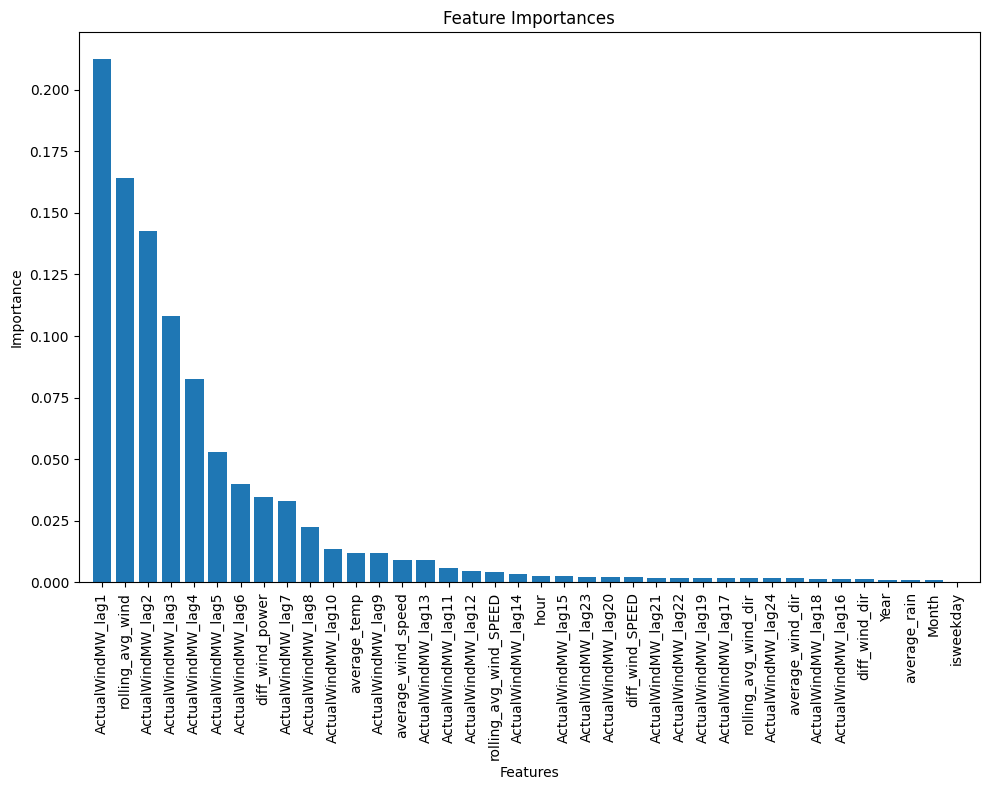

In [46]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming X_train is your features DataFrame and best_model is your trained model
feature_names = X_train.columns

# Retrieving feature importances
feature_importances = best_model.named_steps['rf'].feature_importances_

# Sorting the features by their importance
sorted_indices = np.argsort(feature_importances)[::-1]

# Visualizing the feature importances
plt.figure(figsize=(10, 8))
plt.title("Feature Importances")
plt.bar(range(X_train.shape[1]), feature_importances[sorted_indices], align="center")
plt.xticks(range(X_train.shape[1]), feature_names[sorted_indices], rotation=90)
plt.xlim([-1, X_train.shape[1]])
plt.ylabel("Importance")
plt.xlabel("Features")
plt.tight_layout()
plt.show()


In [49]:

import numpy as np

# Assuming y_true and y_pred are your arrays of actual and predicted values
y_true = np.array(y_test)    # Your actual values
predictions = predictions.flatten()  # Your predictions

# Calculate MAPE
mape = np.mean(np.abs((y_true - predictions) / y_true)) * 100

print(f"MAPE: {mape}%")


MAPE: 6.752228395325897%


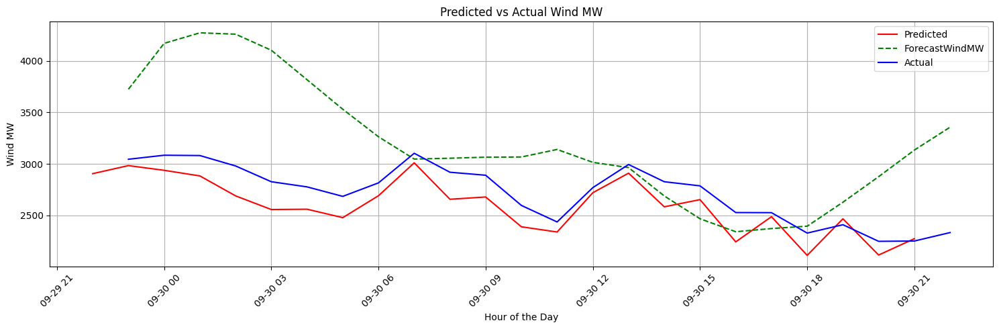

In [56]:


import pandas as pd
import matplotlib.pyplot as plt


# Align predictions with the hour they are predicting, not the hour of data used
# The index for predictions should be one hour ahead of the actuals
predictions_index = data_filtered.index[-24:] + pd.Timedelta(hours=-1)# This assumes predictions are for the next hour

# Create a DataFrame for predictions with the correct future index
predictions_df = pd.DataFrame(predictions, index=predictions_index, columns=['Predicted'])

# Create a DataFrame for actuals
actuals_df = pd.DataFrame(data_filtered['ActualWindMW'].iloc[-24:].values, index=data_filtered.index[-24:], columns=['Actual'])
# Create a DataFrame for the forecasted wind MW from another model or source
forecast_wind_df = pd.DataFrame(data['ForecastWndMW'].iloc[-24:].values, index=data_filtered.index[-24:], columns=['ForecastWindMW'])

# Combine all three DataFrames: predictions, actuals, and forecast wind
combined_df = pd.concat([predictions_df, actuals_df, forecast_wind_df], axis=1)

# Assuming combined_df is correctly aligned
combined_df['Hour'] = combined_df.index.hour

# Now plot the data
plt.figure(figsize=(15, 5))
plt.plot(combined_df.index, combined_df['Predicted'], 'r-', label='Predicted')
plt.plot(combined_df.index, combined_df['ForecastWindMW'], 'g--', label='ForecastWindMW')
plt.plot(combined_df.index, combined_df['Actual'], 'b-', label='Actual')  # Make sure this is correct

plt.legend()
plt.xlabel('Hour of the Day')
plt.ylabel('Wind MW')
plt.title('Predicted vs Actual Wind MW')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()


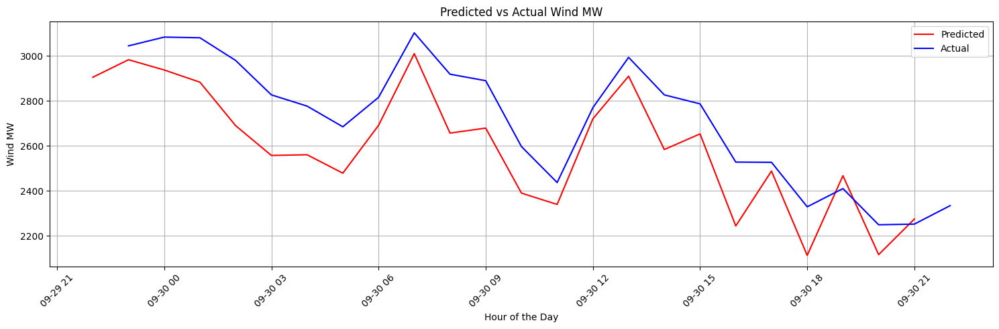

In [57]:


import pandas as pd
import matplotlib.pyplot as plt


# Align predictions with the hour they are predicting, not the hour of data used
# The index for predictions should be one hour ahead of the actuals
predictions_index = data_filtered.index[-24:] + pd.Timedelta(hours=-1)# This assumes predictions are for the next hour

# Create a DataFrame for predictions with the correct future index
predictions_df = pd.DataFrame(predictions, index=predictions_index, columns=['Predicted'])

# Create a DataFrame for actuals
actuals_df = pd.DataFrame(data_filtered['ActualWindMW'].iloc[-24:].values, index=data_filtered.index[-24:], columns=['Actual'])

# Combine all three DataFrames: predictions, actuals, and forecast wind
combined_df = pd.concat([predictions_df, actuals_df, forecast_wind_df], axis=1)

# Assuming combined_df is correctly aligned
combined_df['Hour'] = combined_df.index.hour

# Now plot the data
plt.figure(figsize=(15, 5))
plt.plot(combined_df.index, combined_df['Predicted'], 'r-', label='Predicted')

plt.plot(combined_df.index, combined_df['Actual'], 'b-', label='Actual')  # Make sure this is correct

plt.legend()
plt.xlabel('Hour of the Day')
plt.ylabel('Wind MW')
plt.title('Predicted vs Actual Wind MW')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()


In [47]:
!pip install joblib
import joblib

# ... (previous code)

# Save the model to a file
model_filename = 'rf_model2.joblib'
joblib.dump(best_model, model_filename)

print(f'Model saved as {model_filename}')


Model saved as rf_model2.joblib


72 hour forecast

In [ ]:

# GitHub URL to your CSV file
github_url = 'https://raw.githubusercontent.com/KaylumCassidy/FYP/main/IslandElectricity2017_2021v5.csv'

# Read the CSV file into a Pandas DataFrame
data = pd.read_csv(github_url)
data['date'] = pd.to_datetime(data['date'])

# Display the first few rows of the DataFrame to understand its structure
print(data.columns)

Index(['Unnamed: 0.2', 'Unnamed: 0.1', 'date', 'Unnamed: 0', 'Year', 'Month',
       'DayTime', ' REGION', 'ActualDemandMW', ' FORECAST DEMAND(MW)',
       'ForecastWndMW', 'ActualWindMW', 'ActualGenerationMW', 'NetTotal_MW',
       'EWIC_MW', 'MOYLE_MW', 'hour', 'isweekday', 'month', 'year', 'rain_BEL',
       'temp_BEL', 'wetb_BEL', 'dewpt_BEL', 'vappr_BEL', 'rhum_BEL', 'msl_BEL',
       'wdsp_BEL', 'wddir_BEL', 'rain_DUB', 'temp_DUB', 'wetb_DUB',
       'dewpt_DUB', 'vappr_DUB', 'rhum_DUB', 'msl_DUB', 'wdsp_DUB',
       'wddir_DUB', 'ww', 'w', 'sun', 'vis', 'clht', 'clamt', 'rain', 'temp',
       'wetb', 'dewpt', 'vappr', 'rhum', 'msl', 'wdsp', 'wddir', 'ww_SHA',
       'w_SHA', 'sun_SHA', 'vis_SHA', 'clht_SHA', 'clamt_SHA', 'rain_COR',
       'temp_COR', 'wetb_COR', 'dewpt_COR', 'vappr_COR', 'rhum_COR', 'msl_COR',
       'wdsp_COR', 'wddir_COR', 'rain_GAL', 'temp_GAL', 'wetb_GAL',
       'dewpt_GAL', 'vappr_GAL', 'rhum_GAL', 'msl_GAL', 'wdsp_GAL',
       'wddir_GAL', 'ind_DON', 'ra

In [59]:

# Simplify the dataset to include only necessary features
# Converting 'date' to datetime format and setting it as index
data['date'] = pd.to_datetime(data['date'])
data.set_index('date', inplace=True)

# Including specified features plus creating additional necessary features for modeling
selected_columns = [
    'Year', 'Month', 'DayTime', 'hour', 'isweekday',
    'average_temp', 'average_wind_speed', 'average_wind_dir', 'average_rain',
    'ActualWindMW'  # Target variable
]

# Filter the dataset to include only the selected columns
data_filtered = data[selected_columns]

# Generate lag features for ActualWindMW for 24 hours
for lag in range(1, 25):
    data_filtered[f'ActualWindMW_lag{lag}'] = data_filtered['ActualWindMW'].shift(lag)

data_filtered['wind_power_lag48'] = data_filtered['ActualWindMW'].shift(48)
data_filtered['wind_power_lag72'] = data_filtered['ActualWindMW'].shift(72)
# Adding rolling averages and differences for 'ActualWindMW'
data_filtered['rolling_avg_wind'] = data_filtered['ActualWindMW'].rolling(window=3).mean().shift(1)
data_filtered['diff_wind_power'] = data_filtered['ActualWindMW'].diff().shift(1)


data_filtered['rolling_avg_wind_SPEED'] = data_filtered['average_wind_speed'].rolling(window=3).mean().shift(1)
data_filtered['diff_wind_SPEED'] = data_filtered['average_wind_speed'].diff().shift(1)

data_filtered['rolling_avg_wind_dir'] = data_filtered['average_wind_dir'].rolling(window=3).mean().shift(1)
data_filtered['diff_wind_dir'] = data_filtered['average_wind_dir'].diff().shift(1)
# Shift the target variable by one hour into the future
data_filtered['ActualWindMW_target'] = data_filtered['ActualWindMW'].shift(-1)

# Dropping rows with NaN values created by lagging
data_filtered.dropna(inplace=True)

data_filtered.head()


<ipython-input-59-9cf76e358e8a>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filtered[f'ActualWindMW_lag{lag}'] = data_filtered['ActualWindMW'].shift(lag)
<ipython-input-59-9cf76e358e8a>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filtered[f'ActualWindMW_lag{lag}'] = data_filtered['ActualWindMW'].shift(lag)
<ipython-input-59-9cf76e358e8a>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

,Year,Month,DayTime,hour,isweekday,average_temp,average_wind_speed,average_wind_dir,average_rain,ActualWindMW,...,ActualWindMW_lag24,wind_power_lag48,wind_power_lag72,rolling_avg_wind,diff_wind_power,rolling_avg_wind_SPEED,diff_wind_SPEED,rolling_avg_wind_dir,diff_wind_dir,ActualWindMW_target
date,,,,,,,,,,,,,,,,,,,,,
2017-01-04 00:00:00,2017,Jan,"04, 00:00",0,True,3.666667,3.666667,191.666667,0.066667,624,...,262.0,1313.0,1214.0,634.000000,13.0,14.833333,1.500000,235.000000,10.000000,660.0
2017-01-04 01:00:00,2017,Jan,"04, 01:00",1,True,2.833333,2.833333,216.666667,0.000000,660,...,259.0,1269.0,1123.0,623.666667,-6.0,11.277778,-12.166667,222.777778,-51.666667,628.0
2017-01-04 02:00:00,2017,Jan,"04, 02:00",2,True,4.333333,4.333333,265.000000,0.000000,628,...,364.0,1053.0,1528.0,638.000000,36.0,7.444444,-0.833333,217.222222,25.000000,608.0
2017-01-04 03:00:00,2017,Jan,"04, 03:00",3,True,4.833333,4.833333,273.333333,0.033333,608,...,364.0,1071.0,1612.0,637.333333,-32.0,3.611111,1.500000,224.444444,48.333333,520.0
2017-01-04 04:00:00,2017,Jan,"04, 04:00",4,True,5.666667,5.666667,263.333333,0.000000,520,...,466.0,904.0,1473.0,632.000000,-20.0,4.000000,0.500000,251.666667,8.333333,449.0


72 hour forecast

In [61]:
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import joblib
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import LabelEncoder

# Encoding categorical variables
le = LabelEncoder()
data_filtered['Month'] = le.fit_transform(data_filtered['Month'])

# Splitting the dataset into training and testing sets
# We reserve the last 72 observations for testing to simulate forecasting the next 72 hours
training_data = data_filtered.iloc[:-72]
testing_data = data_filtered.iloc[-72:]

# Exclude target variable and non-numeric 'DayTime'
X_train = training_data.drop(['ActualWindMW', 'ActualWindMW_target', 'DayTime'], axis=1)
y_train = training_data['ActualWindMW_target']

X_test = testing_data.drop(['ActualWindMW', 'ActualWindMW_target', 'DayTime'], axis=1)
y_test = testing_data['ActualWindMW_target']



# Splitting the dataset into training and testing sets again
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


# Since RandomForest does not need feature scaling, we'll create a simple
# But you can add preprocessing steps here if needed.
pipeline = Pipeline([
    ('rf', RandomForestRegressor(random_state=42))
])

param_grid = {
    'rf__n_estimators': [300],  # Smaller range
    'rf__max_depth': [20],  # Added a mid-point for diversity
    'rf__min_samples_split': [2],
    'rf__min_samples_leaf': [2],
    'rf__max_features': ['sqrt']
}

# Grid search with cross-validation
grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='neg_mean_squared_error')

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

print(f"Best parameters: {grid_search.best_params_}")
best_model = grid_search.best_estimator_

# Save the best model
model_filename = 'rf_model_optimized.joblib'
joblib.dump(best_model, model_filename)
print(f'Model saved as {model_filename}')

# Predicting with the best model
predictions = best_model.predict(X_test)

# Calculate metrics
rmse = mean_squared_error(y_test, predictions, squared=False)
mae = mean_absolute_error(y_test, predictions)
mse = mean_squared_error(y_test, predictions)
r2 = r2_score(y_test, predictions)

print(f"MAE: {mae}, MSE: {mse}, RMSE: {rmse}, R^2: {r2}")



<ipython-input-61-39cbef020aa3>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filtered['Month'] = le.fit_transform(data_filtered['Month'])


Best parameters: {'rf__max_depth': 20, 'rf__max_features': 'sqrt', 'rf__min_samples_leaf': 2, 'rf__min_samples_split': 2, 'rf__n_estimators': 300}
Model saved as rf_model_optimized.joblib
MAE: 215.17532110577673, MSE: 89471.92498003026, RMSE: 299.1185801317435, R^2: 0.8297134513590271


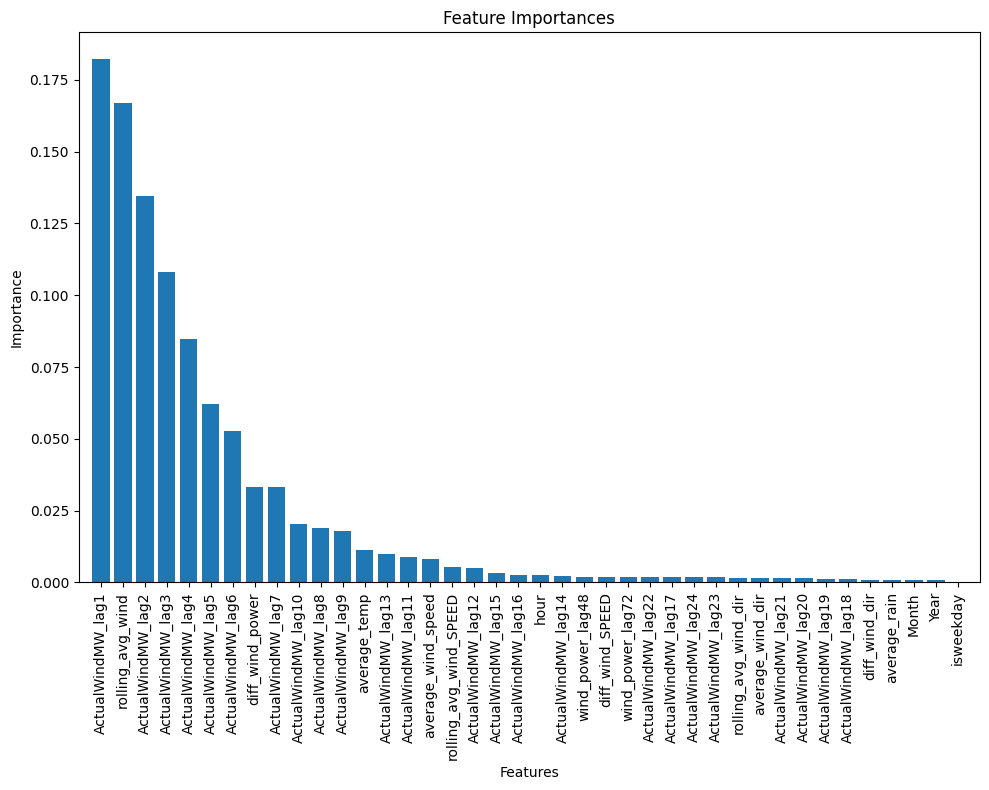

In [62]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming X_train is your features DataFrame and best_model is your trained model
feature_names = X_train.columns

# Retrieving feature importances
feature_importances = best_model.named_steps['rf'].feature_importances_

# Sorting the features by their importance
sorted_indices = np.argsort(feature_importances)[::-1]

# Visualizing the feature importances
plt.figure(figsize=(10, 8))
plt.title("Feature Importances")
plt.bar(range(X_train.shape[1]), feature_importances[sorted_indices], align="center")
plt.xticks(range(X_train.shape[1]), feature_names[sorted_indices], rotation=90)
plt.xlim([-1, X_train.shape[1]])
plt.ylabel("Importance")
plt.xlabel("Features")
plt.tight_layout()
plt.show()

In [63]:

import numpy as np

# Assuming y_true and y_pred are your arrays of actual and predicted values
y_true = np.array(y_test)    # Your actual values
predictions = predictions.flatten()  # Your predictions

# Calculate MAPE
mape = np.mean(np.abs((y_true - predictions) / y_true)) * 100

print(f"MAPE: {mape}%")



MAPE: 12.985716135928474%


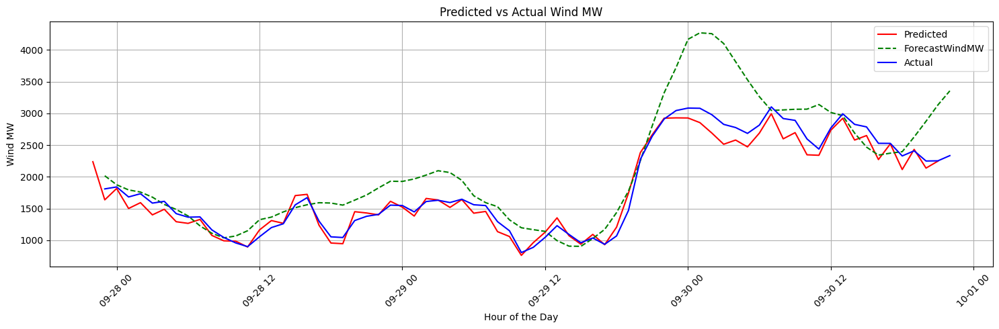

In [66]:


import pandas as pd
import matplotlib.pyplot as plt


# Align predictions with the hour they are predicting, not the hour of data used
# The index for predictions should be one hour ahead of the actuals
predictions_index = data_filtered.index[-72:] + pd.Timedelta(hours=-1)# This assumes predictions are for the next hour

# Create a DataFrame for predictions with the correct future index
predictions_df = pd.DataFrame(predictions, index=predictions_index, columns=['Predicted'])

# Create a DataFrame for actuals
actuals_df = pd.DataFrame(data_filtered['ActualWindMW'].iloc[-72:].values, index=data_filtered.index[-72:], columns=['Actual'])
# Create a DataFrame for the forecasted wind MW from another model or source
forecast_wind_df = pd.DataFrame(data['ForecastWndMW'].iloc[-72:].values, index=data_filtered.index[-72:], columns=['ForecastWindMW'])

# Combine all three DataFrames: predictions, actuals, and forecast wind
combined_df = pd.concat([predictions_df, actuals_df, forecast_wind_df], axis=1)

# Assuming combined_df is correctly aligned
combined_df['Hour'] = combined_df.index.hour

# Now plot the data
plt.figure(figsize=(15, 5))
plt.plot(combined_df.index, combined_df['Predicted'], 'r-', label='Predicted')
plt.plot(combined_df.index, combined_df['ForecastWindMW'], 'g--', label='ForecastWindMW')
plt.plot(combined_df.index, combined_df['Actual'], 'b-', label='Actual')  # Make sure this is correct

plt.legend()
plt.xlabel('Hour of the Day')
plt.ylabel('Wind MW')
plt.title('Predicted vs Actual Wind MW')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()


1 month

In [70]:

# Simplify the dataset to include only necessary features
# Converting 'date' to datetime format and setting it as index
data['date'] = pd.to_datetime(data['date'])
data.set_index('date', inplace=True)

# Including specified features plus creating additional necessary features for modeling
selected_columns = [
    'Year', 'Month', 'DayTime', 'hour', 'isweekday',
    'average_temp', 'average_wind_speed', 'average_wind_dir', 'average_rain',
    'ActualWindMW'  # Target variable
]

# Filter the dataset to include only the selected columns
data_filtered = data[selected_columns]

# Generate lag features for ActualWindMW for 24 hours
for lag in range(1, 25):
    data_filtered[f'ActualWindMW_lag{lag}'] = data_filtered['ActualWindMW'].shift(lag)

data_filtered['wind_power_lag48'] = data_filtered['ActualWindMW'].shift(48)
data_filtered['wind_power_lag72'] = data_filtered['ActualWindMW'].shift(72)

data_filtered['wind_power_lag48'] = data_filtered['ActualWindMW'].shift(124)
data_filtered['wind_power_lag72'] = data_filtered['ActualWindMW'].shift(300)
# Adding rolling averages and differences for 'ActualWindMW'
data_filtered['rolling_avg_wind'] = data_filtered['ActualWindMW'].rolling(window=3).mean().shift(1)
data_filtered['diff_wind_power'] = data_filtered['ActualWindMW'].diff().shift(1)


data_filtered['rolling_avg_wind_SPEED'] = data_filtered['average_wind_speed'].rolling(window=3).mean().shift(1)
data_filtered['diff_wind_SPEED'] = data_filtered['average_wind_speed'].diff().shift(1)

data_filtered['rolling_avg_wind_dir'] = data_filtered['average_wind_dir'].rolling(window=3).mean().shift(1)
data_filtered['diff_wind_dir'] = data_filtered['average_wind_dir'].diff().shift(1)
# Shift the target variable by one hour into the future
data_filtered['ActualWindMW_target'] = data_filtered['ActualWindMW'].shift(-1)

# Dropping rows with NaN values created by lagging
data_filtered.dropna(inplace=True)

data_filtered.head()


<ipython-input-70-e8951e99a1d0>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filtered[f'ActualWindMW_lag{lag}'] = data_filtered['ActualWindMW'].shift(lag)
<ipython-input-70-e8951e99a1d0>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filtered[f'ActualWindMW_lag{lag}'] = data_filtered['ActualWindMW'].shift(lag)
<ipython-input-70-e8951e99a1d0>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

,Year,Month,DayTime,hour,isweekday,average_temp,average_wind_speed,average_wind_dir,average_rain,ActualWindMW,...,ActualWindMW_lag24,wind_power_lag48,wind_power_lag72,rolling_avg_wind,diff_wind_power,rolling_avg_wind_SPEED,diff_wind_SPEED,rolling_avg_wind_dir,diff_wind_dir,ActualWindMW_target
date,,,,,,,,,,,,,,,,,,,,,
2017-01-13 12:00:00,2017,Jan,"13, 12:00",12,True,15.166667,15.166667,303.333333,0.033333,1242,...,1101.0,307.0,1214.0,1631.333333,-219.0,14.444444,-0.833333,301.111111,-1.666667,1022.0
2017-01-13 13:00:00,2017,Jan,"13, 13:00",13,True,15.333333,15.333333,303.333333,0.066667,1022,...,1446.0,311.0,1123.0,1458.333333,-215.0,14.666667,1.166667,301.666667,3.333333,1086.0
2017-01-13 14:00:00,2017,Jan,"13, 14:00",14,True,13.333333,13.333333,301.666667,0.016667,1086,...,1558.0,355.0,1528.0,1240.333333,-220.0,14.833333,0.166667,302.222222,0.000000,1212.0
2017-01-13 15:00:00,2017,Jan,"13, 15:00",15,True,11.500000,11.500000,303.333333,0.033333,1212,...,1636.0,421.0,1612.0,1116.666667,64.0,14.611111,-2.000000,302.777778,-1.666667,1070.0
2017-01-13 16:00:00,2017,Jan,"13, 16:00",16,True,13.000000,13.000000,281.666667,0.000000,1070,...,1719.0,426.0,1473.0,1106.666667,126.0,13.388889,-1.833333,302.777778,1.666667,1049.0


In [71]:
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import joblib
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import LabelEncoder

# Encoding categorical variables
le = LabelEncoder()
data_filtered['Month'] = le.fit_transform(data_filtered['Month'])

# Splitting the dataset into training and testing sets
# We reserve the last 72 observations for testing to simulate forecasting the next 72 hours
training_data = data_filtered.iloc[:-720]
testing_data = data_filtered.iloc[-720:]

# Exclude target variable and non-numeric 'DayTime'
X_train = training_data.drop(['ActualWindMW', 'ActualWindMW_target', 'DayTime'], axis=1)
y_train = training_data['ActualWindMW_target']

X_test = testing_data.drop(['ActualWindMW', 'ActualWindMW_target', 'DayTime'], axis=1)
y_test = testing_data['ActualWindMW_target']



# Splitting the dataset into training and testing sets again
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


# Since RandomForest does not need feature scaling, we'll create a simple
# But you can add preprocessing steps here if needed.
pipeline = Pipeline([
    ('rf', RandomForestRegressor(random_state=42))
])

param_grid = {
    'rf__n_estimators': [300],  # Smaller range
    'rf__max_depth': [20],  # Added a mid-point for diversity
    'rf__min_samples_split': [2],
    'rf__min_samples_leaf': [2],
    'rf__max_features': ['sqrt']
}

# Grid search with cross-validation
grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='neg_mean_squared_error')

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

print(f"Best parameters: {grid_search.best_params_}")
best_model = grid_search.best_estimator_

# Save the best model
model_filename = 'rf_model_optimized.joblib'
joblib.dump(best_model, model_filename)
print(f'Model saved as {model_filename}')

# Predicting with the best model
predictions = best_model.predict(X_test)

# Calculate metrics
rmse = mean_squared_error(y_test, predictions, squared=False)
mae = mean_absolute_error(y_test, predictions)
mse = mean_squared_error(y_test, predictions)
r2 = r2_score(y_test, predictions)

print(f"MAE: {mae}, MSE: {mse}, RMSE: {rmse}, R^2: {r2}")



<ipython-input-71-013f828f5aeb>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filtered['Month'] = le.fit_transform(data_filtered['Month'])


Best parameters: {'rf__max_depth': 20, 'rf__max_features': 'sqrt', 'rf__min_samples_leaf': 2, 'rf__min_samples_split': 2, 'rf__n_estimators': 300}
Model saved as rf_model_optimized.joblib
MAE: 120.8753860364314, MSE: 32225.658191644587, RMSE: 179.51506396858338, R^2: 0.944201481821832


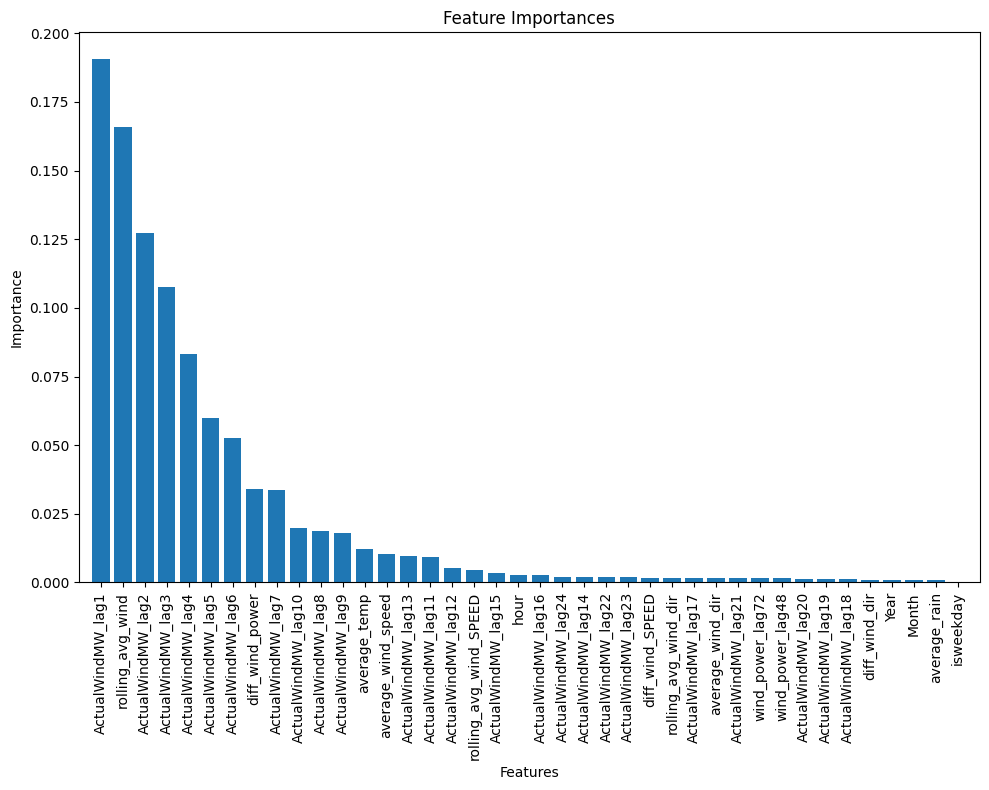

In [72]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming X_train is your features DataFrame and best_model is your trained model
feature_names = X_train.columns

# Retrieving feature importances
feature_importances = best_model.named_steps['rf'].feature_importances_

# Sorting the features by their importance
sorted_indices = np.argsort(feature_importances)[::-1]

# Visualizing the feature importances
plt.figure(figsize=(10, 8))
plt.title("Feature Importances")
plt.bar(range(X_train.shape[1]), feature_importances[sorted_indices], align="center")
plt.xticks(range(X_train.shape[1]), feature_names[sorted_indices], rotation=90)
plt.xlim([-1, X_train.shape[1]])
plt.ylabel("Importance")
plt.xlabel("Features")
plt.tight_layout()
plt.show()

In [73]:


import numpy as np

# Assuming y_true and y_pred are your arrays of actual and predicted values
y_true = np.array(y_test)    # Your actual values
predictions = predictions.flatten()  # Your predictions

# Calculate MAPE
mape = np.mean(np.abs((y_true - predictions) / y_true)) * 100

print(f"MAPE: {mape}%")


MAPE: 21.64998652066701%


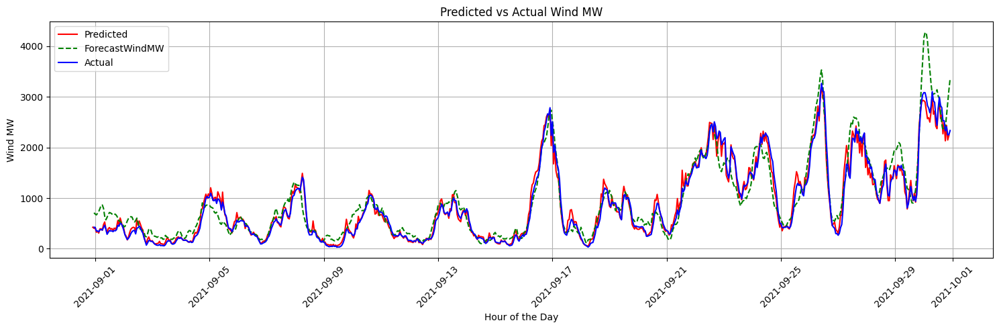

In [76]:

import pandas as pd
import matplotlib.pyplot as plt


# Align predictions with the hour they are predicting, not the hour of data used
# The index for predictions should be one hour ahead of the actuals
predictions_index = data_filtered.index[-720:] + pd.Timedelta(hours=-1)# This assumes predictions are for the next hour

# Create a DataFrame for predictions with the correct future index
predictions_df = pd.DataFrame(predictions, index=predictions_index, columns=['Predicted'])

# Create a DataFrame for actuals
actuals_df = pd.DataFrame(data_filtered['ActualWindMW'].iloc[-720:].values, index=data_filtered.index[-720:], columns=['Actual'])
# Create a DataFrame for the forecasted wind MW from another model or source
forecast_wind_df = pd.DataFrame(data['ForecastWndMW'].iloc[-720:].values, index=data_filtered.index[-720:], columns=['ForecastWindMW'])

# Combine all three DataFrames: predictions, actuals, and forecast wind
combined_df = pd.concat([predictions_df, actuals_df, forecast_wind_df], axis=1)

# Assuming combined_df is correctly aligned
combined_df['Hour'] = combined_df.index.hour

# Now plot the data
plt.figure(figsize=(15, 5))
plt.plot(combined_df.index, combined_df['Predicted'], 'r-', label='Predicted')
plt.plot(combined_df.index, combined_df['ForecastWindMW'], 'g--', label='ForecastWindMW')
plt.plot(combined_df.index, combined_df['Actual'], 'b-', label='Actual')  # Make sure this is correct

plt.legend()
plt.xlabel('Hour of the Day')
plt.ylabel('Wind MW')
plt.title('Predicted vs Actual Wind MW')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

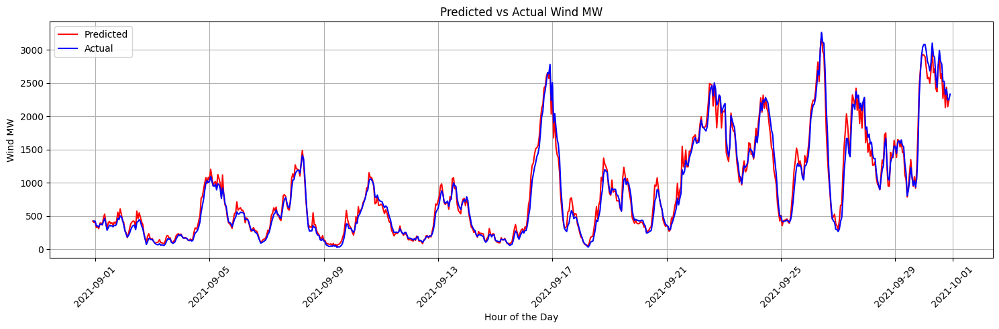

In [79]:

import pandas as pd
import matplotlib.pyplot as plt


# Align predictions with the hour they are predicting, not the hour of data used
# The index for predictions should be one hour ahead of the actuals
predictions_index = data_filtered.index[-720:] + pd.Timedelta(hours=-1)# This assumes predictions are for the next hour

# Create a DataFrame for predictions with the correct future index
predictions_df = pd.DataFrame(predictions, index=predictions_index, columns=['Predicted'])

# Create a DataFrame for actuals
actuals_df = pd.DataFrame(data_filtered['ActualWindMW'].iloc[-720:].values, index=data_filtered.index[-720:], columns=['Actual'])

# Combine all three DataFrames: predictions, actuals, and forecast wind
combined_df = pd.concat([predictions_df, actuals_df], axis=1)

# Assuming combined_df is correctly aligned
combined_df['Hour'] = combined_df.index.hour

# Now plot the data
plt.figure(figsize=(15, 5))
plt.plot(combined_df.index, combined_df['Predicted'], 'r-', label='Predicted')
plt.plot(combined_df.index, combined_df['Actual'], 'b-', label='Actual')  # Make sure this is correct

plt.legend()
plt.xlabel('Hour of the Day')
plt.ylabel('Wind MW')
plt.title('Predicted vs Actual Wind MW')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
# Extracting the last date from the dataset to start the forecast from the next hour
#last_date = data_filtered.index.max()

# Generating a date range for the next 24 hours starting from the last date + 1 hour
#forecast_dates = pd.date_range(start=last_date + pd.Timedelta(hours=1), periods=24, freq='H')

# Creating a DataFrame with the forecast dates and the predicted values
forecast_df2 = pd.DataFrame({
    #'DateTime': data_filtered['DayTime'].iloc[-24:],
    'ForecastedActualWindMW': predictions, #  predictions_ contains the last forecast
    'ActualWindMW': data_filtered['ActualWindMW'].iloc[-720:],
    'ForecastWindMW': data['ForecastWndMW'].iloc[-720:]
})


forecast_df2

,ForecastedActualWindMW,ActualWindMW,ForecastWindMW
date,,,
2021-09-01 00:00:00,406.413355,421,709
2021-09-01 01:00:00,410.095381,351,686
2021-09-01 02:00:00,328.205010,352,668
2021-09-01 03:00:00,349.714692,334,699
2021-09-01 04:00:00,317.309734,373,733
...,...,...,...
2021-09-30 19:00:00,2204.956658,2410,2396
2021-09-30 20:00:00,2403.685921,2249,2628
2021-09-30 21:00:00,2166.127722,2252,2876


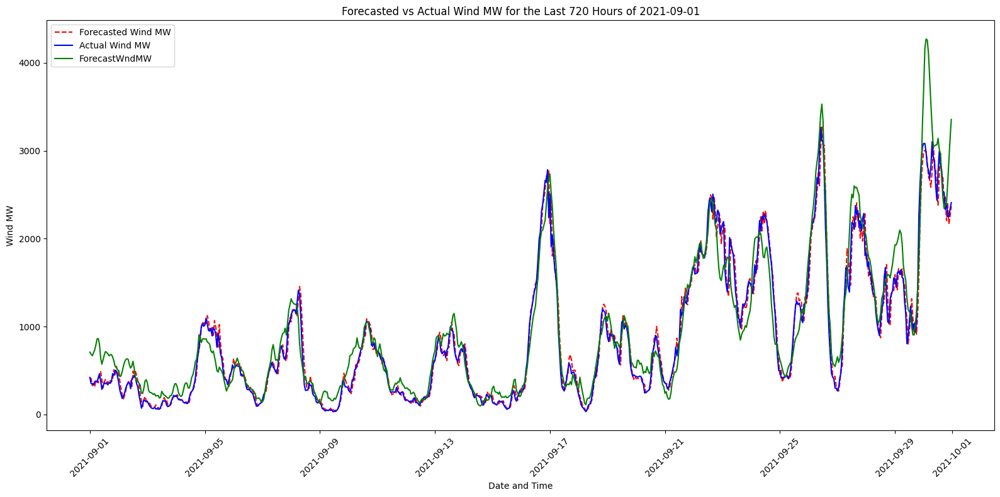

In [ ]:
# Given the structured DataFrame, we can visualize the forecasted versus actual wind MW using matplotlib

# Plotting the forecasted versus actual values
plt.figure(figsize=(16, 8))
plt.plot(forecast_df2.index, forecast_df2['ForecastedActualWindMW'], label='Forecasted Wind MW', color='red', linestyle='--')
plt.plot(forecast_df2.index, forecast_df2['ActualWindMW'], label='Actual Wind MW', color='blue')
plt.plot(forecast_df2.index, forecast_df2['ForecastWindMW'], label='ForecastWndMW', color='green')
plt.title('Forecasted vs Actual Wind MW for the Last 720 Hours of 2021-09-01')
plt.xlabel('Date and Time')
plt.ylabel('Wind MW')
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.show()


### Neural network model (NNM)

In [132]:
import os
import warnings
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import datetime as dt
import math

from sklearn.ensemble import RandomForestRegressor

from sklearn.preprocessing import MinMaxScaler
import os
import warnings
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import datetime as dt
import math

from sklearn.ensemble import RandomForestRegressor

from sklearn.preprocessing import MinMaxScaler

# GitHub URL to your CSV file
github_url = 'https://raw.githubusercontent.com/KaylumCassidy/FYP/main/IslandElectricity2017_2021v5.csv'

# Read the CSV file into a Pandas DataFrame
data = pd.read_csv(github_url)
data['date'] = pd.to_datetime(data['date'])

# Display the first few rows of the DataFrame to understand its structure
print(data.columns)



Index(['Unnamed: 0.2', 'Unnamed: 0.1', 'date', 'Unnamed: 0', 'Year', 'Month',
       'DayTime', ' REGION', 'ActualDemandMW', ' FORECAST DEMAND(MW)',
       'ForecastWndMW', 'ActualWindMW', 'ActualGenerationMW', 'NetTotal_MW',
       'EWIC_MW', 'MOYLE_MW', 'hour', 'isweekday', 'month', 'year', 'rain_BEL',
       'temp_BEL', 'wetb_BEL', 'dewpt_BEL', 'vappr_BEL', 'rhum_BEL', 'msl_BEL',
       'wdsp_BEL', 'wddir_BEL', 'rain_DUB', 'temp_DUB', 'wetb_DUB',
       'dewpt_DUB', 'vappr_DUB', 'rhum_DUB', 'msl_DUB', 'wdsp_DUB',
       'wddir_DUB', 'ww', 'w', 'sun', 'vis', 'clht', 'clamt', 'rain', 'temp',
       'wetb', 'dewpt', 'vappr', 'rhum', 'msl', 'wdsp', 'wddir', 'ww_SHA',
       'w_SHA', 'sun_SHA', 'vis_SHA', 'clht_SHA', 'clamt_SHA', 'rain_COR',
       'temp_COR', 'wetb_COR', 'dewpt_COR', 'vappr_COR', 'rhum_COR', 'msl_COR',
       'wdsp_COR', 'wddir_COR', 'rain_GAL', 'temp_GAL', 'wetb_GAL',
       'dewpt_GAL', 'vappr_GAL', 'rhum_GAL', 'msl_GAL', 'wdsp_GAL',
       'wddir_GAL', 'ind_DON', 'ra

In [108]:


# Simplify the dataset to include only necessary features
# Converting 'date' to datetime format and setting it as index
data['date'] = pd.to_datetime(data['date'])
data.set_index('date', inplace=True)

# Including specified features plus creating additional necessary features for modeling
selected_columns = [
    'Year', 'Month', 'DayTime', 'hour', 'isweekday',
    'average_temp', 'average_wind_speed', 'average_wind_dir', 'average_rain',
    'ActualWindMW'  # Target variable
]

# Filter the dataset to include only the selected columns
data_filtered = data[selected_columns]

# Generate lag features for ActualWindMW for 24 hours
for lag in range(1, 25):
    data_filtered[f'ActualWindMW_lag{lag}'] = data_filtered['ActualWindMW'].shift(lag)

# Adding rolling averages and differences for 'ActualWindMW'
data_filtered['rolling_avg_wind'] = data_filtered['ActualWindMW'].rolling(window=3).mean().shift(1)
data_filtered['diff_wind_power'] = data_filtered['ActualWindMW'].diff().shift(1)


data_filtered['rolling_avg_wind_SPEED'] = data_filtered['average_wind_speed'].rolling(window=3).mean().shift(1)
data_filtered['diff_wind_SPEED'] = data_filtered['average_wind_speed'].diff().shift(1)

data_filtered['rolling_avg_wind_dir'] = data_filtered['average_wind_dir'].rolling(window=3).mean().shift(1)
data_filtered['diff_wind_dir'] = data_filtered['average_wind_dir'].diff().shift(1)

# Shift the target variable by one hour into the future
data_filtered['ActualWindMW_target'] = data_filtered['ActualWindMW'].shift(-1)



# Dropping rows with NaN values created by lagging
data_filtered.dropna(inplace=True)

data_filtered.head()




<ipython-input-108-6bb32f784407>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filtered[f'ActualWindMW_lag{lag}'] = data_filtered['ActualWindMW'].shift(lag)
<ipython-input-108-6bb32f784407>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filtered[f'ActualWindMW_lag{lag}'] = data_filtered['ActualWindMW'].shift(lag)
<ipython-input-108-6bb32f784407>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value ins

,Year,Month,DayTime,hour,isweekday,average_temp,average_wind_speed,average_wind_dir,average_rain,ActualWindMW,...,ActualWindMW_lag22,ActualWindMW_lag23,ActualWindMW_lag24,rolling_avg_wind,diff_wind_power,rolling_avg_wind_SPEED,diff_wind_SPEED,rolling_avg_wind_dir,diff_wind_dir,ActualWindMW_target
date,,,,,,,,,,,,,,,,,,,,,
2017-01-02 00:00:00,2017,Jan,"02, 00:00",0,True,6.666667,6.666667,125.000000,0.000000,1313,...,1528.0,1123.0,1214.0,1622.000000,-128.0,14.277778,-1.666667,81.111111,-55.000000,1269.0
2017-01-02 01:00:00,2017,Jan,"02, 01:00",1,True,6.500000,6.500000,140.000000,0.000000,1269,...,1612.0,1528.0,1123.0,1467.666667,-168.0,11.555556,-6.500000,77.777778,98.333333,1053.0
2017-01-02 02:00:00,2017,Jan,"02, 02:00",2,True,7.000000,7.000000,141.666667,0.016667,1053,...,1473.0,1612.0,1528.0,1354.333333,-44.0,8.777778,-0.166667,97.222222,15.000000,1071.0
2017-01-02 03:00:00,2017,Jan,"02, 03:00",3,True,6.500000,6.500000,146.666667,0.000000,1071,...,1678.0,1473.0,1612.0,1211.666667,-216.0,6.722222,0.500000,135.555556,1.666667,904.0
2017-01-02 04:00:00,2017,Jan,"02, 04:00",4,True,7.333333,7.333333,141.666667,0.000000,904,...,1710.0,1678.0,1473.0,1131.000000,18.0,6.666667,-0.500000,142.777778,5.000000,818.0


In [19]:
pip install -U keras-tuner


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 1.6 MB/s eta 0:00:00


In [109]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from sklearn.preprocessing import StandardScaler
import kerastuner as kt
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import joblib
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import LabelEncoder

# Encoding categorical variables
le = LabelEncoder()
data_filtered['Month'] = le.fit_transform(data_filtered['Month'])

# Splitting the dataset into training and testing sets
# We reserve the last 24 observations for testing to simulate forecasting the next 24 hours It's good practice to reserve the last 24 observations for testing
training_data = data_filtered.iloc[:-24]
testing_data = data_filtered.iloc[-24:]

# Exclude target variable and non-numeric 'DayTime'
X_train = training_data.drop(['ActualWindMW', 'ActualWindMW_target', 'DayTime'], axis=1)
y_train = training_data['ActualWindMW']

X_test = testing_data.drop(['ActualWindMW', 'ActualWindMW_target', 'DayTime'], axis=1)
y_test = testing_data['ActualWindMW']

# Normalize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Early Stopping Callback
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=2,   #How many epochs to wait after the last time the monitored metric improved
    restore_best_weights=True
)

# Data preparation and normalization...
def model_builder(hp):
    model = Sequential()
    model.add(Dense(hp.Int('units', min_value=32, max_value=512, step=32), activation='relu', input_shape=(X_train_scaled.shape[1],)))
    model.add(Dropout(hp.Float('dropout', min_value=0.0, max_value=0.5, step=0.1)))
    for i in range(hp.Int('layers', 1, 3)):
        model.add(Dense(hp.Int(f'units_{i}', min_value=32, max_value=512, step=32), activation='relu'))
        model.add(Dropout(hp.Float(f'dropout_{i}', min_value=0.0, max_value=0.5, step=0.1)))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae', 'mse'])
    return model

tuner = kt.Hyperband(model_builder,
                     objective='val_mae',
                     max_epochs=10,
                     directory='my_dir',
                     project_name='intro_to_kt')

# Perform the hyperparameter search
tuner.search(X_train_scaled, y_train, epochs=50, validation_split=0.2, callbacks=[early_stopping])

# Extract the best hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

# Build the model with the best hyperparameters
model = tuner.hypermodel.build(best_hps)

# Set epochs. You might want to manually set this based on the tuner's output or your preference
epochs = 20  # Example value, adjust based on your needs or tuner results

# Train the best model
history = model.fit(X_train_scaled, y_train, validation_split=0.2, epochs=epochs, batch_size=32, verbose=1)

# Evaluate the model
loss, mae, mse = model.evaluate(X_test_scaled, y_test, verbose=2)
print(f"Test MAE: {mae}, Test MSE: {mse}")

# Predicting with the model
predictions = model.predict(X_test_scaled)

<ipython-input-109-59e84be01932>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filtered['Month'] = le.fit_transform(data_filtered['Month'])


Reloading Tuner from my_dir/intro_to_kt/tuner0.json
Epoch 1/20
1040/1040 [==============================] - 6s 5ms/step - loss: 229292.0781 - mae: 292.5590 - mse: 229292.0781 - val_loss: 33675.5703 - val_mae: 146.3836 - val_mse: 33675.5703
Epoch 2/20
1040/1040 [==============================] - 5s 4ms/step - loss: 22298.8730 - mae: 110.7469 - mse: 22298.8730 - val_loss: 16899.5547 - val_mae: 98.0778 - val_mse: 16899.5547
Epoch 3/20
1040/1040 [==============================] - 4s 4ms/step - loss: 19354.4375 - mae: 101.4162 - mse: 19354.4375 - val_loss: 16732.1074 - val_mae: 93.1638 - val_mse: 16732.1074
Epoch 4/20
1040/1040 [==============================] - 5s 4ms/step - loss: 18840.3184 - mae: 99.8248 - mse: 18840.3184 - val_loss: 16025.1406 - val_mae: 95.6628 - val_mse: 16025.1406
Epoch 5/20
1040/1040 [==============================] - 4s 4ms/step - loss: 18816.7031 - mae: 98.8303 - mse: 18816.7031 - val_loss: 24465.7324 - val_mae: 117.4024 - val_mse: 24465.7324
Epoch 6/20
1040/1040 

Sequential Model: The Sequential model is a linear stack of layers in Keras, making it straightforward to create a model by successively adding layers.

Dense Layer: Dense represents a densely-connected (also known as fully connected) neural network layer, where each neuron in the layer receives input from all neurons of the previous layer. The first argument units is the number of neurons in the layer, which is a hyperparameter that Keras Tuner will optimize. The activation argument specifies the activation function to use, in this case, 'relu' (Rectified Linear Activation).

Dropout Layer: Dropout is a regularization technique where input units are randomly set to 0 at each update during training time, which helps prevent overfitting. The dropout rate (dropout) is the fraction of the input units to drop, which is also a hyperparameter for optimization.

Hyperparameters:

hp.Int('units', min_value=32, max_value=512, step=32): This line defines a search space for the number of units in the Dense layers, ranging from 32 to 512 with a step of 32. Keras Tuner will explore different values within this range to find the best number of neurons.
hp.Float('dropout', min_value=0.0, max_value=0.5, step=0.1): This specifies the search space for the dropout rate, ranging from 0.0 to 0.5 with a step of 0.1.
For Loop for Additional Layers: The loop adds a variable number of additional Dense layers followed by Dropout layers, based on another hyperparameter layers that specifies how many such pairs to add. Each additional layer can have its own number of units and dropout rate, which are also optimized.

Output Layer: The final Dense layer has 1 unit, making it suitable for regression tasks (predicting a single continuous value). No activation function is specified for this layer, implying a linear activation (default).

Compilation: The model is compiled with the 'adam' optimizer and 'mean_squared_error' as the loss function, which is common for regression tasks. Metrics for evaluation include MAE (Mean Absolute Error) and MSE (Mean Squared Error).

In [110]:

# Calculate metrics
rmse = mean_squared_error(y_test, predictions, squared=False)
mae = mean_absolute_error(y_test, predictions)
mse = mean_squared_error(y_test, predictions)
r2 = r2_score(y_test, predictions)

print(f"MAE: {mae}, MSE: {mse}, RMSE: {rmse}, R^2: {r2}")

MAE: 145.72679646809897, MSE: 35446.44720269988, RMSE: 188.27226880956175, R^2: 0.5215368973956371


In [112]:

import numpy as np

# Assuming y_true and y_pred are your arrays of actual and predicted values
y_true = np.array(y_test)    # Your actual values
y_pred = predictions.flatten()  # Your predictions

# Calculate MAPE
mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100

print(f"MAPE: {mape}%")


MAPE: 5.434581095808564%


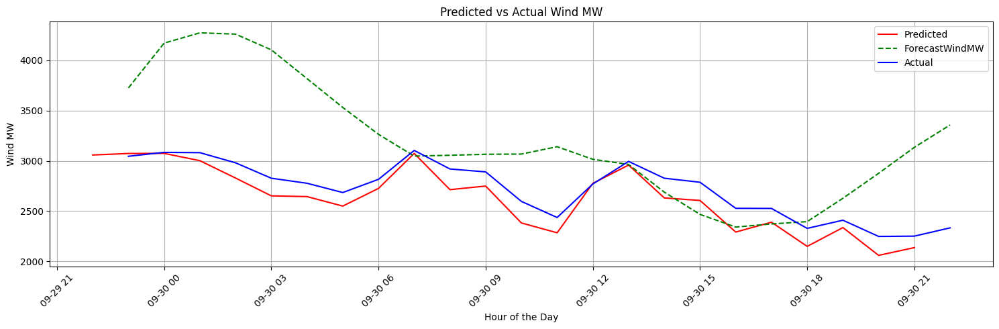

In [114]:


import pandas as pd
import matplotlib.pyplot as plt


# Align predictions with the hour they are predicting, not the hour of data used
# The index for predictions should be one hour ahead of the actuals
predictions_index = data_filtered.index[-24:] + pd.Timedelta(hours=-1) # This assumes predictions are for the next hour

# Create a DataFrame for predictions with the correct future index
predictions_df = pd.DataFrame(predictions, index=predictions_index, columns=['Predicted'])

# Create a DataFrame for actuals
actuals_df = pd.DataFrame(data_filtered['ActualWindMW'].iloc[-24:].values, index=data_filtered.index[-24:], columns=['Actual'])
# Create a DataFrame for the forecasted wind MW from another model or source
forecast_wind_df = pd.DataFrame(data['ForecastWndMW'].iloc[-24:].values, index=data_filtered.index[-24:], columns=['ForecastWindMW'])

# Combine all three DataFrames: predictions, actuals, and forecast wind
combined_df = pd.concat([predictions_df, actuals_df, forecast_wind_df], axis=1)

# Assuming combined_df is correctly aligned
combined_df['Hour'] = combined_df.index.hour

# Now plot the data
plt.figure(figsize=(15, 5))
plt.plot(combined_df.index, combined_df['Predicted'], 'r-', label='Predicted')
plt.plot(combined_df.index, combined_df['ForecastWindMW'], 'g--', label='ForecastWindMW')
plt.plot(combined_df.index, combined_df['Actual'], 'b-', label='Actual')  # Make sure this is correct

plt.legend()
plt.xlabel('Hour of the Day')
plt.ylabel('Wind MW')
plt.title('Predicted vs Actual Wind MW')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

 model was trained to predict the wind power at the current hour (t) based on the wind power from the previous hours (t-1, t-2, ..., t-24), then using pd.Timedelta(hours=-1) would indeed correctly align the predictions with the actuals because no shifting would be necessary.

it appears that the use of pd.Timedelta(hours=-1) effectively aligns your predicted data with the actual observations in a way that matches your expectations for the forecast. This suggests that your model may be predicting the wind power for the current hour (t) using data from the past (t-1 and earlier).

In this case, your forecasted data does not need to be shifted forward because it's already aligned with the timeframe it's predicting for, which is the same as the timeframe of the input data. The forecast is understood to be for the current hour based on past data up to the previous hour. This method works well when you are continually updating the model with new data as it comes in and using it to make a prediction for the current hour.

72 hour

In [133]:


# Simplify the dataset to include only necessary features
# Converting 'date' to datetime format and setting it as index
data['date'] = pd.to_datetime(data['date'])
data.set_index('date', inplace=True)

# Including specified features plus creating additional necessary features for modeling
selected_columns = [
    'Year', 'Month', 'DayTime', 'hour', 'isweekday',
    'average_temp', 'average_wind_speed', 'average_wind_dir', 'average_rain',
    'ActualWindMW'  # Target variable
]

# Filter the dataset to include only the selected columns
data_filtered = data[selected_columns]

# Generate lag features for ActualWindMW for 24 hours
for lag in range(1, 25):
    data_filtered[f'ActualWindMW_lag{lag}'] = data_filtered['ActualWindMW'].shift(lag)
data_filtered['wind_power_lag48'] = data_filtered['ActualWindMW'].shift(48)
data_filtered['wind_power_lag72'] = data_filtered['ActualWindMW'].shift(72)
# Adding rolling averages and differences for 'ActualWindMW'
data_filtered['rolling_avg_wind'] = data_filtered['ActualWindMW'].rolling(window=3).mean().shift(1)
data_filtered['diff_wind_power'] = data_filtered['ActualWindMW'].diff().shift(1)


data_filtered['rolling_avg_wind_SPEED'] = data_filtered['average_wind_speed'].rolling(window=3).mean().shift(1)
data_filtered['diff_wind_SPEED'] = data_filtered['average_wind_speed'].diff().shift(1)

data_filtered['rolling_avg_wind_dir'] = data_filtered['average_wind_dir'].rolling(window=3).mean().shift(1)
data_filtered['diff_wind_dir'] = data_filtered['average_wind_dir'].diff().shift(1)

# Shift the target variable by one hour into the future
data_filtered['ActualWindMW_target'] = data_filtered['ActualWindMW'].shift(-1)



# Dropping rows with NaN values created by lagging
data_filtered.dropna(inplace=True)

data_filtered.head()


<ipython-input-133-3af4e3110757>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filtered[f'ActualWindMW_lag{lag}'] = data_filtered['ActualWindMW'].shift(lag)
<ipython-input-133-3af4e3110757>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filtered[f'ActualWindMW_lag{lag}'] = data_filtered['ActualWindMW'].shift(lag)
<ipython-input-133-3af4e3110757>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value ins

,Year,Month,DayTime,hour,isweekday,average_temp,average_wind_speed,average_wind_dir,average_rain,ActualWindMW,...,ActualWindMW_lag24,wind_power_lag48,wind_power_lag72,rolling_avg_wind,diff_wind_power,rolling_avg_wind_SPEED,diff_wind_SPEED,rolling_avg_wind_dir,diff_wind_dir,ActualWindMW_target
date,,,,,,,,,,,,,,,,,,,,,
2017-01-04 00:00:00,2017,Jan,"04, 00:00",0,True,3.666667,3.666667,191.666667,0.066667,624,...,262.0,1313.0,1214.0,634.000000,13.0,14.833333,1.500000,235.000000,10.000000,660.0
2017-01-04 01:00:00,2017,Jan,"04, 01:00",1,True,2.833333,2.833333,216.666667,0.000000,660,...,259.0,1269.0,1123.0,623.666667,-6.0,11.277778,-12.166667,222.777778,-51.666667,628.0
2017-01-04 02:00:00,2017,Jan,"04, 02:00",2,True,4.333333,4.333333,265.000000,0.000000,628,...,364.0,1053.0,1528.0,638.000000,36.0,7.444444,-0.833333,217.222222,25.000000,608.0
2017-01-04 03:00:00,2017,Jan,"04, 03:00",3,True,4.833333,4.833333,273.333333,0.033333,608,...,364.0,1071.0,1612.0,637.333333,-32.0,3.611111,1.500000,224.444444,48.333333,520.0
2017-01-04 04:00:00,2017,Jan,"04, 04:00",4,True,5.666667,5.666667,263.333333,0.000000,520,...,466.0,904.0,1473.0,632.000000,-20.0,4.000000,0.500000,251.666667,8.333333,449.0


In [141]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from sklearn.preprocessing import StandardScaler
import kerastuner as kt
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import joblib
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import LabelEncoder

# Encoding categorical variables
le = LabelEncoder()
data_filtered['Month'] = le.fit_transform(data_filtered['Month'])

# Splitting the dataset into training and testing sets
# We reserve the last 24 observations for testing to simulate forecasting the next 24 hours It's good practice to reserve the last 24 observations for testing
training_data = data_filtered.iloc[:-72]
testing_data = data_filtered.iloc[-72:]

# Exclude target variable and non-numeric 'DayTime'
X_train = training_data.drop(['ActualWindMW', 'ActualWindMW_target', 'DayTime'], axis=1)
y_train = training_data['ActualWindMW']

X_test = testing_data.drop(['ActualWindMW', 'ActualWindMW_target', 'DayTime'], axis=1)
y_test = testing_data['ActualWindMW']

# Normalize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Early Stopping Callback
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=2,   #How many epochs to wait after the last time the monitored metric improved
    restore_best_weights=True
)

# Data preparation and normalization...
def model_builder(hp):
    model = Sequential()
    model.add(Dense(hp.Int('units', min_value=32, max_value=512, step=32), activation='relu', input_shape=(X_train_scaled.shape[1],)))
    model.add(Dropout(hp.Float('dropout', min_value=0.0, max_value=0.5, step=0.1)))
    for i in range(hp.Int('layers', 1, 3)):
        model.add(Dense(hp.Int(f'units_{i}', min_value=32, max_value=512, step=32), activation='relu'))
        model.add(Dropout(hp.Float(f'dropout_{i}', min_value=0.0, max_value=0.5, step=0.1)))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae', 'mse'])
    return model

tuner = kt.Hyperband(model_builder,
                     objective='val_mae',
                     max_epochs=10,
                     directory='my_dir',
                     project_name='intro_to_kt')

# Perform the hyperparameter search
tuner.search(X_train_scaled, y_train, epochs=50, validation_split=0.2, callbacks=[early_stopping])

# Extract the best hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

# Build the model with the best hyperparameters
model = tuner.hypermodel.build(best_hps)

# Set epochs. You might want to manually set this based on the tuner's output or your preference
epochs = 20  # Example value, adjust based on your needs or tuner results

# Train the best model
history = model.fit(X_train_scaled, y_train, validation_split=0.2, epochs=epochs, batch_size=32, verbose=1)

# Evaluate the model
loss, mae, mse = model.evaluate(X_test_scaled, y_test, verbose=2)
print(f"Test MAE: {mae}, Test MSE: {mse}")

# Predicting with the model
predictions = model.predict(X_test_scaled)

<ipython-input-141-aa14fe97e6e8>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filtered['Month'] = le.fit_transform(data_filtered['Month'])


Reloading Tuner from my_dir/intro_to_kt/tuner0.json
Epoch 1/20
1037/1037 [==============================] - 5s 4ms/step - loss: 234501.6406 - mae: 293.5411 - mse: 234501.6406 - val_loss: 26522.9551 - val_mae: 124.7158 - val_mse: 26522.9551
Epoch 2/20
1037/1037 [==============================] - 4s 4ms/step - loss: 22837.7793 - mae: 112.7638 - mse: 22837.7793 - val_loss: 16469.1855 - val_mae: 96.1065 - val_mse: 16469.1855
Epoch 3/20
1037/1037 [==============================] - 4s 4ms/step - loss: 19765.9043 - mae: 102.7800 - mse: 19765.9043 - val_loss: 15732.9541 - val_mae: 91.5951 - val_mse: 15732.9541
Epoch 4/20
1037/1037 [==============================] - 4s 4ms/step - loss: 19200.3379 - mae: 100.8963 - mse: 19200.3379 - val_loss: 18837.7988 - val_mae: 98.5813 - val_mse: 18837.7988
Epoch 5/20
1037/1037 [==============================] - 4s 4ms/step - loss: 18968.1777 - mae: 99.2383 - mse: 18968.1777 - val_loss: 16490.9883 - val_mae: 97.3106 - val_mse: 16490.9883
Epoch 6/20
1037/1037 

In [142]:

# Calculate metrics
rmse = mean_squared_error(y_test, predictions, squared=False)
mae = mean_absolute_error(y_test, predictions)
mse = mean_squared_error(y_test, predictions)
r2 = r2_score(y_test, predictions)

print(f"MAE: {mae}, MSE: {mse}, RMSE: {rmse}, R^2: {r2}")
import numpy as np

# Assuming y_true and y_pred are your arrays of actual and predicted values
y_true = np.array(y_test)    # Your actual values
y_pred = predictions.flatten()  # Your predictions

# Calculate MAPE
mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100

print(f"MAPE: {mape}%")


MAE: 141.95277574327258, MSE: 33951.87495672227, RMSE: 184.26034558939227, R^2: 0.9348453698462258
MAPE: 9.09033553376389%


In [143]:

import numpy as np

# Assuming y_true and y_pred are your arrays of actual and predicted values
y_true = np.array(y_test)    # Your actual values
predictions = predictions.flatten()  # Your predictions

# Calculate MAPE
mape = np.mean(np.abs((y_true - predictions) / y_true)) * 100

print(f"MAPE: {mape}%")


MAPE: 9.09033553376389%


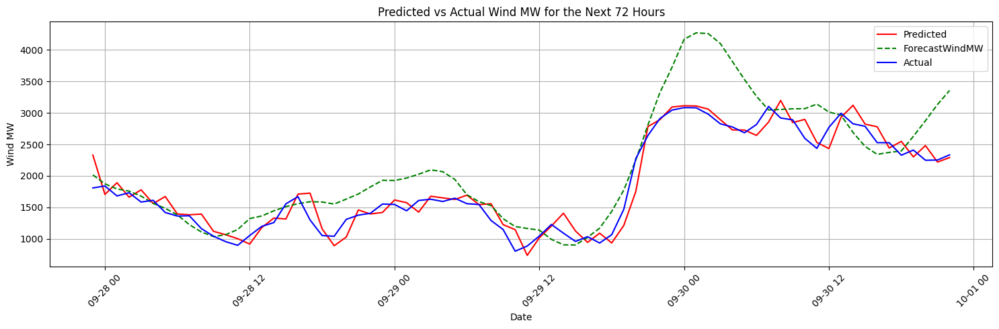

In [145]:

# The index for predictions should match the last 72 observations
predictions_index = data_filtered.index[-72:] #+ pd.Timedelta(hours=-1) # Ensure this index is correct

# Create a DataFrame for predictions with the correct future index
predictions_df = pd.DataFrame(y_pred, index=predictions_index, columns=['Predicted'])

# Ensure actuals_df aligns with these 72 predictions
actuals_df = pd.DataFrame(data_filtered['ActualWindMW'].iloc[-72:].values, index=predictions_index, columns=['Actual'])

# Ensure forecast_wind_df is prepared correctly for the last 72 hours as well
forecast_wind_df = pd.DataFrame(data['ForecastWndMW'].iloc[-72:].values, index=predictions_index, columns=['ForecastWindMW'])

# Combine all three DataFrames
combined_df = pd.concat([predictions_df, actuals_df, forecast_wind_df], axis=1)

# Plotting
plt.figure(figsize=(15, 5))
plt.plot(combined_df.index, combined_df['Predicted'], 'r-', label='Predicted')
plt.plot(combined_df.index, combined_df['ForecastWindMW'], 'g--', label='ForecastWindMW')
plt.plot(combined_df.index, combined_df['Actual'], 'b-', label='Actual')

plt.legend()
plt.xlabel('Date')
plt.ylabel('Wind MW')
plt.title('Predicted vs Actual Wind MW for the Next 72 Hours')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()

In [30]:
combined_df

,Predicted,Actual,ForecastWindMW
date,,,
2021-09-27 23:00:00,2253.266602,1809,2016
2021-09-28 00:00:00,1638.343262,1840,1874
2021-09-28 01:00:00,1813.986694,1682,1793
2021-09-28 02:00:00,1572.369995,1733,1759
2021-09-28 03:00:00,1709.811401,1585,1679
...,...,...,...
2021-09-30 18:00:00,2369.899414,2329,2396
2021-09-30 19:00:00,2135.506836,2410,2628
2021-09-30 20:00:00,2376.308105,2249,2876


1 month

In [121]:


# Simplify the dataset to include only necessary features
# Converting 'date' to datetime format and setting it as index
data['date'] = pd.to_datetime(data['date'])
data.set_index('date', inplace=True)

# Including specified features plus creating additional necessary features for modeling
selected_columns = [
    'Year', 'Month', 'DayTime', 'hour', 'isweekday',
    'average_temp', 'average_wind_speed', 'average_wind_dir', 'average_rain',
    'ActualWindMW'  # Target variable
]

# Filter the dataset to include only the selected columns
data_filtered = data[selected_columns]

# Generate lag features for ActualWindMW for 24 hours
for lag in range(1, 25):
    data_filtered[f'ActualWindMW_lag{lag}'] = data_filtered['ActualWindMW'].shift(lag)
data_filtered['wind_power_lag48'] = data_filtered['ActualWindMW'].shift(48)
data_filtered['wind_power_lag72'] = data_filtered['ActualWindMW'].shift(72)
data_filtered['wind_power_lag48'] = data_filtered['ActualWindMW'].shift(125)
data_filtered['wind_power_lag72'] = data_filtered['ActualWindMW'].shift(720)
# Adding rolling averages and differences for 'ActualWindMW'
data_filtered['rolling_avg_wind'] = data_filtered['ActualWindMW'].rolling(window=3).mean().shift(1)
data_filtered['diff_wind_power'] = data_filtered['ActualWindMW'].diff().shift(1)


data_filtered['rolling_avg_wind_SPEED'] = data_filtered['average_wind_speed'].rolling(window=3).mean().shift(1)
data_filtered['diff_wind_SPEED'] = data_filtered['average_wind_speed'].diff().shift(1)

data_filtered['rolling_avg_wind_dir'] = data_filtered['average_wind_dir'].rolling(window=3).mean().shift(1)
data_filtered['diff_wind_dir'] = data_filtered['average_wind_dir'].diff().shift(1)

# Shift the target variable by one hour into the future
data_filtered['ActualWindMW_target'] = data_filtered['ActualWindMW'].shift(-1)



# Dropping rows with NaN values created by lagging
data_filtered.dropna(inplace=True)

data_filtered.head()


<ipython-input-121-de545aca70da>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filtered[f'ActualWindMW_lag{lag}'] = data_filtered['ActualWindMW'].shift(lag)
<ipython-input-121-de545aca70da>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filtered[f'ActualWindMW_lag{lag}'] = data_filtered['ActualWindMW'].shift(lag)
<ipython-input-121-de545aca70da>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value ins

,Year,Month,DayTime,hour,isweekday,average_temp,average_wind_speed,average_wind_dir,average_rain,ActualWindMW,...,ActualWindMW_lag24,wind_power_lag48,wind_power_lag72,rolling_avg_wind,diff_wind_power,rolling_avg_wind_SPEED,diff_wind_SPEED,rolling_avg_wind_dir,diff_wind_dir,ActualWindMW_target
date,,,,,,,,,,,,,,,,,,,,,
2017-01-31 00:00:00,2017,Jan,"31, 00:00",0,True,10.000000,10.000000,168.333333,0.466667,1133,...,491.0,3069.0,1214.0,1629.000000,-215.0,12.388889,-1.666667,167.777778,8.333333,871.0
2017-01-31 01:00:00,2017,Jan,"31, 01:00",1,True,9.166667,9.166667,166.666667,0.500000,871,...,723.0,3069.0,1123.0,1398.666667,-291.0,11.333333,-1.166667,173.333333,-11.666667,629.0
2017-01-31 02:00:00,2017,Jan,"31, 02:00",2,True,8.333333,8.333333,186.666667,0.166667,629,...,844.0,3040.0,1528.0,1142.666667,-262.0,10.111111,-0.833333,171.666667,-1.666667,418.0
2017-01-31 03:00:00,2017,Jan,"31, 03:00",3,True,6.000000,6.000000,145.000000,0.866667,418,...,810.0,3000.0,1612.0,877.666667,-242.0,9.166667,-0.833333,173.888889,20.000000,269.0
2017-01-31 04:00:00,2017,Jan,"31, 04:00",4,True,5.500000,5.500000,166.666667,0.400000,269,...,960.0,2900.0,1473.0,639.333333,-211.0,7.833333,-2.333333,166.111111,-41.666667,189.0


In [127]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from sklearn.preprocessing import StandardScaler
import kerastuner as kt
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import joblib
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import LabelEncoder

# Encoding categorical variables
le = LabelEncoder()
data_filtered['Month'] = le.fit_transform(data_filtered['Month'])

# Splitting the dataset into training and testing sets
# We reserve the last 24 observations for testing to simulate forecasting the next 24 hours It's good practice to reserve the last 24 observations for testing
training_data = data_filtered.iloc[:-720]
testing_data = data_filtered.iloc[-720:]

# Exclude target variable and non-numeric 'DayTime'
X_train = training_data.drop(['ActualWindMW', 'ActualWindMW_target', 'DayTime'], axis=1)
y_train = training_data['ActualWindMW_target']

X_test = testing_data.drop(['ActualWindMW', 'ActualWindMW_target', 'DayTime'], axis=1)
y_test = testing_data['ActualWindMW_target']

# Normalize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Early Stopping Callback
early_stopping = EarlyStopping(
    monitor='val_loss',
    patience=2,   #How many epochs to wait after the last time the monitored metric improved
    restore_best_weights=True
)

# Data preparation and normalization...
def model_builder(hp):
    model = Sequential()
    model.add(Dense(hp.Int('units', min_value=32, max_value=512, step=32), activation='relu', input_shape=(X_train_scaled.shape[1],)))
    model.add(Dropout(hp.Float('dropout', min_value=0.0, max_value=0.5, step=0.1)))
    for i in range(hp.Int('layers', 1, 3)):
        model.add(Dense(hp.Int(f'units_{i}', min_value=32, max_value=512, step=32), activation='relu'))
        model.add(Dropout(hp.Float(f'dropout_{i}', min_value=0.0, max_value=0.5, step=0.1)))
    model.add(Dense(1))
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae', 'mse'])
    return model

tuner = kt.Hyperband(model_builder,
                     objective='val_mae',
                     max_epochs=10,
                     directory='my_dir',
                     project_name='intro_to_kt')

# Perform the hyperparameter search
tuner.search(X_train_scaled, y_train, epochs=50, validation_split=0.2, callbacks=[early_stopping])

# Extract the best hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

# Build the model with the best hyperparameters
model = tuner.hypermodel.build(best_hps)

# Set epochs. You might want to manually set this based on the tuner's output or your preference
epochs = 20  # Example value, adjust based on your needs or tuner results

# Train the best model
history = model.fit(X_train_scaled, y_train, validation_split=0.2, epochs=epochs, batch_size=32, verbose=1)

# Evaluate the model
loss, mae, mse = model.evaluate(X_test_scaled, y_test, verbose=2)
print(f"Test MAE: {mae}, Test MSE: {mse}")

# Predicting with the model
predictions = model.predict(X_test_scaled)

<ipython-input-127-b03f0c3dfa5a>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filtered['Month'] = le.fit_transform(data_filtered['Month'])


Reloading Tuner from my_dir/intro_to_kt/tuner0.json
Epoch 1/20
1005/1005 [==============================] - 5s 4ms/step - loss: 269252.9375 - mae: 336.1722 - mse: 269252.9375 - val_loss: 67846.2891 - val_mae: 201.1938 - val_mse: 67846.2891
Epoch 2/20
1005/1005 [==============================] - 4s 4ms/step - loss: 54303.6250 - mae: 172.5636 - mse: 54303.6250 - val_loss: 47496.9688 - val_mae: 163.3325 - val_mse: 47496.9688
Epoch 3/20
1005/1005 [==============================] - 4s 4ms/step - loss: 48992.4531 - mae: 161.1161 - mse: 48992.4531 - val_loss: 50915.5352 - val_mae: 172.6858 - val_mse: 50915.5352
Epoch 4/20
1005/1005 [==============================] - 4s 4ms/step - loss: 48489.5273 - mae: 159.5320 - mse: 48489.5273 - val_loss: 60719.9062 - val_mae: 178.5701 - val_mse: 60719.9062
Epoch 5/20
1005/1005 [==============================] - 4s 4ms/step - loss: 48076.8711 - mae: 158.1671 - mse: 48076.8711 - val_loss: 49948.4531 - val_mae: 170.8495 - val_mse: 49948.4531
Epoch 6/20
1005/

In [129]:

# Calculate metrics
rmse = mean_squared_error(y_test, predictions, squared=False)
mae = mean_absolute_error(y_test, predictions)
mse = mean_squared_error(y_test, predictions)
r2 = r2_score(y_test, predictions)

print(f"MAE: {mae}, MSE: {mse}, RMSE: {rmse}, R^2: {r2}")
import numpy as np

# Assuming y_true and y_pred are your arrays of actual and predicted values
y_true = np.array(y_test)    # Your actual values
y_pred = predictions.flatten()  # Your predictions

# Calculate MAPE
mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100

print(f"MAPE: {mape}%")


MAE: 121.69386854171753, MSE: 31892.078845114756, RMSE: 178.58353464167618, R^2: 0.9447790722971144
MAPE: 24.72119644943172%


In [123]:

import numpy as np

# Assuming y_true and y_pred are your arrays of actual and predicted values
y_true = np.array(y_test)    # Your actual values
predictions = predictions.flatten()  # Your predictions

# Calculate MAPE
mape = np.mean(np.abs((y_true - predictions) / y_true)) * 100

print(f"MAPE: {mape}%")

MAPE: 22.92388696490978%


model appears to be quite predictive (as indicated by a high R² value) but also shows a relatively high average percentage error in predictions (as indicated by the MAPE). This discrepancy might suggest that while the model captures the variance in the dataset well, the scale of its errors when they occur can be substantial, particularly for certain observations or under specific conditions.

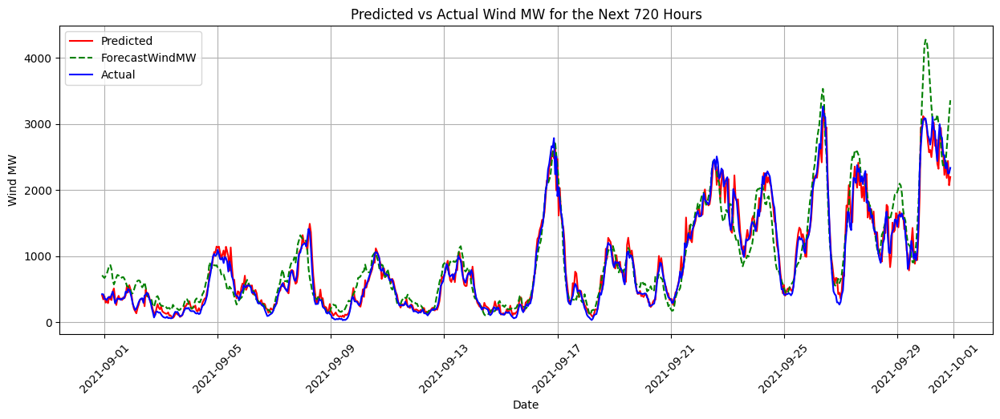

In [130]:

# The index for predictions should match the last 72 observations
predictions_index = data_filtered.index[-720:] + pd.Timedelta(hours=-1)# Ensure this index is correct

# Create a DataFrame for predictions with the correct future index
predictions_df = pd.DataFrame(y_pred, index=predictions_index, columns=['Predicted'])

# Ensure actuals_df aligns with these 72 predictions
actuals_df = pd.DataFrame(data_filtered['ActualWindMW'].iloc[-720:].values, index=predictions_index, columns=['Actual'])

# Ensure forecast_wind_df is prepared correctly for the last 72 hours as well
forecast_wind_df = pd.DataFrame(data['ForecastWndMW'].iloc[-720:].values, index=predictions_index, columns=['ForecastWindMW'])

# Combine all three DataFrames
combined_df = pd.concat([predictions_df, actuals_df, forecast_wind_df], axis=1)

# Plotting
plt.figure(figsize=(15, 5))
plt.plot(combined_df.index, combined_df['Predicted'], 'r-', label='Predicted')
plt.plot(combined_df.index, combined_df['ForecastWindMW'], 'g--', label='ForecastWindMW')
plt.plot(combined_df.index, combined_df['Actual'], 'b-', label='Actual')

plt.legend()
plt.xlabel('Date')
plt.ylabel('Wind MW')
plt.title('Predicted vs Actual Wind MW for the Next 720 Hours')
plt.xticks(rotation=45)
plt.grid(True)

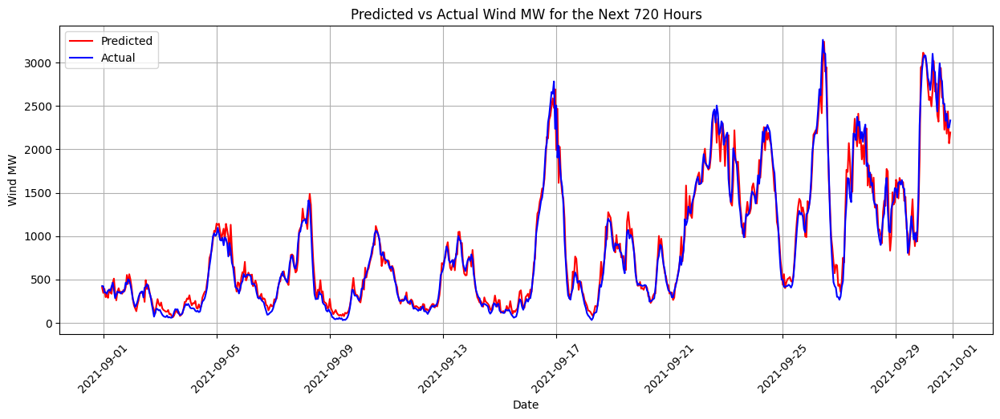

In [131]:

# The index for predictions should match the last 72 observations
predictions_index = data_filtered.index[-720:]  # Ensure this index is correct

# Create a DataFrame for predictions with the correct future index
predictions_df = pd.DataFrame(y_pred, index=predictions_index, columns=['Predicted'])

# Ensure actuals_df aligns with these 72 predictions
actuals_df = pd.DataFrame(data_filtered['ActualWindMW'].iloc[-720:].values, index=predictions_index, columns=['Actual'])

# Combine all three DataFrames
combined_df = pd.concat([predictions_df, actuals_df ], axis=1)

# Plotting
plt.figure(figsize=(15, 5))
plt.plot(combined_df.index, combined_df['Predicted'], 'r-', label='Predicted')
plt.plot(combined_df.index, combined_df['Actual'], 'b-', label='Actual')

plt.legend()
plt.xlabel('Date')
plt.ylabel('Wind MW')
plt.title('Predicted vs Actual Wind MW for the Next 720 Hours')
plt.xticks(rotation=45)
plt.grid(True)

### Support vector REGESSION

In [26]:
import os
import warnings
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import datetime as dt
import math

from sklearn.svm import SVR
from sklearn.preprocessing import MinMaxScaler


In [27]:

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import math

import io
import requests
# GitHub URL to your CSV file
github_url = 'https://raw.githubusercontent.com/KaylumCassidy/FYP/main/IslandElectricity2017_2021v5.csv'

# Read the CSV file into a Pandas DataFrame
data = pd.read_csv(github_url)
data['date'] = pd.to_datetime(data['date'])

# Display the first few rows of the DataFrame to understand its structure
print(data.head())

   Unnamed: 0.2  Unnamed: 0.1                date  Unnamed: 0  Year Month  \
0             0             0 2017-01-01 00:00:00           0  2017   Jan   
1             1             1 2017-01-01 01:00:00           4  2017   Jan   
2             2             2 2017-01-01 02:00:00           8  2017   Jan   
3             3             3 2017-01-01 03:00:00          12  2017   Jan   
4             4             4 2017-01-01 04:00:00          16  2017   Jan   

     DayTime      REGION  ActualDemandMW   FORECAST DEMAND(MW)  ...  rhum_DON  \
0  01, 00:00  All Island            3696                   NaN  ...        70   
1  01, 01:00  All Island            3457                   NaN  ...        80   
2  01, 02:00  All Island            3244                   NaN  ...        69   
3  01, 03:00  All Island            3005                   NaN  ...        70   
4  01, 04:00  All Island            2847                   NaN  ...        71   

   msl_DON  wdsp_DON  wddir_DON  TotalWindCapacity

In [3]:

# Simplify the dataset to include only necessary features
# Converting 'date' to datetime format and setting it as index
data['date'] = pd.to_datetime(data['date'])
data.set_index('date', inplace=True)

# Including specified features plus creating additional necessary features for modeling
selected_columns = [
    'Year', 'Month', 'DayTime', 'hour', 'isweekday',
    'average_temp', 'average_wind_speed', 'average_wind_dir', 'average_rain',
    'ActualWindMW'  # Target variable
]

# Filter the dataset to include only the selected columns
data_filtered = data[selected_columns]

# Generate lag features for ActualWindMW for 24 hours
for lag in range(1, 25):
    data_filtered[f'ActualWindMW_lag{lag}'] = data_filtered['ActualWindMW'].shift(lag)

# Adding rolling averages and differences for 'ActualWindMW'
data_filtered['rolling_avg_wind'] = data_filtered['ActualWindMW'].rolling(window=3).mean().shift(1)
data_filtered['diff_wind_power'] = data_filtered['ActualWindMW'].diff().shift(1)


data_filtered['rolling_avg_wind_SPEED'] = data_filtered['average_wind_speed'].rolling(window=3).mean().shift(1)
data_filtered['diff_wind_SPEED'] = data_filtered['average_wind_speed'].diff().shift(1)

data_filtered['rolling_avg_wind_dir'] = data_filtered['average_wind_dir'].rolling(window=3).mean().shift(1)
data_filtered['diff_wind_dir'] = data_filtered['average_wind_dir'].diff().shift(1)
# Shift the target variable by one hour into the future
data_filtered['ActualWindMW_target'] = data_filtered['ActualWindMW'].shift(-1)

# Dropping rows with NaN values created by lagging
data_filtered.dropna(inplace=True)

data_filtered.head()





<ipython-input-3-f5d99be895db>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filtered[f'ActualWindMW_lag{lag}'] = data_filtered['ActualWindMW'].shift(lag)
<ipython-input-3-f5d99be895db>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filtered[f'ActualWindMW_lag{lag}'] = data_filtered['ActualWindMW'].shift(lag)
<ipython-input-3-f5d99be895db>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



,Year,Month,DayTime,hour,isweekday,average_temp,average_wind_speed,average_wind_dir,average_rain,ActualWindMW,...,ActualWindMW_lag22,ActualWindMW_lag23,ActualWindMW_lag24,rolling_avg_wind,diff_wind_power,rolling_avg_wind_SPEED,diff_wind_SPEED,rolling_avg_wind_dir,diff_wind_dir,ActualWindMW_target
date,,,,,,,,,,,,,,,,,,,,,
2017-01-02 00:00:00,2017,Jan,"02, 00:00",0,True,6.666667,6.666667,125.000000,0.000000,1313,...,1528.0,1123.0,1214.0,1622.000000,-128.0,14.277778,-1.666667,81.111111,-55.000000,1269.0
2017-01-02 01:00:00,2017,Jan,"02, 01:00",1,True,6.500000,6.500000,140.000000,0.000000,1269,...,1612.0,1528.0,1123.0,1467.666667,-168.0,11.555556,-6.500000,77.777778,98.333333,1053.0
2017-01-02 02:00:00,2017,Jan,"02, 02:00",2,True,7.000000,7.000000,141.666667,0.016667,1053,...,1473.0,1612.0,1528.0,1354.333333,-44.0,8.777778,-0.166667,97.222222,15.000000,1071.0
2017-01-02 03:00:00,2017,Jan,"02, 03:00",3,True,6.500000,6.500000,146.666667,0.000000,1071,...,1678.0,1473.0,1612.0,1211.666667,-216.0,6.722222,0.500000,135.555556,1.666667,904.0
2017-01-02 04:00:00,2017,Jan,"02, 04:00",4,True,7.333333,7.333333,141.666667,0.000000,904,...,1710.0,1678.0,1473.0,1131.000000,18.0,6.666667,-0.500000,142.777778,5.000000,818.0


In [4]:
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import LabelEncoder

# Encoding categorical variables
le = LabelEncoder()
data_filtered['Month'] = le.fit_transform(data_filtered['Month'])

# Splitting the dataset into training and testing sets
training_data = data_filtered.iloc[:-24]
testing_data = data_filtered.iloc[-24:]
# Prepare the features and target variable
# Exclude target variable and non-numeric 'DayTime'
X_train = training_data.drop(['ActualWindMW', 'ActualWindMW_target', 'DayTime'], axis=1)
y_train = training_data['ActualWindMW']

X_test = testing_data.drop(['ActualWindMW', 'ActualWindMW_target', 'DayTime'], axis=1)
y_test = testing_data['ActualWindMW']

# Set up the SVR pipeline
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('svr', SVR())
])

# Define a range of hyperparameters for the SVR
param_grid = {
    'svr__C': [50],  # Now 4 different values for C
    'svr__epsilon': [1],  # Now 5 different values for epsilon
    'svr__kernel': ['linear']  # different kernels
}

# Create a GridSearchCV object
grid_search = GridSearchCV(pipeline, param_grid, cv=2, scoring='neg_mean_squared_error', verbose=2)

# Fit the model with the grid search
grid_search.fit(X_train, y_train)

# The best hyperparameters from GridSearchCV
print("Best Parameters:", grid_search.best_params_)

# You can then use the best estimator to make predictions and evaluate the model
best_model = grid_search.best_estimator_
predictions = best_model.predict(X_test)

# Calculate metrics
mse = mean_squared_error(y_test, predictions)
r2 = r2_score(y_test, predictions)
print(f"Mean Squared Error: {mse}")
print(f"R^2 Score: {r2}")


Fitting 2 folds for each of 1 candidates, totalling 2 fits


<ipython-input-4-60958dcd5107>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filtered['Month'] = le.fit_transform(data_filtered['Month'])


[CV] END ......svr__C=50, svr__epsilon=1, svr__kernel=linear; total time=  46.4s
[CV] END ......svr__C=50, svr__epsilon=1, svr__kernel=linear; total time=  49.7s
Best Parameters: {'svr__C': 50, 'svr__epsilon': 1, 'svr__kernel': 'linear'}
Mean Squared Error: 30231.788932947897
R^2 Score: 0.5919253783765179


In [5]:

predictions = best_model.predict(X_test)

# Evaluate the model
from sklearn.metrics import mean_squared_error, r2_score
mse = mean_squared_error(y_test, predictions)
r2 = r2_score(y_test, predictions)

print(f"Mean Squared Error: {mse}")
print(f"R^2 Score: {r2}")


# Calculate metrics
rmse = mean_squared_error(y_test, predictions, squared=False)
mae = mean_absolute_error(y_test, predictions)
mse = mean_squared_error(y_test, predictions)
r2 = r2_score(y_test, predictions)

print(f"MAE: {mae}, MSE: {mse}, RMSE: {rmse}, R^2: {r2}")

Mean Squared Error: 30231.788932947897
R^2 Score: 0.5919253783765179
MAE: 139.81408869119173, MSE: 30231.788932947897, RMSE: 173.87291029067148, R^2: 0.5919253783765179


In [6]:

import numpy as np

# Assuming y_true and y_pred are your arrays of actual and predicted values
y_true = np.array(y_test)    # Your actual values
predictions = predictions.flatten()  # Your predictions

# Calculate MAPE
mape = np.mean(np.abs((y_true - predictions) / y_true)) * 100

print(f"MAPE: {mape}%")




MAPE: 5.203771625782405%


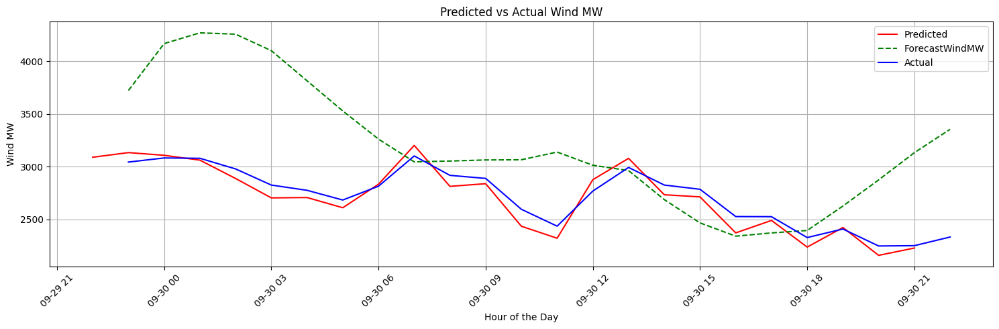

In [7]:
import pandas as pd
import matplotlib.pyplot as plt

predictions_index = data_filtered.index[-24:] + pd.Timedelta(hours=-1)# This assumes predictions are for the next hour

# Create a DataFrame for predictions with the correct future index
predictions_df = pd.DataFrame(predictions, index=predictions_index, columns=['Predicted'])

# Create a DataFrame for actuals
actuals_df = pd.DataFrame(data_filtered['ActualWindMW'].iloc[-24:].values, index=data_filtered.index[-24:], columns=['Actual'])
# Create a DataFrame for the forecasted wind MW from another model or source
forecast_wind_df = pd.DataFrame(data['ForecastWndMW'].iloc[-24:].values, index=data_filtered.index[-24:], columns=['ForecastWindMW'])

# Combine all three DataFrames: predictions, actuals, and forecast wind
combined_df = pd.concat([predictions_df, actuals_df, forecast_wind_df], axis=1)

# Assuming combined_df is correctly aligned
combined_df['Hour'] = combined_df.index.hour

# Now plot the data
plt.figure(figsize=(15, 5))
plt.plot(combined_df.index, combined_df['Predicted'], 'r-', label='Predicted')
plt.plot(combined_df.index, combined_df['ForecastWindMW'], 'g--', label='ForecastWindMW')
plt.plot(combined_df.index, combined_df['Actual'], 'b-', label='Actual')  # Make sure this is correct

plt.legend()
plt.xlabel('Hour of the Day')
plt.ylabel('Wind MW')
plt.title('Predicted vs Actual Wind MW')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

72 HOUR

In [12]:

# Simplify the dataset to include only necessary features
# Converting 'date' to datetime format and setting it as index
data['date'] = pd.to_datetime(data['date'])
data.set_index('date', inplace=True)

# Including specified features plus creating additional necessary features for modeling
selected_columns = [
    'Year', 'Month', 'DayTime', 'hour', 'isweekday',
    'average_temp', 'average_wind_speed', 'average_wind_dir', 'average_rain',
    'ActualWindMW'  # Target variable
]

# Filter the dataset to include only the selected columns
data_filtered = data[selected_columns]

# Generate lag features for ActualWindMW for 24 hours
for lag in range(1, 25):
    data_filtered[f'ActualWindMW_lag{lag}'] = data_filtered['ActualWindMW'].shift(lag)

data_filtered['wind_power_lag48'] = data_filtered['ActualWindMW'].shift(48)
data_filtered['wind_power_lag72'] = data_filtered['ActualWindMW'].shift(72)
# Adding rolling averages and differences for 'ActualWindMW'
data_filtered['rolling_avg_wind'] = data_filtered['ActualWindMW'].rolling(window=3).mean().shift(1)
data_filtered['diff_wind_power'] = data_filtered['ActualWindMW'].diff().shift(1)


data_filtered['rolling_avg_wind_SPEED'] = data_filtered['average_wind_speed'].rolling(window=3).mean().shift(1)
data_filtered['diff_wind_SPEED'] = data_filtered['average_wind_speed'].diff().shift(1)

data_filtered['rolling_avg_wind_dir'] = data_filtered['average_wind_dir'].rolling(window=3).mean().shift(1)
data_filtered['diff_wind_dir'] = data_filtered['average_wind_dir'].diff().shift(1)
# Shift the target variable by one hour into the future
data_filtered['ActualWindMW_target'] = data_filtered['ActualWindMW'].shift(-1)

# Dropping rows with NaN values created by lagging
data_filtered.dropna(inplace=True)

data_filtered.head()




<ipython-input-12-d74bedc3aaaa>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filtered[f'ActualWindMW_lag{lag}'] = data_filtered['ActualWindMW'].shift(lag)
<ipython-input-12-d74bedc3aaaa>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filtered[f'ActualWindMW_lag{lag}'] = data_filtered['ActualWindMW'].shift(lag)
<ipython-input-12-d74bedc3aaaa>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

,Year,Month,DayTime,hour,isweekday,average_temp,average_wind_speed,average_wind_dir,average_rain,ActualWindMW,...,ActualWindMW_lag24,wind_power_lag48,wind_power_lag72,rolling_avg_wind,diff_wind_power,rolling_avg_wind_SPEED,diff_wind_SPEED,rolling_avg_wind_dir,diff_wind_dir,ActualWindMW_target
date,,,,,,,,,,,,,,,,,,,,,
2017-01-04 00:00:00,2017,Jan,"04, 00:00",0,True,3.666667,3.666667,191.666667,0.066667,624,...,262.0,1313.0,1214.0,634.000000,13.0,14.833333,1.500000,235.000000,10.000000,660.0
2017-01-04 01:00:00,2017,Jan,"04, 01:00",1,True,2.833333,2.833333,216.666667,0.000000,660,...,259.0,1269.0,1123.0,623.666667,-6.0,11.277778,-12.166667,222.777778,-51.666667,628.0
2017-01-04 02:00:00,2017,Jan,"04, 02:00",2,True,4.333333,4.333333,265.000000,0.000000,628,...,364.0,1053.0,1528.0,638.000000,36.0,7.444444,-0.833333,217.222222,25.000000,608.0
2017-01-04 03:00:00,2017,Jan,"04, 03:00",3,True,4.833333,4.833333,273.333333,0.033333,608,...,364.0,1071.0,1612.0,637.333333,-32.0,3.611111,1.500000,224.444444,48.333333,520.0
2017-01-04 04:00:00,2017,Jan,"04, 04:00",4,True,5.666667,5.666667,263.333333,0.000000,520,...,466.0,904.0,1473.0,632.000000,-20.0,4.000000,0.500000,251.666667,8.333333,449.0


In [13]:
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import LabelEncoder

# Encoding categorical variables
le = LabelEncoder()
data_filtered['Month'] = le.fit_transform(data_filtered['Month'])

# Splitting the dataset into training and testing sets
training_data = data_filtered.iloc[:-72]
testing_data = data_filtered.iloc[-72:]
# Prepare the features and target variable
X_train = training_data.drop(['ActualWindMW', 'DayTime'], axis=1)  # Exclude target variable and non-numeric 'DayTime'
y_train = training_data['ActualWindMW_target']

X_test = testing_data.drop(['ActualWindMW', 'DayTime'], axis=1)  # The same for testing set
y_test = testing_data['ActualWindMW_target']

# Set up the SVR pipeline
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('svr', SVR())
])


# Define a range of hyperparameters for the SVR
param_grid = {
    'svr__C': [50],  # Now 4 different values for C
    'svr__epsilon': [1],  # Now 5 different values for epsilon
    'svr__kernel': ['linear']  # 4 different kernels
}

# Create a GridSearchCV object
grid_search = GridSearchCV(pipeline, param_grid, cv=2, scoring='neg_mean_squared_error', verbose=2)

# Fit the model with the grid search
grid_search.fit(X_train, y_train)

# The best hyperparameters from GridSearchCV
print("Best Parameters:", grid_search.best_params_)

# You can then use the best estimator to make predictions and evaluate the model
best_model2 = grid_search.best_estimator_
predictions = best_model2.predict(X_test)

# Calculate metrics
mse = mean_squared_error(y_test, predictions)
r2 = r2_score(y_test, predictions)
print(f"Mean Squared Error: {mse}")
print(f"R^2 Score: {r2}")

<ipython-input-13-f8ba74a5edc2>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filtered['Month'] = le.fit_transform(data_filtered['Month'])


Fitting 2 folds for each of 1 candidates, totalling 2 fits
[CV] END ......svr__C=50, svr__epsilon=1, svr__kernel=linear; total time=   5.8s
[CV] END ......svr__C=50, svr__epsilon=1, svr__kernel=linear; total time=   4.4s
Best Parameters: {'svr__C': 50, 'svr__epsilon': 1, 'svr__kernel': 'linear'}
Mean Squared Error: 0.14925964169061917
R^2 Score: 0.999999715923076


In [14]:

predictions = best_model2.predict(X_test)

# Evaluate the model
from sklearn.metrics import mean_squared_error, r2_score
mse = mean_squared_error(y_test, predictions)
r2 = r2_score(y_test, predictions)

print(f"Mean Squared Error: {mse}")
print(f"R^2 Score: {r2}")


# Calculate metrics
rmse = mean_squared_error(y_test, predictions, squared=False)
mae = mean_absolute_error(y_test, predictions)
mse = mean_squared_error(y_test, predictions)
r2 = r2_score(y_test, predictions)

print(f"MAE: {mae}, MSE: {mse}, RMSE: {rmse}, R^2: {r2}")


Mean Squared Error: 0.14925964169061917
R^2 Score: 0.999999715923076
MAE: 0.3052048804464328, MSE: 0.14925964169061917, RMSE: 0.38634135384478213, R^2: 0.999999715923076


In [15]:

import numpy as np

# Assuming y_true and y_pred are your arrays of actual and predicted values
y_true = np.array(y_test)    # Your actual values
predictions = predictions.flatten()  # Your predictions

# Calculate MAPE
mape = np.mean(np.abs((y_true - predictions) / y_true)) * 100

print(f"MAPE: {mape}%")

MAPE: 0.021638523165014457%


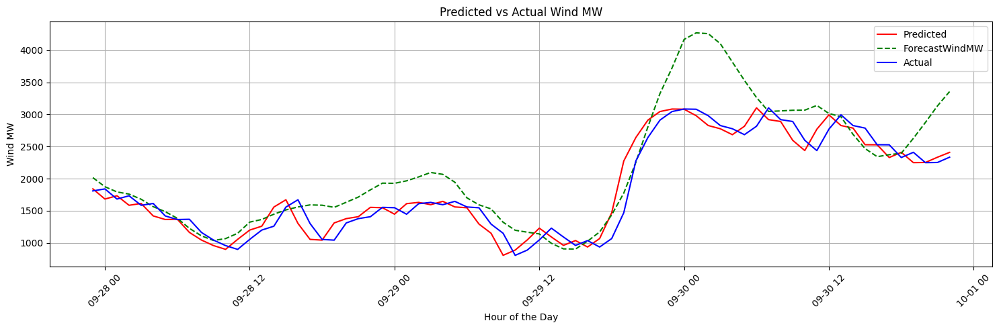

In [22]:


import pandas as pd
import matplotlib.pyplot as plt

predictions_index = data_filtered.index[-72:]# + pd.Timedelta(hours=-1)# This assumes predictions are for the next hour

# Create a DataFrame for predictions with the correct future index
predictions_df = pd.DataFrame(predictions, index=predictions_index, columns=['Predicted'])

# Create a DataFrame for actuals
actuals_df = pd.DataFrame(data_filtered['ActualWindMW'].iloc[-72:].values, index=data_filtered.index[-72:], columns=['Actual'])
# Create a DataFrame for the forecasted wind MW from another model or source
forecast_wind_df = pd.DataFrame(data['ForecastWndMW'].iloc[-72:].values, index=data_filtered.index[-72:], columns=['ForecastWindMW'])

# Combine all three DataFrames: predictions, actuals, and forecast wind
combined_df = pd.concat([predictions_df, actuals_df, forecast_wind_df], axis=1)

# Assuming combined_df is correctly aligned
combined_df['Hour'] = combined_df.index.hour

# Now plot the data
plt.figure(figsize=(15, 5))
plt.plot(combined_df.index, combined_df['Predicted'], 'r-', label='Predicted')
plt.plot(combined_df.index, combined_df['ForecastWindMW'], 'g--', label='ForecastWindMW')
plt.plot(combined_df.index, combined_df['Actual'], 'b-', label='Actual')  # Make sure this is correct

plt.legend()
plt.xlabel('Hour of the Day')
plt.ylabel('Wind MW')
plt.title('Predicted vs Actual Wind MW')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()


1 month

In [28]:

# Simplify the dataset to include only necessary features
# Converting 'date' to datetime format and setting it as index
data['date'] = pd.to_datetime(data['date'])
data.set_index('date', inplace=True)

# Including specified features plus creating additional necessary features for modeling
selected_columns = [
    'Year', 'Month', 'DayTime', 'hour', 'isweekday',
    'average_temp', 'average_wind_speed', 'average_wind_dir', 'average_rain',
    'ActualWindMW'  # Target variable
]

# Filter the dataset to include only the selected columns
data_filtered = data[selected_columns]

# Generate lag features for ActualWindMW for 24 hours
for lag in range(1, 25):
    data_filtered[f'ActualWindMW_lag{lag}'] = data_filtered['ActualWindMW'].shift(lag)

data_filtered['wind_power_lag48'] = data_filtered['ActualWindMW'].shift(48)
data_filtered['wind_power_lag72'] = data_filtered['ActualWindMW'].shift(72)
data_filtered['wind_power_lag48'] = data_filtered['ActualWindMW'].shift(100)
data_filtered['wind_power_lag72'] = data_filtered['ActualWindMW'].shift(300)
# Adding rolling averages and differences for 'ActualWindMW'
data_filtered['rolling_avg_wind'] = data_filtered['ActualWindMW'].rolling(window=3).mean().shift(1)
data_filtered['diff_wind_power'] = data_filtered['ActualWindMW'].diff().shift(1)


data_filtered['rolling_avg_wind_SPEED'] = data_filtered['average_wind_speed'].rolling(window=3).mean().shift(1)
data_filtered['diff_wind_SPEED'] = data_filtered['average_wind_speed'].diff().shift(1)

data_filtered['rolling_avg_wind_dir'] = data_filtered['average_wind_dir'].rolling(window=3).mean().shift(1)
data_filtered['diff_wind_dir'] = data_filtered['average_wind_dir'].diff().shift(1)
# Shift the target variable by one hour into the future
data_filtered['ActualWindMW_target'] = data_filtered['ActualWindMW'].shift(-1)

# Dropping rows with NaN values created by lagging
data_filtered.dropna(inplace=True)

data_filtered.head()

<ipython-input-28-6c65b2205698>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filtered[f'ActualWindMW_lag{lag}'] = data_filtered['ActualWindMW'].shift(lag)
<ipython-input-28-6c65b2205698>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filtered[f'ActualWindMW_lag{lag}'] = data_filtered['ActualWindMW'].shift(lag)
<ipython-input-28-6c65b2205698>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

,Year,Month,DayTime,hour,isweekday,average_temp,average_wind_speed,average_wind_dir,average_rain,ActualWindMW,...,ActualWindMW_lag24,wind_power_lag48,wind_power_lag72,rolling_avg_wind,diff_wind_power,rolling_avg_wind_SPEED,diff_wind_SPEED,rolling_avg_wind_dir,diff_wind_dir,ActualWindMW_target
date,,,,,,,,,,,,,,,,,,,,,
2017-01-13 12:00:00,2017,Jan,"13, 12:00",12,True,15.166667,15.166667,303.333333,0.033333,1242,...,1101.0,1657.0,1214.0,1631.333333,-219.0,14.444444,-0.833333,301.111111,-1.666667,1022.0
2017-01-13 13:00:00,2017,Jan,"13, 13:00",13,True,15.333333,15.333333,303.333333,0.066667,1022,...,1446.0,1685.0,1123.0,1458.333333,-215.0,14.666667,1.166667,301.666667,3.333333,1086.0
2017-01-13 14:00:00,2017,Jan,"13, 14:00",14,True,13.333333,13.333333,301.666667,0.016667,1086,...,1558.0,1807.0,1528.0,1240.333333,-220.0,14.833333,0.166667,302.222222,0.000000,1212.0
2017-01-13 15:00:00,2017,Jan,"13, 15:00",15,True,11.500000,11.500000,303.333333,0.033333,1212,...,1636.0,1810.0,1612.0,1116.666667,64.0,14.611111,-2.000000,302.777778,-1.666667,1070.0
2017-01-13 16:00:00,2017,Jan,"13, 16:00",16,True,13.000000,13.000000,281.666667,0.000000,1070,...,1719.0,2022.0,1473.0,1106.666667,126.0,13.388889,-1.833333,302.777778,1.666667,1049.0


In [29]:
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import LabelEncoder

# Encoding categorical variables
le = LabelEncoder()
data_filtered['Month'] = le.fit_transform(data_filtered['Month'])

# Splitting the dataset into training and testing sets
training_data = data_filtered.iloc[:-720]
testing_data = data_filtered.iloc[-720:]
# Prepare the features and target variable
X_train = training_data.drop(['ActualWindMW', 'DayTime'], axis=1)  # Exclude target variable and non-numeric 'DayTime'
y_train = training_data['ActualWindMW_target']

X_test = testing_data.drop(['ActualWindMW', 'DayTime'], axis=1)  # The same for testing set
y_test = testing_data['ActualWindMW_target']

# Set up the SVR pipeline
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('svr', SVR())
])


# Define a range of hyperparameters for the SVR
param_grid = {
    'svr__C': [50],  # Now 4 different values for C
    'svr__epsilon': [1],  # Now 5 different values for epsilon
    'svr__kernel': ['linear']  # 4 different kernels
}

# Create a GridSearchCV object
grid_search = GridSearchCV(pipeline, param_grid, cv=2, scoring='neg_mean_squared_error', verbose=2)

# Fit the model with the grid search
grid_search.fit(X_train, y_train)

# The best hyperparameters from GridSearchCV
print("Best Parameters:", grid_search.best_params_)

# You can then use the best estimator to make predictions and evaluate the model
best_model2 = grid_search.best_estimator_
predictions = best_model2.predict(X_test)

# Calculate metrics
mse = mean_squared_error(y_test, predictions)
r2 = r2_score(y_test, predictions)
print(f"Mean Squared Error: {mse}")
print(f"R^2 Score: {r2}")

<ipython-input-29-9c6e48888060>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filtered['Month'] = le.fit_transform(data_filtered['Month'])


Fitting 2 folds for each of 1 candidates, totalling 2 fits
[CV] END ......svr__C=50, svr__epsilon=1, svr__kernel=linear; total time=   3.7s
[CV] END ......svr__C=50, svr__epsilon=1, svr__kernel=linear; total time=   5.0s
Best Parameters: {'svr__C': 50, 'svr__epsilon': 1, 'svr__kernel': 'linear'}
Mean Squared Error: 0.2554419908521498
R^2 Score: 0.9999995577038494


In [30]:

predictions = best_model2.predict(X_test)

# Evaluate the model
from sklearn.metrics import mean_squared_error, r2_score
mse = mean_squared_error(y_test, predictions)
r2 = r2_score(y_test, predictions)

print(f"Mean Squared Error: {mse}")
print(f"R^2 Score: {r2}")


# Calculate metrics
rmse = mean_squared_error(y_test, predictions, squared=False)
mae = mean_absolute_error(y_test, predictions)
mse = mean_squared_error(y_test, predictions)
r2 = r2_score(y_test, predictions)

print(f"MAE: {mae}, MSE: {mse}, RMSE: {rmse}, R^2: {r2}")

Mean Squared Error: 0.2554419908521498
R^2 Score: 0.9999995577038494
MAE: 0.45922938369735755, MSE: 0.2554419908521498, RMSE: 0.5054126936001408, R^2: 0.9999995577038494


In [31]:

import numpy as np

# Assuming y_true and y_pred are your arrays of actual and predicted values
y_true = np.array(y_test)    # Your actual values
predictions = predictions.flatten()  # Your predictions

# Calculate MAPE
mape = np.mean(np.abs((y_true - predictions) / y_true)) * 100

print(f"MAPE: {mape}%")

MAPE: 0.18256233165954786%


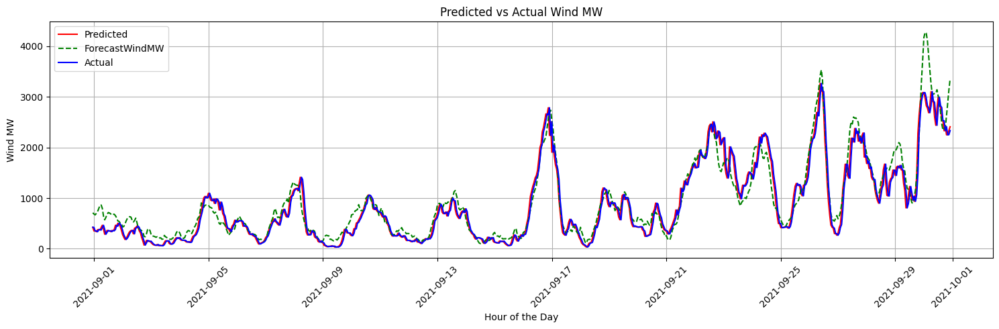

In [35]:


import pandas as pd
import matplotlib.pyplot as plt

predictions_index = data_filtered.index[-720:]# + pd.Timedelta(hours=-1)# This assumes predictions are for the next hour

# Create a DataFrame for predictions with the correct future index
predictions_df = pd.DataFrame(predictions, index=predictions_index, columns=['Predicted'])

# Create a DataFrame for actuals
actuals_df = pd.DataFrame(data_filtered['ActualWindMW'].iloc[-720:].values, index=data_filtered.index[-720:], columns=['Actual'])
# Create a DataFrame for the forecasted wind MW from another model or source
forecast_wind_df = pd.DataFrame(data['ForecastWndMW'].iloc[-720:].values, index=data_filtered.index[-720:], columns=['ForecastWindMW'])

# Combine all three DataFrames: predictions, actuals, and forecast wind
combined_df = pd.concat([predictions_df, actuals_df, forecast_wind_df], axis=1)

# Assuming combined_df is correctly aligned
combined_df['Hour'] = combined_df.index.hour

# Now plot the data
plt.figure(figsize=(15, 5))
plt.plot(combined_df.index, combined_df['Predicted'], 'r-', label='Predicted')
plt.plot(combined_df.index, combined_df['ForecastWindMW'], 'g--', label='ForecastWindMW')
plt.plot(combined_df.index, combined_df['Actual'], 'b-', label='Actual')  # Make sure this is correct

plt.legend()
plt.xlabel('Hour of the Day')
plt.ylabel('Wind MW')
plt.title('Predicted vs Actual Wind MW')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

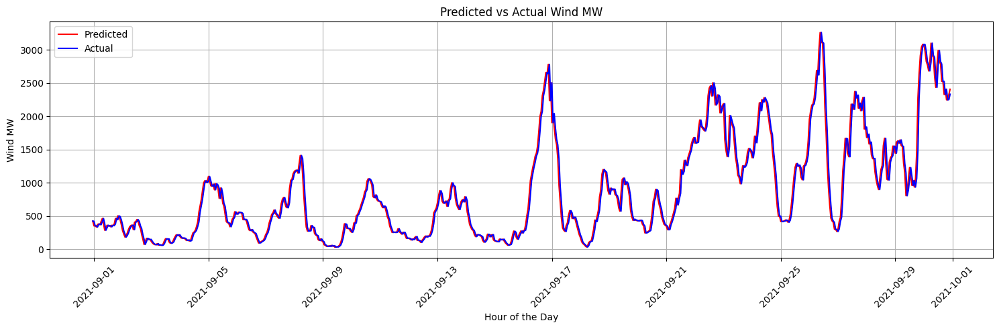

In [36]:


import pandas as pd
import matplotlib.pyplot as plt

predictions_index = data_filtered.index[-720:]# + pd.Timedelta(hours=-1)# This assumes predictions are for the next hour

# Create a DataFrame for predictions with the correct future index
predictions_df = pd.DataFrame(predictions, index=predictions_index, columns=['Predicted'])

# Create a DataFrame for actuals
actuals_df = pd.DataFrame(data_filtered['ActualWindMW'].iloc[-720:].values, index=data_filtered.index[-720:], columns=['Actual'])

# Combine all three DataFrames: predictions, actuals, and forecast wind
combined_df = pd.concat([predictions_df, actuals_df], axis=1)

# Assuming combined_df is correctly aligned
combined_df['Hour'] = combined_df.index.hour

# Now plot the data
plt.figure(figsize=(15, 5))
plt.plot(combined_df.index, combined_df['Predicted'], 'r-', label='Predicted')

plt.plot(combined_df.index, combined_df['Actual'], 'b-', label='Actual')  # Make sure this is correct

plt.legend()
plt.xlabel('Hour of the Day')
plt.ylabel('Wind MW')
plt.title('Predicted vs Actual Wind MW')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

## Time series models

### SARIMA

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error


In [2]:
import pandas as pd
import numpy as np
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
from math import sqrt


In [3]:

from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import joblib
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import LabelEncoder


In [4]:
!pip install statsmodels


In [5]:

# GitHub URL to your CSV file
github_url = 'https://raw.githubusercontent.com/KaylumCassidy/FYP/main/IslandElectricity2017_2021v5.csv'

# Read the CSV file into a Pandas DataFrame
data = pd.read_csv(github_url)
data['date'] = pd.to_datetime(data['date'])

# Display the first few rows of the DataFrame to understand its structure
print(data.columns)

Index(['Unnamed: 0.2', 'Unnamed: 0.1', 'date', 'Unnamed: 0', 'Year', 'Month',
       'DayTime', ' REGION', 'ActualDemandMW', ' FORECAST DEMAND(MW)',
       'ForecastWndMW', 'ActualWindMW', 'ActualGenerationMW', 'NetTotal_MW',
       'EWIC_MW', 'MOYLE_MW', 'hour', 'isweekday', 'month', 'year', 'rain_BEL',
       'temp_BEL', 'wetb_BEL', 'dewpt_BEL', 'vappr_BEL', 'rhum_BEL', 'msl_BEL',
       'wdsp_BEL', 'wddir_BEL', 'rain_DUB', 'temp_DUB', 'wetb_DUB',
       'dewpt_DUB', 'vappr_DUB', 'rhum_DUB', 'msl_DUB', 'wdsp_DUB',
       'wddir_DUB', 'ww', 'w', 'sun', 'vis', 'clht', 'clamt', 'rain', 'temp',
       'wetb', 'dewpt', 'vappr', 'rhum', 'msl', 'wdsp', 'wddir', 'ww_SHA',
       'w_SHA', 'sun_SHA', 'vis_SHA', 'clht_SHA', 'clamt_SHA', 'rain_COR',
       'temp_COR', 'wetb_COR', 'dewpt_COR', 'vappr_COR', 'rhum_COR', 'msl_COR',
       'wdsp_COR', 'wddir_COR', 'rain_GAL', 'temp_GAL', 'wetb_GAL',
       'dewpt_GAL', 'vappr_GAL', 'rhum_GAL', 'msl_GAL', 'wdsp_GAL',
       'wddir_GAL', 'ind_DON', 'ra

In [6]:

# Simplify the dataset to include only necessary features
# Converting 'date' to datetime format and setting it as index
data['date'] = pd.to_datetime(data['date'])
data.set_index('date', inplace=True)

# Including specified features plus creating additional necessary features for modeling
selected_columns = [
    'Year', 'Month', 'DayTime', 'hour', 'isweekday',
    'average_temp', 'average_wind_speed', 'average_wind_dir', 'average_rain',
    'ActualWindMW'  # Target variable
]

# Filter the dataset to include only the selected columns
data_filtered = data[selected_columns]

# Generate lag features for ActualWindMW for 24 hours
for lag in range(1, 25):
    data_filtered[f'ActualWindMW_lag{lag}'] = data_filtered['ActualWindMW'].shift(lag)

# Adding rolling averages and differences for 'ActualWindMW'
data_filtered['rolling_avg_wind'] = data_filtered['ActualWindMW'].rolling(window=3).mean().shift(1)
data_filtered['diff_wind_power'] = data_filtered['ActualWindMW'].diff().shift(1)


data_filtered['rolling_avg_wind_SPEED'] = data_filtered['average_wind_speed'].rolling(window=3).mean().shift(1)
data_filtered['diff_wind_SPEED'] = data_filtered['average_wind_speed'].diff().shift(1)

data_filtered['rolling_avg_wind_dir'] = data_filtered['average_wind_dir'].rolling(window=3).mean().shift(1)
data_filtered['diff_wind_dir'] = data_filtered['average_wind_dir'].diff().shift(1)
# Shift the target variable by one hour into the future
data_filtered['ActualWindMW_target'] = data_filtered['ActualWindMW'].shift(-1)
# Example: Rolling mean for average_wind_speed over a 24-hour window
data_filtered['avg_wind_speed_24hr_rolling_mean'] = data_filtered['average_wind_speed'].rolling(window=24).mean()

# Example: Interaction term between hour and average wind speed (assuming 'hour' is encoded as a numeric feature)
data_filtered['hour_wind_speed_interaction'] = data_filtered['hour'] * data_filtered['average_wind_speed']

# Dropping rows with NaN values created by lagging
data_filtered.dropna(inplace=True)

data_filtered.head()



<ipython-input-6-bf1228b91888>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filtered[f'ActualWindMW_lag{lag}'] = data_filtered['ActualWindMW'].shift(lag)
<ipython-input-6-bf1228b91888>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filtered[f'ActualWindMW_lag{lag}'] = data_filtered['ActualWindMW'].shift(lag)
<ipython-input-6-bf1228b91888>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



,Year,Month,DayTime,hour,isweekday,average_temp,average_wind_speed,average_wind_dir,average_rain,ActualWindMW,...,ActualWindMW_lag24,rolling_avg_wind,diff_wind_power,rolling_avg_wind_SPEED,diff_wind_SPEED,rolling_avg_wind_dir,diff_wind_dir,ActualWindMW_target,avg_wind_speed_24hr_rolling_mean,hour_wind_speed_interaction
date,,,,,,,,,,,,,,,,,,,,,
2017-01-02 00:00:00,2017,Jan,"02, 00:00",0,True,6.666667,6.666667,125.000000,0.000000,1313,...,1214.0,1622.000000,-128.0,14.277778,-1.666667,81.111111,-55.000000,1269.0,15.652778,0.000000
2017-01-02 01:00:00,2017,Jan,"02, 01:00",1,True,6.500000,6.500000,140.000000,0.000000,1269,...,1123.0,1467.666667,-168.0,11.555556,-6.500000,77.777778,98.333333,1053.0,15.402778,6.500000
2017-01-02 02:00:00,2017,Jan,"02, 02:00",2,True,7.000000,7.000000,141.666667,0.016667,1053,...,1528.0,1354.333333,-44.0,8.777778,-0.166667,97.222222,15.000000,1071.0,15.138889,14.000000
2017-01-02 03:00:00,2017,Jan,"02, 03:00",3,True,6.500000,6.500000,146.666667,0.000000,1071,...,1612.0,1211.666667,-216.0,6.722222,0.500000,135.555556,1.666667,904.0,14.777778,19.500000
2017-01-02 04:00:00,2017,Jan,"02, 04:00",4,True,7.333333,7.333333,141.666667,0.000000,904,...,1473.0,1131.000000,18.0,6.666667,-0.500000,142.777778,5.000000,818.0,14.423611,29.333333


In [7]:
!pip install pmdarima

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 21.8 MB/s eta 0:00:00


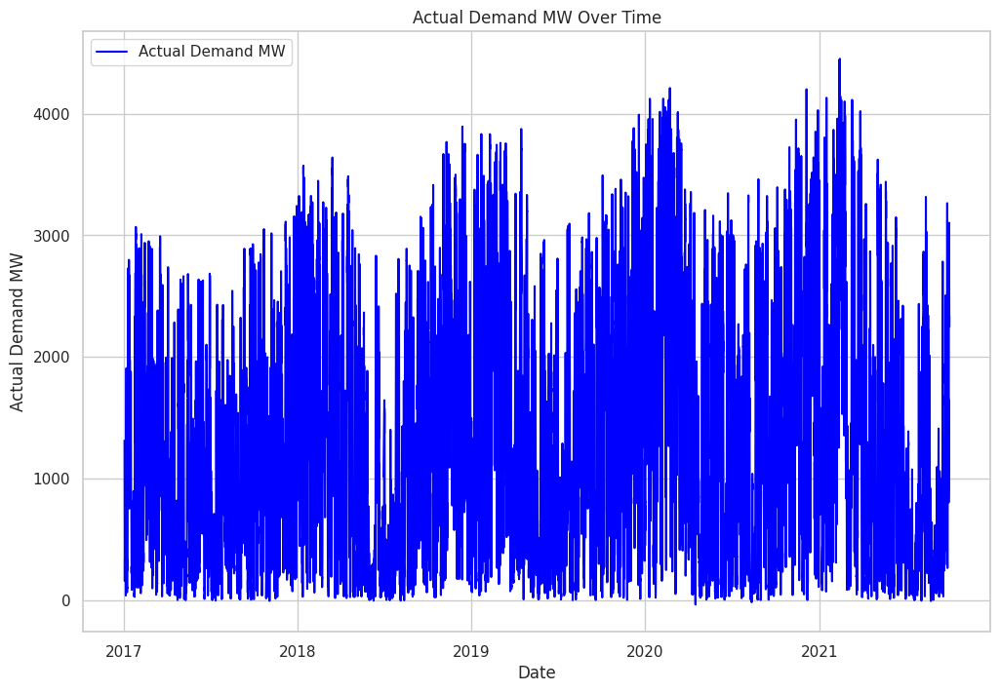

In [107]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the figure size and style for better visualization
plt.figure(figsize=(12, 8))
sns.set(style="whitegrid")

# Plot the ActualDemandMW over time
plt.plot(data_filtered.index, data_filtered['ActualWindMW'], label='Actual Demand MW', color='blue')
plt.title('Actual Demand MW Over Time')
plt.xlabel('Date')
plt.ylabel('Actual Demand MW')
plt.legend()
plt.show()


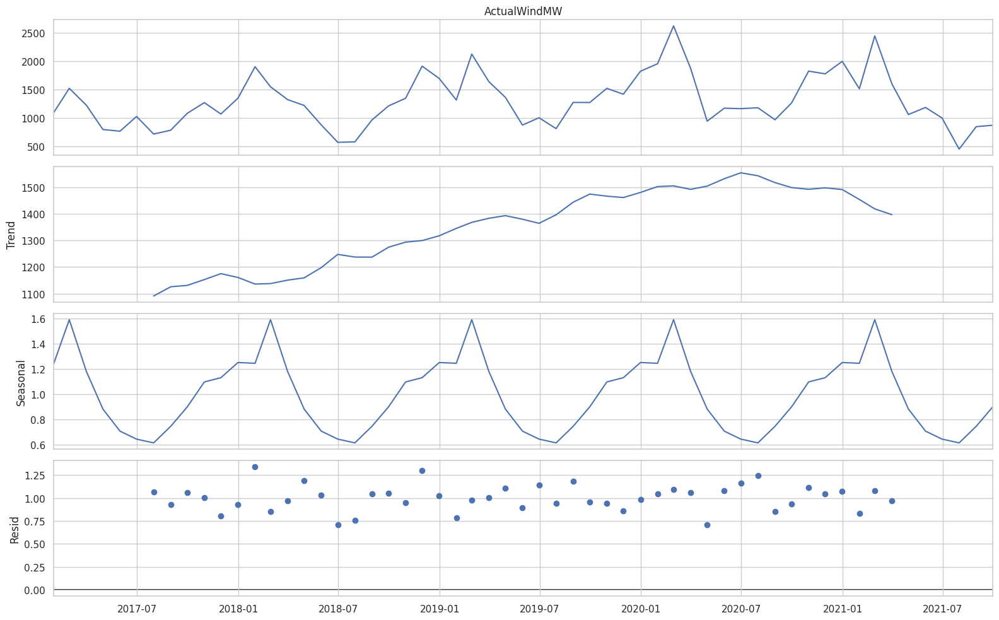

In [108]:
from statsmodels.tsa.seasonal import seasonal_decompose

# Resample the data to a monthly frequency, taking the mean for each month
monthly_data = data_filtered['ActualWindMW'].resample('M').mean()

# Decompose the time series into trend, seasonal, and residual components
decomposition = seasonal_decompose(monthly_data, model='multiplicative')

# Plot the decomposed components
decomposition.plot()
plt.show()


In [109]:
from statsmodels.tsa.arima.model import ARIMA
from pmdarima import auto_arima

# Running auto_arima to find the best ARIMA parameters for the monthly data
auto_arima_model = auto_arima(monthly_data, seasonal=True, m=12, trace=True, error_action='ignore', suppress_warnings=True)

auto_arima_model.summary()


Performing stepwise search to minimize aic
 ARIMA(2,0,2)(1,0,1)[12] intercept   : AIC=836.564, Time=2.08 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=864.012, Time=0.03 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=832.364, Time=0.39 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=839.493, Time=0.23 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=987.614, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=839.379, Time=0.10 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=826.749, Time=1.02 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=829.785, Time=1.08 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=830.417, Time=0.47 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=864.352, Time=0.15 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=828.946, Time=1.09 sec
 ARIMA(1,0,1)(2,0,0)[12] intercept   : AIC=828.669, Time=0.94 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=828.805, Time=1.09 sec
 ARIMA(2,0,1)(2,0,0)[12] intercept   : AIC=inf, Time=1.54 sec
 ARIMA(1,0,0)(2,0,0)[12]             

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                   57
Model:             SARIMAX(1, 0, 0)x(2, 0, 0, 12)   Log Likelihood                -408.374
Date:                            Thu, 14 Mar 2024   AIC                            826.749
Time:                                    11:40:44   BIC                            836.964
Sample:                                01-31-2017   HQIC                           830.719
                                     - 09-30-2021                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept    193.8660    122.186      1.587      0.113     -45.613     433.345
ar.L1          0.4856      0.172      2.816      0.005       0.148       0.823
ar.S.L12       0.2883      0.112      2.563      0.010       0.068       0.509
ar.S.L24       0.4147      0.167      2.490      0.013       0.088       0.741
sigma2      8.483e+04   1.78e+04      4.771      0.000       5e+04     1.2e+05
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):                 2.10
Prob(Q):                              0.92   Prob(JB):                         0.35
Heteroskedasticity (H):               1.38   Skew:                             0.46
Prob(H) (two-sided):                  0.49   Kurtosis:                         3.23
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [111]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Fit the SARIMAX model with the identified optimal parameters
sarimax_model = SARIMAX(monthly_data, order=(1, 0, 0), seasonal_order=(2, 0, 0, 12), enforce_stationarity=False, enforce_invertibility=False)
sarimax_result = sarimax_model.fit()

# Forecast the next 12 months
sarimax_forecast = sarimax_result.get_forecast(steps=12)
forecast_conf_int = sarimax_forecast.conf_int()
forecast_mean = sarimax_forecast.predicted_mean



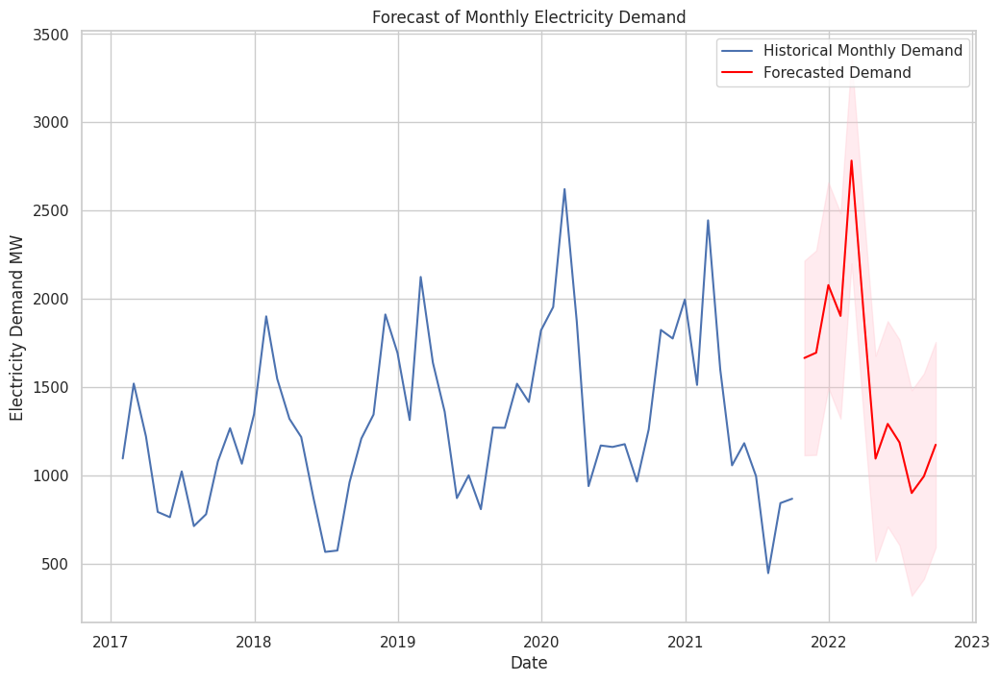

,lower ActualWindMW,upper ActualWindMW,mean
2021-10-31,1115.785192,2217.300817,1666.543004
2021-11-30,1117.912366,2274.928928,1696.420647
2021-12-31,1497.642934,2660.242344,2078.942639
2022-01-31,1322.962180,2486.136831,1904.549505
2022-02-28,2201.816071,3365.050134,2783.433103
2022-03-31,1328.864730,2492.104931,1910.484831
2022-04-30,515.373906,1678.614741,1096.994324
2022-05-31,711.833798,1875.074698,1293.454248
2022-06-30,606.843990,1770.084897,1188.464444
2022-07-31,320.545182,1483.786090,902.165636


In [112]:
# Plot the original data and the forecast
plt.figure(figsize=(12, 8))
plt.plot(monthly_data, label='Historical Monthly Demand')
plt.plot(forecast_mean, label='Forecasted Demand', color='red')
plt.fill_between(forecast_conf_int.index, forecast_conf_int.iloc[:, 0], forecast_conf_int.iloc[:, 1], color='pink', alpha=0.3)
plt.title('Forecast of Monthly Electricity Demand')
plt.xlabel('Date')
plt.ylabel('Electricity Demand MW')
plt.legend()
plt.show()

# Display the forecast summary
forecast_conf_int.join(forecast_mean.rename('mean'))

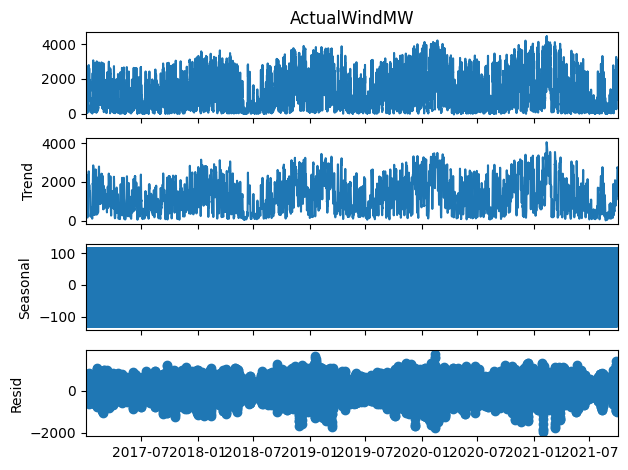

In [8]:
from statsmodels.tsa.seasonal import seasonal_decompose

# Resample the data to a monthly frequency, taking the mean for each month
hourly_data = data_filtered['ActualWindMW'].resample('h').mean()

# Let's try decomposing with an additive model instead
additive_decomposition = seasonal_decompose(hourly_data, model='additive')

# Plot the decomposed components
additive_decomposition.plot()
plt.show()


In [123]:
from statsmodels.tsa.arima.model import ARIMA
from pmdarima import auto_arima

# Running auto_arima to find the best ARIMA parameters
auto_arima_model = auto_arima(hourly_data, seasonal=True, h=24, trace=True, error_action='ignore', suppress_warnings=True)

auto_arima_model.summary()


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=inf, Time=68.05 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=530884.036, Time=1.25 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=517778.862, Time=1.55 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=521329.806, Time=12.17 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=530882.038, Time=0.57 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=517542.391, Time=2.08 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=517544.384, Time=4.31 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=517544.387, Time=4.23 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=517549.705, Time=5.82 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=517546.195, Time=6.37 sec
 ARIMA(2,1,0)(0,0,0)[0]             : AIC=517540.391, Time=0.82 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=517776.863, Time=0.65 sec
 ARIMA(3,1,0)(0,0,0)[0]             : AIC=517542.385, Time=1.37 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=517542.387, Time=1.23 sec
 ARIMA(1,1

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                41591
Model:               SARIMAX(2, 1, 0)   Log Likelihood             -258767.196
Date:                Thu, 14 Mar 2024   AIC                         517540.391
Time:                        12:11:42   BIC                         517566.298
Sample:                    01-02-2017   HQIC                        517548.576
                         - 09-30-2021                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4806      0.003    143.346      0.000       0.474       0.487
ar.L2          0.0756      0.004     21.146      0.000       0.069       0.083
sigma2      1.485e+04     64.470    230.354      0.000    1.47e+04     1.5e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):             16886.00
Prob(Q):                              0.99   Prob(JB):                         0.00
Heteroskedasticity (H):               1.32   Skew:                            -0.01
Prob(H) (two-sided):                  0.00   Kurtosis:                         6.12
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [21]:
# For hourly forecasting, let's first look at the last few days of the dataset to fit the model
recent_data = data['ActualWindMW'].tail(24*7) # Last 7 days of hourly data


In [22]:
# Remove the last 24 hours from the recent_data to use as the validation set
training_data = recent_data[:-24]
validation_data = recent_data[-24:]

# Fit the SARIMAX model to the training data
sarimax_model = SARIMAX(training_data, order=(2, 1, 0), seasonal_order=(1, 0, 1, 24),
                        enforce_stationarity=False, enforce_invertibility=False)
sarimax_result = sarimax_model.fit()

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)


In [23]:
# Forecast the next 24 hours using the trained model
sarimax_forecast = sarimax_result.get_forecast(steps=24)
sarimax_forecast_values = sarimax_forecast.predicted_mean

# Calculate the metrics using the validation data and the forecast
mse = mean_squared_error(validation_data, sarimax_forecast_values)
mae = mean_absolute_error(validation_data, sarimax_forecast_values)
r2 = r2_score(validation_data, sarimax_forecast_values)
mape = np.mean(np.abs((validation_data - sarimax_forecast_values) / validation_data)) * 100

# Compile the metrics into a DataFrame for display
forecast_metrics_df = pd.DataFrame({
    'Metric': ['MSE', 'MAE', 'R2', 'MAPE'],
    'Value': [mse, mae, r2, mape]
})

forecast_metrics_df

,Metric,Value
0,MSE,387439.557131
1,MAE,537.074266
2,R2,-4.311753
3,MAPE,21.354447


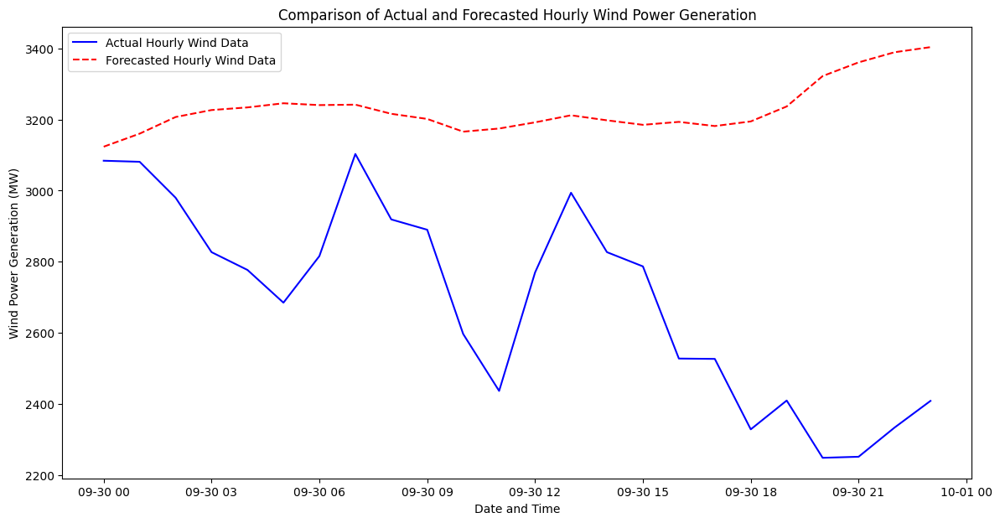

In [24]:
# Re-plotting without the confidence intervals to avoid the TypeError
plt.figure(figsize=(14, 7))
plt.plot(validation_data.index, validation_data, label='Actual Hourly Wind Data', color='blue')
plt.plot(validation_data.index, sarimax_forecast_values, label='Forecasted Hourly Wind Data', color='red', linestyle='--')
plt.title('Comparison of Actual and Forecasted Hourly Wind Power Generation')
plt.xlabel('Date and Time')
plt.ylabel('Wind Power Generation (MW)')
plt.legend()
plt.show()


In [8]:
from statsmodels.tsa.stattools import adfuller

# Perform Augmented Dickey-Fuller test on 'ActualWindMW'
result = adfuller(data_filtered['ActualWindMW'].dropna())

adf_statistic, p_value = result[0], result[1]

adf_statistic, p_value


(-16.905922312258937, 1.0192981062235287e-29)

In [10]:
data_subset = data_filtered['ActualWindMW'].dropna().last('2Y')

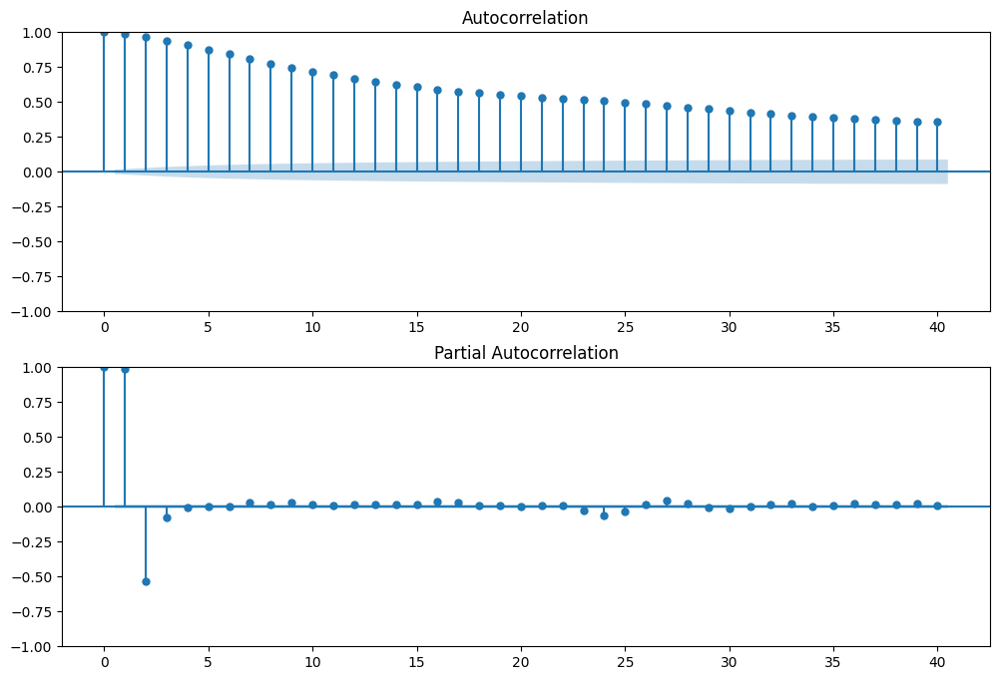

In [11]:
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Plot ACF and PACF
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8))

# Plot the ACF
plot_acf(data_subset, ax=ax1, lags=40)

# Plot the PACF
plot_pacf(data_subset, ax=ax2, lags=40)

plt.show()


ACF Plot (Top): There is a gradual decline in the autocorrelations, and they remain positive for many lags. This suggests a high level of autocorrelation, and since it does not cut off sharply, it indicates a non-seasonal MA component is not very prominent.

PACF Plot (Bottom): There is a sharp drop after the first lag, then a more gradual trailing off. The sharp drop after lag 1 in the PACF plot suggests an AR(1) component may be a good starting point.

Given these observations and the assumption of daily seasonality in the data (since the data is hourly), a first attempt to model this might use an ARIMA model with one non-seasonal autoregressive term and no non-seasonal moving average term, i.e., ARIMA(1,0,0).

For the seasonal part, you could start with a seasonal ARIMA component of (1,0,0,24), where 24 is the seasonal period for the daily seasonality in hourly data. The seasonal MA component can initially be set to zero due to the lack of sharp cut-offs in the ACF plot, which would have suggested a seasonal MA component.

Thus, a SARIMA(1,0,0)(1,0,0,24) model could be an initial model to try. If the seasonality is strong and there's a clear pattern every 24 hours, you might also consider a seasonal MA component. However, it's always good to start with simpler models.

Let's proceed by specifying these parameters in a SARIMA model. Please run the following code in your local environment, as we are currently unable to execute it here:

In [26]:
# Assuming 'data' is your DataFrame and it is indexed by a DatetimeIndex

# Define the split date
split_date = '2021-09-29'  # replace with the date you choose for splitting

# Split the data into train and test sets
train = data_filtered.iloc[:-24]
test = data_filtered.iloc[-24:]

y_test = test['ActualWindMW_target']
y_train = train['ActualWindMW']

# Fit the SARIMA model on the training set
model = SARIMAX(train['ActualWindMW'],
                order=(2, 1, 0),
                seasonal_order=(1, 0, 0, 24),
                enforce_stationarity=False,
                enforce_invertibility=False)
model_fit = model.fit(disp=False)


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)


In [27]:
# Once the model is fit, you can review the summary for diagnostic information
print(model_fit.summary())


                                     SARIMAX Results                                      
Dep. Variable:                       ActualWindMW   No. Observations:                41567
Model:             SARIMAX(1, 0, 0)x(1, 0, 0, 24)   Log Likelihood             -265048.417
Date:                            Thu, 14 Mar 2024   AIC                         530102.834
Time:                                    10:33:47   BIC                         530128.737
Sample:                                01-02-2017   HQIC                        530111.019
                                     - 09-29-2021                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9958      0.000   2696.928      0.000       0.995       0.997
ar.S.L24       0.0489      0.004   

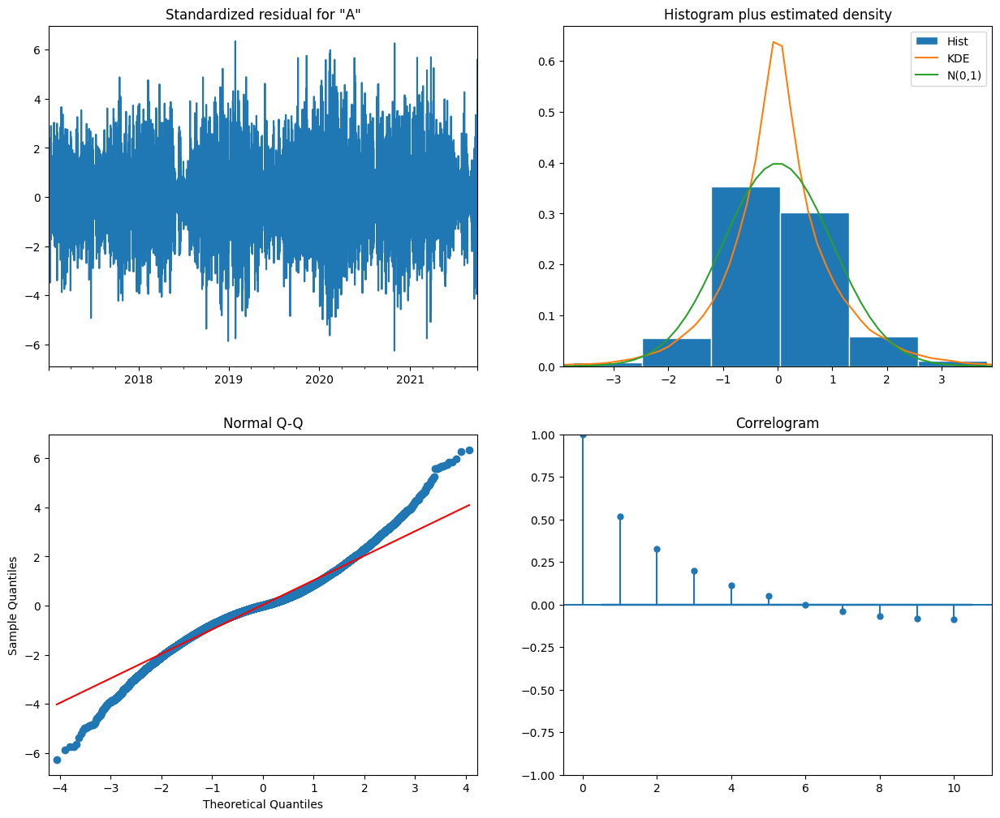

In [28]:
# 2. Model Diagnostics
model_fit.plot_diagnostics(figsize=(15, 12))
plt.show()

# 3. Forecasting and Evaluation
forecast = model_fit.get_forecast(steps=24)  # For example, forecast next 24 hours
forecast_df = forecast.conf_int()
forecast

In [29]:
# Generate forecasts for the length of the test set
forecast = model_fit.get_forecast(steps=len(test))
forecast_df = forecast.conf_int()
forecast_df['forecast'] = forecast.predicted_mean

# Now calculate the accuracy metrics using the test set
mae = mean_absolute_error(test['ActualWindMW'], forecast_df['forecast'])
rmse = mean_squared_error(test['ActualWindMW'], forecast_df['forecast'], squared=False)

print(f'Mean Absolute Error: {mae}')
print(f'Root Mean Squared Error: {rmse}')

Mean Absolute Error: 191.68171790663484
Root Mean Squared Error: 227.90828430778268


In [31]:

# Importing necessary libraries for calculation and plotting
import numpy as np
from sklearn.metrics import r2_score, mean_squared_error, explained_variance_score
import matplotlib.pyplot as plt
forecast_simple = model_fit.forecast(steps=24)
y_pred = forecast_simple[:24]


y_test_aligned = y_test[:24]

# Calculate Evaluation Metrics
r2 = r2_score(y_test_aligned, y_pred)
rmse = mean_squared_error(y_test_aligned, y_pred, squared=False)
cv = np.std(y_test_aligned) / np.mean(y_test_aligned)
evs = explained_variance_score(y_test_aligned, y_pred)
mape = np.mean(np.abs((y_test_aligned - y_pred) / y_test_aligned)) * 100

print(f'R-squared: {r2}')
print(f'Root Mean Squared Error: {rmse}')
print(f'Coefficient of Variation: {cv}')
print(f'Explained Variance Score: {evs}')
print(f'Mean Absolute Percentage Error (MAPE): {mape}%')


R-squared: 0.27112291115477605
Root Mean Squared Error: 230.57392600539688
Coefficient of Variation: 0.10031851672193405
Explained Variance Score: 0.3542479297426385
Mean Absolute Percentage Error (MAPE): 7.683853711842552%


In [35]:
# Convert y_pred to a pandas Series (if it's not already) and ensure the datetime index matches your test set
y_pred = pd.Series(y_pred, index=pd.to_datetime(y_pred.index))


In [36]:
y_pred

2021-09-29 23:00:00    2907.215225
2021-09-30 00:00:00    2895.051813
2021-09-30 01:00:00    2878.295285
2021-09-30 02:00:00    2874.539510
2021-09-30 03:00:00    2863.795452
2021-09-30 04:00:00    2850.363680
2021-09-30 05:00:00    2841.281618
2021-09-30 06:00:00    2825.455018
2021-09-30 07:00:00    2813.293505
2021-09-30 08:00:00    2789.402056
2021-09-30 09:00:00    2770.983569
2021-09-30 10:00:00    2742.789640
2021-09-30 11:00:00    2735.463089
2021-09-30 12:00:00    2731.898361
2021-09-30 13:00:00    2729.651635
2021-09-30 14:00:00    2711.715102
2021-09-30 15:00:00    2694.167600
2021-09-30 16:00:00    2686.734546
2021-09-30 17:00:00    2670.795345
2021-09-30 18:00:00    2666.240886
2021-09-30 19:00:00    2674.928125
2021-09-30 20:00:00    2703.454651
2021-09-30 21:00:00    2710.425312
2021-09-30 22:00:00    2712.847527
Freq: H, Name: predicted_mean, dtype: float64

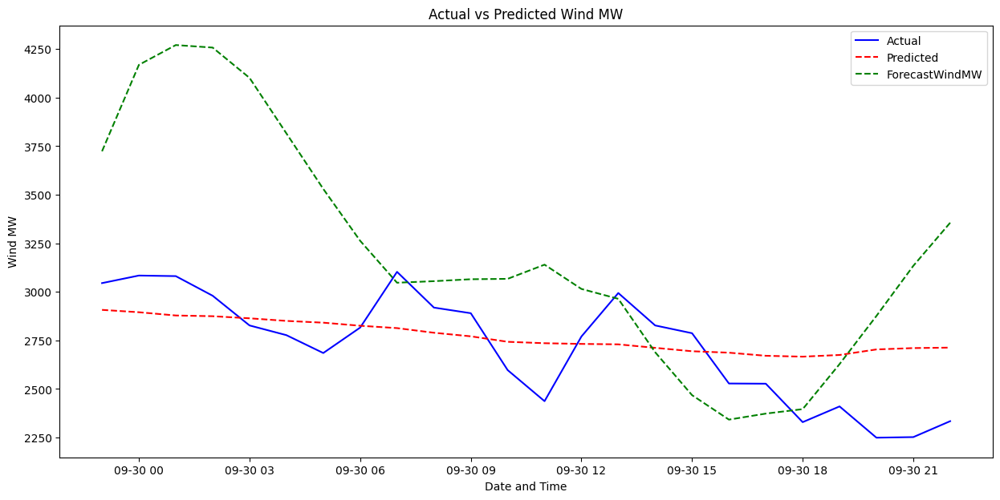

In [40]:
# test['ActualWindMW'] = ...
# Ensure forecast_wind_df is prepared correctly for the last 72 hours as well
forecast_wind_df = pd.DataFrame(data['ForecastWndMW'].iloc[-24:].values, index=predictions_index, columns=['ForecastWindMW'])

# Plotting

plt.figure(figsize=(15, 7))
plt.plot(test.index, test['ActualWindMW'], label='Actual', color='blue')
plt.plot(y_pred.index, y_pred, label='Predicted', color='red', linestyle='--')
plt.plot(forecast_wind_df.index, forecast_wind_df['ForecastWindMW'], 'g--', label='ForecastWindMW')
plt.title('Actual vs Predicted Wind MW')
plt.xlabel('Date and Time')
plt.ylabel('Wind MW')
plt.legend()
plt.show()

the results of the Augmented Dickey-Fuller test. The test statistic is -16.905922312258937, and the p-value is extremely small (1.0192981062235287e-29), indicating strong evidence against the null hypothesis. This means we can reject the null hypothesis in favor of the alternative, suggesting that your time series is stationary.

With stationarity confirmed, we can proceed to the next steps without needing to difference the data for stationarity purposes. However, differencing might still be required for other reasons, such as removing trends or seasonal patterns when modeling.

72 HOUR

In [47]:
# Assuming 'data' is your DataFrame and it is indexed by a DatetimeIndex

# Define the split date
split_date = '2021-09-29'  # replace with the date you choose for splitting

# Split the data into train and test sets
train = data_filtered.iloc[:-72]
test = data_filtered.iloc[-72:]

y_test = test['ActualWindMW_target']
y_train = train['ActualWindMW']

# Fit the SARIMA model on the training set
model = SARIMAX(train['ActualWindMW'],
                order=(1, 0, 0),
                seasonal_order=(1, 0, 0, 24),
                enforce_stationarity=False,
                enforce_invertibility=False)
model_fit = model.fit(disp=False)

/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)


In [48]:
# Generate forecasts for the length of the test set
forecast = model_fit.get_forecast(steps=len(test))
forecast_df = forecast.conf_int()
forecast_df['forecast'] = forecast.predicted_mean

# Now calculate the accuracy metrics using the test set
mae = mean_absolute_error(test['ActualWindMW'], forecast_df['forecast'])
rmse = mean_squared_error(test['ActualWindMW'], forecast_df['forecast'], squared=False)

print(f'Mean Absolute Error: {mae}')
print(f'Root Mean Squared Error: {rmse}')
# Importing necessary libraries for calculation and plotting
import numpy as np
from sklearn.metrics import r2_score, mean_squared_error, explained_variance_score
import matplotlib.pyplot as plt
forecast_simple = model_fit.forecast(steps=72)
y_pred = forecast_simple[:72]


y_test_aligned = y_test[:72]

# Calculate Evaluation Metrics
r2 = r2_score(y_test_aligned, y_pred)
rmse = mean_squared_error(y_test_aligned, y_pred, squared=False)
cv = np.std(y_test_aligned) / np.mean(y_test_aligned)
evs = explained_variance_score(y_test_aligned, y_pred)
mape = np.mean(np.abs((y_test_aligned - y_pred) / y_test_aligned)) * 100

print(f'R-squared: {r2}')
print(f'Root Mean Squared Error: {rmse}')
print(f'Coefficient of Variation: {cv}')
print(f'Explained Variance Score: {evs}')
print(f'Mean Absolute Percentage Error (MAPE): {mape}%')

Mean Absolute Error: 829.4745852351897
Root Mean Squared Error: 867.4072232993731
R-squared: -0.44019427628858954
Root Mean Squared Error: 869.8888400878801
Coefficient of Variation: 0.3910139875006043
Explained Variance Score: -0.36671012208104203
Mean Absolute Percentage Error (MAPE): 54.98604702090947%


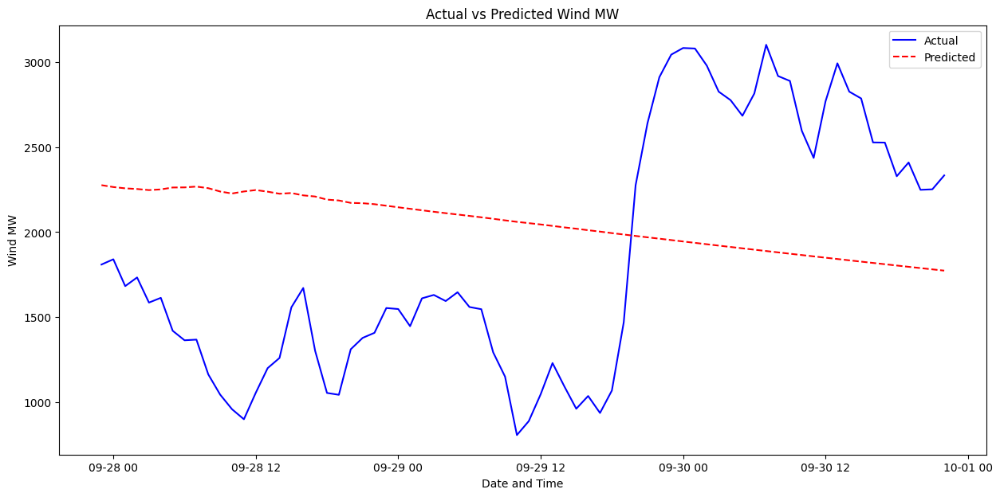

In [51]:
# Convert y_pred to a pandas Series (if it's not already) and ensure the datetime index matches your test set
y_pred = pd.Series(y_pred, index=pd.to_datetime(y_pred.index))

# Ensure forecast_wind_df is prepared correctly for the last 72 hours as well
#forecast_wind_df = pd.DataFrame(data['ForecastWndMW'].iloc[-72:].values, index=predictions_index, columns=['ForecastWindMW'])

# Plotting

plt.figure(figsize=(15, 7))
plt.plot(test.index, test['ActualWindMW'], label='Actual', color='blue')
plt.plot(y_pred.index, y_pred, label='Predicted', color='red', linestyle='--')
plt.title('Actual vs Predicted Wind MW')
plt.xlabel('Date and Time')
plt.ylabel('Wind MW')
plt.legend()
plt.show()

### Linear regression (LR)



Setting up for lr

In [39]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
import seaborn as sns

# GitHub URL to your CSV file
github_url = 'https://raw.githubusercontent.com/KaylumCassidy/FYP/main/IslandElectricity2017_2021v5.csv'

# Read the CSV file into a Pandas DataFrame
data = pd.read_csv(github_url)
data['date'] = pd.to_datetime(data['date'])

# Display the first few rows of the DataFrame to understand its structure
print(data.head())

   Unnamed: 0.2  Unnamed: 0.1                date  Unnamed: 0  Year Month  \
0             0             0 2017-01-01 00:00:00           0  2017   Jan   
1             1             1 2017-01-01 01:00:00           4  2017   Jan   
2             2             2 2017-01-01 02:00:00           8  2017   Jan   
3             3             3 2017-01-01 03:00:00          12  2017   Jan   
4             4             4 2017-01-01 04:00:00          16  2017   Jan   

     DayTime      REGION  ActualDemandMW   FORECAST DEMAND(MW)  ...  rhum_DON  \
0  01, 00:00  All Island            3696                   NaN  ...        70   
1  01, 01:00  All Island            3457                   NaN  ...        80   
2  01, 02:00  All Island            3244                   NaN  ...        69   
3  01, 03:00  All Island            3005                   NaN  ...        70   
4  01, 04:00  All Island            2847                   NaN  ...        71   

   msl_DON  wdsp_DON  wddir_DON  TotalWindCapacity

In [40]:
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import joblib
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import LabelEncoder
data['season'] = (data['date'].dt.month % 12 + 3) // 3  # Divide months into seasons (1: Winter, 2: Spring, 3: Summer, 4: Fall)

# Simplify the dataset to include only necessary features
# Converting 'date' to datetime format and setting it as index
data['date'] = pd.to_datetime(data['date'])
data.set_index('date', inplace=True)

# Including specified features plus creating additional necessary features for modeling
selected_columns = [
    'Year', 'Month', 'DayTime', 'hour', 'isweekday', 'season',
    'average_temp', 'average_wind_speed', 'average_wind_dir', 'average_rain',
    'ActualWindMW'  # Target variable
]
# Filter the dataset to include only the selected columns
data_filtered = data[selected_columns]

# Generate lag features for ActualWindMW for 24 hours
for lag in range(1, 25):
    data_filtered[f'ActualWindMW_lag{lag}'] = data_filtered['ActualWindMW'].shift(lag)

# Adding rolling averages and differences for 'ActualWindMW'
data_filtered['rolling_avg_wind'] = data_filtered['ActualWindMW'].rolling(window=3).mean().shift(1)
data_filtered['diff_wind_power'] = data_filtered['ActualWindMW'].diff().shift(1)


data_filtered['rolling_avg_wind_SPEED'] = data_filtered['average_wind_speed'].rolling(window=3).mean().shift(1)
data_filtered['diff_wind_SPEED'] = data_filtered['average_wind_speed'].diff().shift(1)

data_filtered['rolling_avg_wind_dir'] = data_filtered['average_wind_dir'].rolling(window=3).mean().shift(1)
data_filtered['diff_wind_dir'] = data_filtered['average_wind_dir'].diff().shift(1)
# Dropping rows with NaN values created by lagging
# Shift the target variable by one hour into the future
data_filtered['ActualWindMW_target'] = data_filtered['ActualWindMW'].shift(-1)

data_filtered.dropna(inplace=True)

data_filtered.head()




<ipython-input-40-f0f557f97246>:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filtered[f'ActualWindMW_lag{lag}'] = data_filtered['ActualWindMW'].shift(lag)
<ipython-input-40-f0f557f97246>:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filtered[f'ActualWindMW_lag{lag}'] = data_filtered['ActualWindMW'].shift(lag)
<ipython-input-40-f0f557f97246>:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

,Year,Month,DayTime,hour,isweekday,season,average_temp,average_wind_speed,average_wind_dir,average_rain,...,ActualWindMW_lag22,ActualWindMW_lag23,ActualWindMW_lag24,rolling_avg_wind,diff_wind_power,rolling_avg_wind_SPEED,diff_wind_SPEED,rolling_avg_wind_dir,diff_wind_dir,ActualWindMW_target
date,,,,,,,,,,,,,,,,,,,,,
2017-01-02 00:00:00,2017,Jan,"02, 00:00",0,True,1,6.666667,6.666667,125.000000,0.000000,...,1528.0,1123.0,1214.0,1622.000000,-128.0,14.277778,-1.666667,81.111111,-55.000000,1269.0
2017-01-02 01:00:00,2017,Jan,"02, 01:00",1,True,1,6.500000,6.500000,140.000000,0.000000,...,1612.0,1528.0,1123.0,1467.666667,-168.0,11.555556,-6.500000,77.777778,98.333333,1053.0
2017-01-02 02:00:00,2017,Jan,"02, 02:00",2,True,1,7.000000,7.000000,141.666667,0.016667,...,1473.0,1612.0,1528.0,1354.333333,-44.0,8.777778,-0.166667,97.222222,15.000000,1071.0
2017-01-02 03:00:00,2017,Jan,"02, 03:00",3,True,1,6.500000,6.500000,146.666667,0.000000,...,1678.0,1473.0,1612.0,1211.666667,-216.0,6.722222,0.500000,135.555556,1.666667,904.0
2017-01-02 04:00:00,2017,Jan,"02, 04:00",4,True,1,7.333333,7.333333,141.666667,0.000000,...,1710.0,1678.0,1473.0,1131.000000,18.0,6.666667,-0.500000,142.777778,5.000000,818.0


In [41]:

# Encoding categorical variables
le = LabelEncoder()
data_filtered['Month'] = le.fit_transform(data_filtered['Month'])

# Splitting the dataset into training and testing sets
# We reserve the last 24 observations for testing to simulate forecasting the next 24 hours It's good practice to reserve the last 24 observations for testing
training_data = data_filtered.iloc[:-24]
testing_data = data_filtered.iloc[-24:]

# Exclude target variable and non-numeric 'DayTime'
X_train = training_data.drop(['ActualWindMW', 'ActualWindMW_target', 'DayTime'], axis=1)
y_train = training_data['ActualWindMW_target']

X_test = testing_data.drop(['ActualWindMW', 'ActualWindMW_target', 'DayTime'], axis=1)
y_test = testing_data['ActualWindMW_target']


<ipython-input-41-f76c775b406b>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filtered['Month'] = le.fit_transform(data_filtered['Month'])


In [42]:

# Step 5: Model Selection
from sklearn.linear_model import LinearRegression
# Step 6: Model Training
model = LinearRegression()
model.fit(X_train , y_train)

# Step 7: Model Evaluation
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

Mean Squared Error: 70744.24877149392


In [44]:

from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

# ... (Previous code remains unchanged)

# Step 7: Model Evaluation
y_pred = model.predict(X_test)

# Calculate R-squared
r2 = r2_score(y_test, y_pred)
print(f'R-squared: {r2}')

# Calculate RMSE
rmse = mean_squared_error(y_test, y_pred, squared=False)
print(f'Root Mean Squared Error: {rmse}')

cv = np.std(y_test) / np.mean(y_test)
print(f'Coefficient of Variation: {cv}')

from sklearn.metrics import explained_variance_score
evs = explained_variance_score(y_test, y_pred)
print(f'Explained Variance Score: {evs}')



R-squared: 0.030104265308506406
Root Mean Squared Error: 265.9779103074049
Coefficient of Variation: 0.10031851672193405
Explained Variance Score: 0.04134821138652356


In [53]:

import numpy as np

# Assuming y_true and y_pred are your arrays of actual and predicted values
y_true = np.array(y_test)    # Your actual values
y_pred = predictions.flatten()  # Your predictions

# Calculate MAPE
mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100

print(f"MAPE: {mape}%")


MAPE: 5.27287483165626%


In [45]:
!pip install joblib
import joblib

# ... (previous code)

# Save the model to a file
model_filename = 'linear_regression_model.joblib'
joblib.dump(model, model_filename)

print(f'Model saved as {model_filename}')

Model saved as linear_regression_model.joblib


In [54]:
import pandas as pd
import matplotlib.pyplot as plt

# Your existing code to generate 'predictions'

# Align predictions with the hour they are predicting, not the hour of data used
# The index for predictions should be one hour ahead of the actuals
predictions_index = data_filtered.index[-24:] + pd.Timedelta(hours=-1)  # This gives you the index for predictions

# Create a DataFrame for predictions with the correct future index

# Create a DataFrame for predictions with the correct future index
predictions_df = pd.DataFrame(y_pred, index=predictions_index, columns=['Predicted'])

# Create a DataFrame for actuals
actuals_df = pd.DataFrame(data_filtered['ActualWindMW'].iloc[-24:].values, index=data_filtered.index[-24:], columns=['Actual'])

# Combine the two DataFrames
combined_df = pd.concat([predictions_df, actuals_df], axis=1)
combined_df



,Predicted,Actual
date,,
2021-09-29 22:00:00,3186.200928,NaN
2021-09-29 23:00:00,3171.192383,3045.0
2021-09-30 00:00:00,3095.307129,3084.0
2021-09-30 01:00:00,2915.282227,3081.0
2021-09-30 02:00:00,2736.279053,2980.0
2021-09-30 03:00:00,2740.299316,2827.0
2021-09-30 04:00:00,2652.532715,2777.0
2021-09-30 05:00:00,2855.533203,2685.0
2021-09-30 06:00:00,3230.521484,2816.0


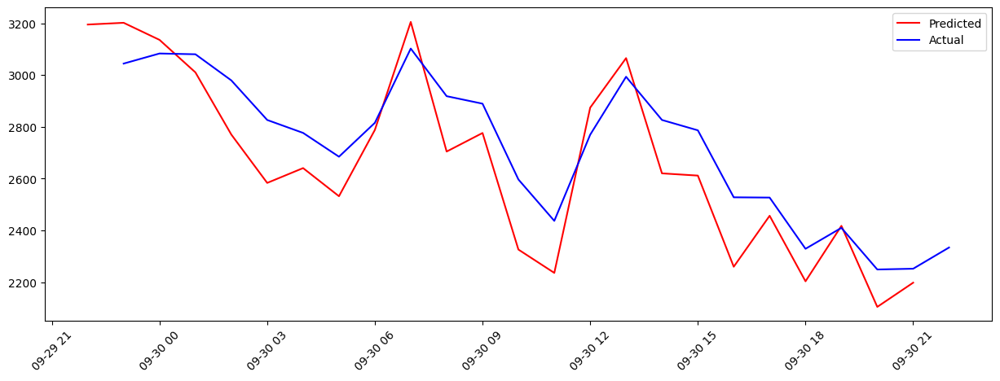

In [52]:

# Now, plot the data
plt.figure(figsize=(15, 5))
plt.plot(combined_df.index, combined_df['Predicted'], 'r-', label='Predicted')
plt.plot(combined_df.index, combined_df['Actual'], 'b-', label='Actual')
plt.legend()
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()

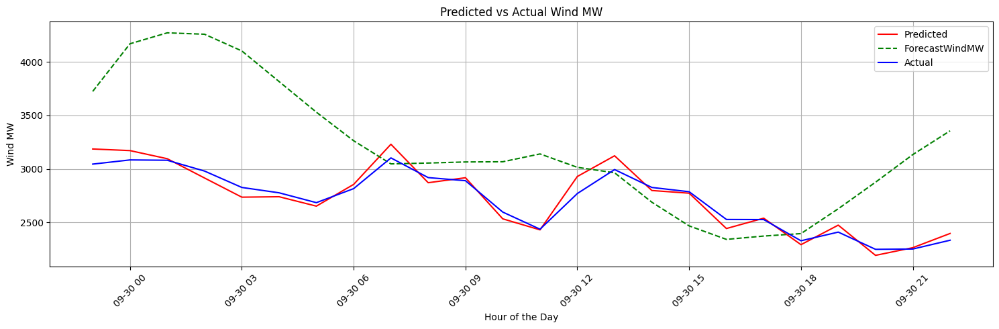

In [67]:


import pandas as pd
import matplotlib.pyplot as plt


# Align predictions with the hour they are predicting, not the hour of data used
# The index for predictions should be one hour ahead of the actuals
predictions_index = data_filtered.index[-24:]  # This assumes predictions are for the next hour

# Create a DataFrame for predictions with the correct future index
predictions_df = pd.DataFrame(y_pred, index=predictions_index, columns=['Predicted'])

# Create a DataFrame for actuals
actuals_df = pd.DataFrame(data_filtered['ActualWindMW'].iloc[-24:].values, index=data_filtered.index[-24:], columns=['Actual'])
# Create a DataFrame for the forecasted wind MW from another model or source
forecast_wind_df = pd.DataFrame(data['ForecastWndMW'].iloc[-24:].values, index=data_filtered.index[-24:], columns=['ForecastWindMW'])

# Combine all three DataFrames: predictions, actuals, and forecast wind
combined_df = pd.concat([predictions_df, actuals_df, forecast_wind_df], axis=1)

# Assuming combined_df is correctly aligned
combined_df['Hour'] = combined_df.index.hour

# Now plot the data
plt.figure(figsize=(15, 5))
plt.plot(combined_df.index, combined_df['Predicted'], 'r-', label='Predicted')
plt.plot(combined_df.index, combined_df['ForecastWindMW'], 'g--', label='ForecastWindMW')
plt.plot(combined_df.index, combined_df['Actual'], 'b-', label='Actual')  # Make sure this is correct

plt.legend()
plt.xlabel('Hour of the Day')
plt.ylabel('Wind MW')
plt.title('Predicted vs Actual Wind MW')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()


Shifting the target variable by one hour into the future is a common technique in time series forecasting when you want to predict the value of the next time step. Here’s how it works and why it’s done:

Time Series Forecasting Context: In time series forecasting, you typically have a sequence of time-ordered values, and you want to predict future values. For example, if you’re predicting wind power generation, you have historical wind power measurements at different times, and you use this historical data to forecast the wind power for future time periods.

72 hour

In [13]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
import seaborn as sns

# GitHub URL to your CSV file
github_url = 'https://raw.githubusercontent.com/KaylumCassidy/FYP/main/IslandElectricity2017_2021v5.csv'

# Read the CSV file into a Pandas DataFrame
data = pd.read_csv(github_url)
data['date'] = pd.to_datetime(data['date'])

# Display the first few rows of the DataFrame to understand its structure
print(data.head())

   Unnamed: 0.2  Unnamed: 0.1                date  Unnamed: 0  Year Month  \
0             0             0 2017-01-01 00:00:00           0  2017   Jan   
1             1             1 2017-01-01 01:00:00           4  2017   Jan   
2             2             2 2017-01-01 02:00:00           8  2017   Jan   
3             3             3 2017-01-01 03:00:00          12  2017   Jan   
4             4             4 2017-01-01 04:00:00          16  2017   Jan   

     DayTime      REGION  ActualDemandMW   FORECAST DEMAND(MW)  ...  rhum_DON  \
0  01, 00:00  All Island            3696                   NaN  ...        70   
1  01, 01:00  All Island            3457                   NaN  ...        80   
2  01, 02:00  All Island            3244                   NaN  ...        69   
3  01, 03:00  All Island            3005                   NaN  ...        70   
4  01, 04:00  All Island            2847                   NaN  ...        71   

   msl_DON  wdsp_DON  wddir_DON  TotalWindCapacity

In [2]:
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import joblib
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import LabelEncoder
data['season'] = (data['date'].dt.month % 12 + 3) // 3  # Divide months into seasons (1: Winter, 2: Spring, 3: Summer, 4: Fall)

# Simplify the dataset to include only necessary features
# Converting 'date' to datetime format and setting it as index
data['date'] = pd.to_datetime(data['date'])
data.set_index('date', inplace=True)

# Including specified features plus creating additional necessary features for modeling
selected_columns = [
    'Year', 'Month', 'DayTime', 'hour', 'isweekday', 'season',
    'average_temp', 'average_wind_speed', 'average_wind_dir', 'average_rain',
    'ActualWindMW'  # Target variable
]
# Filter the dataset to include only the selected columns
data_filtered = data[selected_columns]

# Generate lag features for ActualWindMW for 24 hours
for lag in range(1, 25):
    data_filtered[f'ActualWindMW_lag{lag}'] = data_filtered['ActualWindMW'].shift(lag)

data_filtered['wind_power_lag48'] = data_filtered['ActualWindMW'].shift(48)
data_filtered['wind_power_lag72'] = data_filtered['ActualWindMW'].shift(72)
# Adding rolling averages and differences for 'ActualWindMW'
data_filtered['rolling_avg_wind'] = data_filtered['ActualWindMW'].rolling(window=3).mean().shift(1)
data_filtered['diff_wind_power'] = data_filtered['ActualWindMW'].diff().shift(1)


data_filtered['rolling_avg_wind_SPEED'] = data_filtered['average_wind_speed'].rolling(window=3).mean().shift(1)
data_filtered['diff_wind_SPEED'] = data_filtered['average_wind_speed'].diff().shift(1)

data_filtered['rolling_avg_wind_dir'] = data_filtered['average_wind_dir'].rolling(window=3).mean().shift(1)
data_filtered['diff_wind_dir'] = data_filtered['average_wind_dir'].diff().shift(1)
# Dropping rows with NaN values created by lagging
# Shift the target variable by one hour into the future
data_filtered['ActualWindMW_target'] = data_filtered['ActualWindMW'].shift(-1)

data_filtered.dropna(inplace=True)

data_filtered.head()


<ipython-input-2-bfbf16b180da>:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filtered[f'ActualWindMW_lag{lag}'] = data_filtered['ActualWindMW'].shift(lag)
<ipython-input-2-bfbf16b180da>:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filtered[f'ActualWindMW_lag{lag}'] = data_filtered['ActualWindMW'].shift(lag)
<ipython-input-2-bfbf16b180da>:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead



,Year,Month,DayTime,hour,isweekday,season,average_temp,average_wind_speed,average_wind_dir,average_rain,...,ActualWindMW_lag24,wind_power_lag48,wind_power_lag72,rolling_avg_wind,diff_wind_power,rolling_avg_wind_SPEED,diff_wind_SPEED,rolling_avg_wind_dir,diff_wind_dir,ActualWindMW_target
date,,,,,,,,,,,,,,,,,,,,,
2017-01-04 00:00:00,2017,Jan,"04, 00:00",0,True,1,3.666667,3.666667,191.666667,0.066667,...,262.0,1313.0,1214.0,634.000000,13.0,14.833333,1.500000,235.000000,10.000000,660.0
2017-01-04 01:00:00,2017,Jan,"04, 01:00",1,True,1,2.833333,2.833333,216.666667,0.000000,...,259.0,1269.0,1123.0,623.666667,-6.0,11.277778,-12.166667,222.777778,-51.666667,628.0
2017-01-04 02:00:00,2017,Jan,"04, 02:00",2,True,1,4.333333,4.333333,265.000000,0.000000,...,364.0,1053.0,1528.0,638.000000,36.0,7.444444,-0.833333,217.222222,25.000000,608.0
2017-01-04 03:00:00,2017,Jan,"04, 03:00",3,True,1,4.833333,4.833333,273.333333,0.033333,...,364.0,1071.0,1612.0,637.333333,-32.0,3.611111,1.500000,224.444444,48.333333,520.0
2017-01-04 04:00:00,2017,Jan,"04, 04:00",4,True,1,5.666667,5.666667,263.333333,0.000000,...,466.0,904.0,1473.0,632.000000,-20.0,4.000000,0.500000,251.666667,8.333333,449.0


In [3]:
# Encoding categorical variables
le = LabelEncoder()
data_filtered['Month'] = le.fit_transform(data_filtered['Month'])

# Splitting the dataset into training and testing sets
# We reserve the last 24 observations for testing to simulate forecasting the next 24 hours It's good practice to reserve the last 24 observations for testing
training_data = data_filtered.iloc[:-72]
testing_data = data_filtered.iloc[-72:]

# Exclude target variable and non-numeric 'DayTime'
X_train = training_data.drop(['ActualWindMW', 'ActualWindMW_target', 'DayTime'], axis=1)
y_train = training_data['ActualWindMW_target']

X_test = testing_data.drop(['ActualWindMW', 'ActualWindMW_target', 'DayTime'], axis=1)
y_test = testing_data['ActualWindMW_target']
# Step 5: Model Selection
from sklearn.linear_model import LinearRegression
# Step 6: Model Training
model = LinearRegression()
model.fit(X_train , y_train)

# Step 7: Model Evaluation
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

# ... (Previous code remains unchanged)



Mean Squared Error: 92190.03267682536


<ipython-input-3-ee72fb6602ab>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filtered['Month'] = le.fit_transform(data_filtered['Month'])


In [10]:

import numpy as np
# Step 7: Model Evaluation
y_pred = model.predict(X_test)

# Calculate R-squared
r2 = r2_score(y_test, y_pred)
print(f'R-squared: {r2}')

# Calculate RMSE
rmse = mean_squared_error(y_test, y_pred, squared=False)
print(f'Root Mean Squared Error: {rmse}')

cv = np.std(y_test) / np.mean(y_test)
print(f'Coefficient of Variation: {cv}')

from sklearn.metrics import explained_variance_score
evs = explained_variance_score(y_test, y_pred)
print(f'Explained Variance Score: {evs}')

R-squared: 0.8245402400011066
Root Mean Squared Error: 303.62811575482493
Coefficient of Variation: 0.3910139875006043
Explained Variance Score: 0.8258781018084516


In [12]:

import numpy as np

# Ensure y_test and y_pred are correctly aligned and both are numpy arrays or similar structures that support element-wise operations
# Calculate the MAPE
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

print(f'Mean Absolute Percentage Error (MAPE): {mape}%')



Mean Absolute Percentage Error (MAPE): 13.698039705351627%


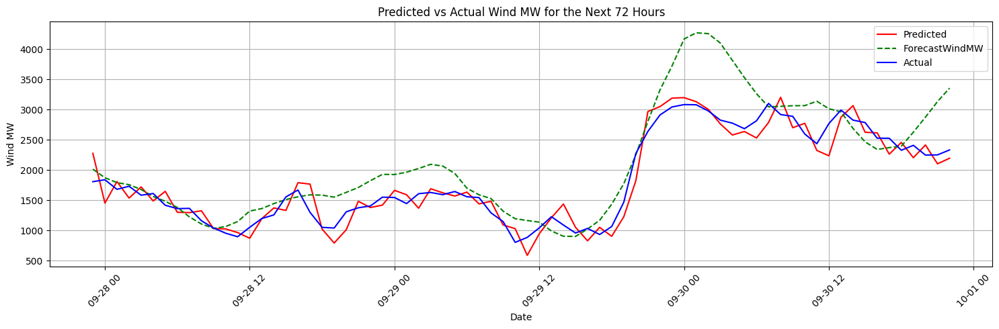

In [11]:

# The index for predictions should match the last 72 observations
predictions_index = data_filtered.index[-72:]  # Ensure this index is correct

# Create a DataFrame for predictions with the correct future index
predictions_df = pd.DataFrame(y_pred, index=predictions_index, columns=['Predicted'])

# Ensure actuals_df aligns with these 72 predictions
actuals_df = pd.DataFrame(data_filtered['ActualWindMW'].iloc[-72:].values, index=predictions_index, columns=['Actual'])

# Ensure forecast_wind_df is prepared correctly for the last 72 hours as well
forecast_wind_df = pd.DataFrame(data['ForecastWndMW'].iloc[-72:].values, index=predictions_index, columns=['ForecastWindMW'])

# Combine all three DataFrames
combined_df = pd.concat([predictions_df, actuals_df, forecast_wind_df], axis=1)

# Plotting
plt.figure(figsize=(15, 5))
plt.plot(combined_df.index, combined_df['Predicted'], 'r-', label='Predicted')
plt.plot(combined_df.index, combined_df['ForecastWindMW'], 'g--', label='ForecastWindMW')
plt.plot(combined_df.index, combined_df['Actual'], 'b-', label='Actual')

plt.legend()
plt.xlabel('Date')
plt.ylabel('Wind MW')
plt.title('Predicted vs Actual Wind MW for the Next 72 Hours')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()



1 month

In [14]:
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import joblib
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import LabelEncoder
data['season'] = (data['date'].dt.month % 12 + 3) // 3  # Divide months into seasons (1: Winter, 2: Spring, 3: Summer, 4: Fall)

# Simplify the dataset to include only necessary features
# Converting 'date' to datetime format and setting it as index
data['date'] = pd.to_datetime(data['date'])
data.set_index('date', inplace=True)

# Including specified features plus creating additional necessary features for modeling
selected_columns = [
    'Year', 'Month', 'DayTime', 'hour', 'isweekday', 'season',
    'average_temp', 'average_wind_speed', 'average_wind_dir', 'average_rain',
    'ActualWindMW'  # Target variable
]
# Filter the dataset to include only the selected columns
data_filtered = data[selected_columns]

# Generate lag features for ActualWindMW for 24 hours
for lag in range(1, 25):
    data_filtered[f'ActualWindMW_lag{lag}'] = data_filtered['ActualWindMW'].shift(lag)

data_filtered['wind_power_lag48'] = data_filtered['ActualWindMW'].shift(48)
data_filtered['wind_power_lag72'] = data_filtered['ActualWindMW'].shift(72)
data_filtered['wind_power_lag48'] = data_filtered['ActualWindMW'].shift(124)
data_filtered['wind_power_lag72'] = data_filtered['ActualWindMW'].shift(250)
# Adding rolling averages and differences for 'ActualWindMW'
data_filtered['rolling_avg_wind'] = data_filtered['ActualWindMW'].rolling(window=3).mean().shift(1)
data_filtered['diff_wind_power'] = data_filtered['ActualWindMW'].diff().shift(1)


data_filtered['rolling_avg_wind_SPEED'] = data_filtered['average_wind_speed'].rolling(window=3).mean().shift(1)
data_filtered['diff_wind_SPEED'] = data_filtered['average_wind_speed'].diff().shift(1)

data_filtered['rolling_avg_wind_dir'] = data_filtered['average_wind_dir'].rolling(window=3).mean().shift(1)
data_filtered['diff_wind_dir'] = data_filtered['average_wind_dir'].diff().shift(1)
# Dropping rows with NaN values created by lagging
# Shift the target variable by one hour into the future
data_filtered['ActualWindMW_target'] = data_filtered['ActualWindMW'].shift(-1)

data_filtered.dropna(inplace=True)

data_filtered.head()


<ipython-input-14-2bac7c63762e>:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filtered[f'ActualWindMW_lag{lag}'] = data_filtered['ActualWindMW'].shift(lag)
<ipython-input-14-2bac7c63762e>:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filtered[f'ActualWindMW_lag{lag}'] = data_filtered['ActualWindMW'].shift(lag)
<ipython-input-14-2bac7c63762e>:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instea

,Year,Month,DayTime,hour,isweekday,season,average_temp,average_wind_speed,average_wind_dir,average_rain,...,ActualWindMW_lag24,wind_power_lag48,wind_power_lag72,rolling_avg_wind,diff_wind_power,rolling_avg_wind_SPEED,diff_wind_SPEED,rolling_avg_wind_dir,diff_wind_dir,ActualWindMW_target
date,,,,,,,,,,,,,,,,,,,,,
2017-01-11 10:00:00,2017,Jan,"11, 10:00",10,True,1,8.833333,8.833333,196.666667,0.300000,...,2009.0,1155.0,1214.0,2776.0,-14.0,8.888889,-0.500000,195.000000,-1.666667,2604.0
2017-01-11 11:00:00,2017,Jan,"11, 11:00",11,True,1,9.833333,9.833333,201.666667,0.000000,...,2225.0,1035.0,1123.0,2737.0,-77.0,8.555556,0.666667,195.000000,3.333333,2608.0
2017-01-11 12:00:00,2017,Jan,"11, 12:00",12,True,1,9.333333,9.333333,205.000000,0.166667,...,2508.0,887.0,1528.0,2681.0,-77.0,8.944444,1.000000,197.222222,5.000000,2657.0
2017-01-11 13:00:00,2017,Jan,"11, 13:00",13,True,1,9.333333,9.333333,218.333333,0.133333,...,2699.0,868.0,1612.0,2631.0,4.0,9.333333,-0.500000,201.111111,3.333333,2675.0
2017-01-11 14:00:00,2017,Jan,"11, 14:00",14,True,1,8.500000,8.500000,220.000000,0.133333,...,2679.0,807.0,1473.0,2623.0,49.0,9.500000,0.000000,208.333333,13.333333,2627.0


In [15]:
# Encoding categorical variables
le = LabelEncoder()
data_filtered['Month'] = le.fit_transform(data_filtered['Month'])

# Splitting the dataset into training and testing sets

training_data = data_filtered.iloc[:-720]
testing_data = data_filtered.iloc[-720:]

# Exclude target variable and non-numeric 'DayTime'
X_train = training_data.drop(['ActualWindMW', 'ActualWindMW_target', 'DayTime'], axis=1)
y_train = training_data['ActualWindMW_target']

X_test = testing_data.drop(['ActualWindMW', 'ActualWindMW_target', 'DayTime'], axis=1)
y_test = testing_data['ActualWindMW_target']
# Step 5: Model Selection
from sklearn.linear_model import LinearRegression
# Step 6: Model Training
model = LinearRegression()
model.fit(X_train , y_train)

# Step 7: Model Evaluation
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

import numpy as np
# Step 7: Model Evaluation
y_pred = model.predict(X_test)

# Calculate R-squared
r2 = r2_score(y_test, y_pred)
print(f'R-squared: {r2}')

# Calculate RMSE
rmse = mean_squared_error(y_test, y_pred, squared=False)
print(f'Root Mean Squared Error: {rmse}')

cv = np.std(y_test) / np.mean(y_test)
print(f'Coefficient of Variation: {cv}')

from sklearn.metrics import explained_variance_score
evs = explained_variance_score(y_test, y_pred)
print(f'Explained Variance Score: {evs}')
import numpy as np

# Ensure y_test and y_pred are correctly aligned and both are numpy arrays or similar structures that support element-wise operations
# Calculate the MAPE
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

print(f'Mean Absolute Percentage Error (MAPE): {mape}%')


Mean Squared Error: 33737.76061518797
R-squared: 0.9415832862813227
Root Mean Squared Error: 183.6784163019378
Coefficient of Variation: 0.8715475084854781
Explained Variance Score: 0.9419939632317428
Mean Absolute Percentage Error (MAPE): 25.984809139251862%


<ipython-input-15-4739bb396fab>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_filtered['Month'] = le.fit_transform(data_filtered['Month'])


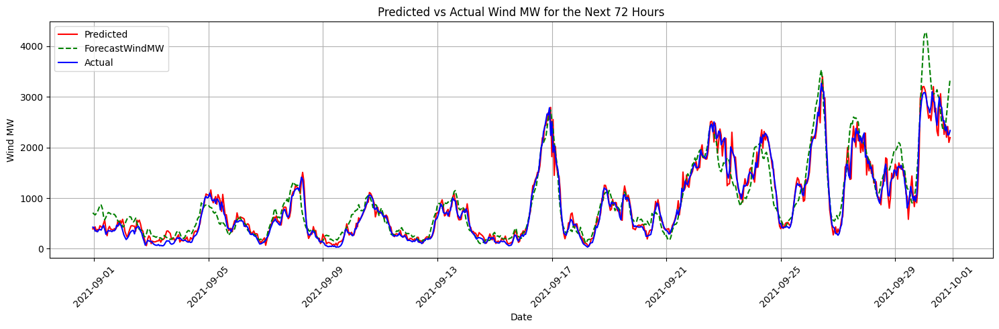

In [16]:

# The index for predictions should match the last 72 observations
predictions_index = data_filtered.index[-720:]  # Ensure this index is correct

# Create a DataFrame for predictions with the correct future index
predictions_df = pd.DataFrame(y_pred, index=predictions_index, columns=['Predicted'])

# Ensure actuals_df aligns with these 72 predictions
actuals_df = pd.DataFrame(data_filtered['ActualWindMW'].iloc[-720:].values, index=predictions_index, columns=['Actual'])

# Ensure forecast_wind_df is prepared correctly for the last 72 hours as well
forecast_wind_df = pd.DataFrame(data['ForecastWndMW'].iloc[-720:].values, index=predictions_index, columns=['ForecastWindMW'])

# Combine all three DataFrames
combined_df = pd.concat([predictions_df, actuals_df, forecast_wind_df], axis=1)

# Plotting
plt.figure(figsize=(15, 5))
plt.plot(combined_df.index, combined_df['Predicted'], 'r-', label='Predicted')
plt.plot(combined_df.index, combined_df['ForecastWindMW'], 'g--', label='ForecastWindMW')
plt.plot(combined_df.index, combined_df['Actual'], 'b-', label='Actual')

plt.legend()
plt.xlabel('Date')
plt.ylabel('Wind MW')
plt.title('Predicted vs Actual Wind MW for the Next 72 Hours')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()

## Comparing models